# (Archive for imports)

In [3]:
# from datetime import datetime
# from matplotlib import dates
# from statsmodels.tsa.holtwinters import ExponentialSmoothing
# from sklearn.metrics import mean_squared_error,mean_absolute_error
# from statsmodels.tsa.statespace.tools import diff
# from statsmodels.tsa.stattools import acovf,acf,pacf,pacf_yw,pacf_ols
# from pandas.plotting import lag_plot
# from statsmodels.tsa.stattools import adfuller,kpss,coint,bds,q_stat,grangercausalitytests,levinson_durbin
# from pmdarima import auto_arima
# from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

# Standard imports 

In [149]:
import numpy as np
import pandas as pd
import datetime as dt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# Read dataset

In [150]:
cd C:\Users\tammo\OneDrive\Desktop\FC

C:\Users\tammo\OneDrive\Desktop\FC


In [151]:
pwd

'C:\\Users\\tammo\\OneDrive\\Desktop\\FC'

In [152]:
# WITHOUT INDEX COLUMN 
df = pd.read_excel('Daten_ForecastingChallenge - Q42017.xlsx').drop('Unnamed: 0',axis=1)

In [20]:
# WITH INDEX COLUMN
# df = pd.read_excel('Daten_ForecastingChallenge - Q42017.xlsx',index_col=2).drop('Unnamed: 0',axis=1)

# Transform week number into an isodate, set column 'isodate' as index

In [88]:
df['isodate'] = df[['Due_date']].apply(lambda x: dt.datetime.strptime(str(x['Due_date'])+'-1', "%Y%W-%w"),axis=1)

In [89]:
df.set_index(['isodate'],inplace=True)

In [90]:
df.index = pd.DatetimeIndex(df.index).to_period('W')

In [11]:
# TO CUSTOMIZE AND APPLY!

# Set "date" to be the index
# df.set_index('date',inplace=True)
# df.index.freq = 'MS'
# df.head()

In [12]:
# df.index.freq = 'W' # Weekly frequency

In [13]:
# SHOW HEAD VALUES FOR 2014
df.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,176316,NaN
2018-03-26/2018-04-01,Product_20,201813,13,201752,516510,NaN
2018-03-26/2018-04-01,Product_22,201813,13,201752,237587,NaN
2018-03-26/2018-04-01,Product_30,201813,13,201752,393741,NaN
2018-03-26/2018-04-01,Product_39,201813,13,201752,92112,NaN


# Prepare Data

## Only selected certain product and drop duplicates

In [796]:
len(df)

27064

In [91]:
df19 = df[df['Sp_number']=='Product_19']
df20 = df[df['Sp_number']=='Product_20']
df22 = df[df['Sp_number']=='Product_22']
df30 = df[df['Sp_number']=='Product_30']
df39 = df[df['Sp_number']=='Product_39']
df48 = df[df['Sp_number']=='Product_48']
df50 = df[df['Sp_number']=='Product_50']
df55 = df[df['Sp_number']=='Product_55']
df57 = df[df['Sp_number']=='Product_57']
df67 = df[df['Sp_number']=='Product_67']

In [98]:
len(df19)

2717

In [99]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2014-01-06/2014-01-12,Product_19,201401,5,201348,421559,209000.0
2014-01-06/2014-01-12,Product_19,201401,4,201349,425917,209000.0
2014-01-06/2014-01-12,Product_19,201401,3,201350,250756,209000.0
2014-01-06/2014-01-12,Product_19,201401,2,201351,244710,209000.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834,209000.0


In [100]:
# Durch Mikhails Funktion ersetzt, nur zu Testzwecken!

# df19 = df19[df19['Fc_horizon']==1]
# df20 = df20[df20['Fc_horizon']==1]
# df22 = df22[df22['Fc_horizon']==1]
# df30 = df30[df30['Fc_horizon']==1]
# df39 = df39[df39['Fc_horizon']==1]
# df48 = df48[df48['Fc_horizon']==1]
# df50 = df50[df50['Fc_horizon']==1]
# df55 = df55[df55['Fc_horizon']==1]
# df57 = df57[df57['Fc_horizon']==1]
# df67 = df67[df67['Fc_horizon']==1]

In [101]:
len(df19)

2717

In [102]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2014-01-06/2014-01-12,Product_19,201401,5,201348,421559,209000.0
2014-01-06/2014-01-12,Product_19,201401,4,201349,425917,209000.0
2014-01-06/2014-01-12,Product_19,201401,3,201350,250756,209000.0
2014-01-06/2014-01-12,Product_19,201401,2,201351,244710,209000.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834,209000.0


In [70]:
# df20 = df20.sort_index(ascending=True)

In [71]:
df20.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2014-01-06/2014-01-12,Product_20,201401,5,201348,654476,628000.0
2014-01-06/2014-01-12,Product_20,201401,4,201349,552284,628000.0
2014-01-06/2014-01-12,Product_20,201401,3,201350,543829,628000.0
2014-01-06/2014-01-12,Product_20,201401,2,201351,545530,628000.0
2014-01-06/2014-01-12,Product_20,201401,1,201352,523579,628000.0


## Prepare exogenous data

In [103]:
def calculate_forecast(df):
    '''
    Returns youngest available forecasted values for next quartal in new column 'Forecast', especially for SARIMAX models.
    input: df with columns Fc_horizon, Fc_and_Order. Index format is ...
    output: df with an additional column 'Forecast'
    '''
    df_ = df[:'2018-01-01/2018-01-07'].copy()
    dates = df_.index.unique()
    # print(len(dates),dates)
    horizons = df_.Fc_horizon.unique()
    counter = 13
    data = {}
    
    for date in dates:
        forecast = df_.Fc_and_order.loc[(df_.Fc_horizon == counter) & (df_.index == date)].values.tolist()
        counter-=1
        data[date] = forecast
        
    df__ = pd.DataFrame.from_dict(data, orient='index', columns=['Forecast_NEW'])
    df["NEW"] = df__['Forecast_NEW']
    df1 = df.loc[df['Fc_horizon'] == 1]
    df_new = df[df['NEW'].notna()].drop_duplicates(subset=['Fc_horizon'])
    df_conc = pd.concat([df1,df_new])
    df_conc.sort_index(ascending=False, inplace=True)
    df_conc['Fc_and_order'][df_conc['NEW'].notna()] = 0
    df_conc['NEW'][df_conc['NEW'].isna()] = 0
    # df_conc[df_conc['Billing'].isna()] = 0
    df_conc['Forecast'] = df_conc["Fc_and_order"] + df_conc['NEW']
    return df_conc[['Sp_number', 'Due_date', 'Fc_horizon', 'Fc_date', 'Fc_and_order', 'Forecast', 'Billing']]

In [125]:
df19 = calculate_forecast(df19)
df20 = calculate_forecast(df20)
df22 = calculate_forecast(df22)
df30 = calculate_forecast(df30)
df39 = calculate_forecast(df39)
df48 = calculate_forecast(df48)
df50 = calculate_forecast(df50)
df55 = calculate_forecast(df55)
df57 = calculate_forecast(df57)
df67 = calculate_forecast(df67)

In [126]:
df19.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,0,176316.0,NaN
2018-03-19/2018-03-25,Product_19,201812,12,201752,0,337246.0,NaN
2018-03-12/2018-03-18,Product_19,201811,11,201752,0,266735.0,NaN
2018-03-05/2018-03-11,Product_19,201810,10,201752,0,274827.0,NaN
2018-02-26/2018-03-04,Product_19,201809,9,201752,0,130324.0,NaN


In [127]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_19,201405,1,201404,126028,126028.0,269000.0
2014-01-27/2014-02-02,Product_19,201404,1,201403,206085,206085.0,207000.0
2014-01-20/2014-01-26,Product_19,201403,1,201402,449633,449633.0,459000.0
2014-01-13/2014-01-19,Product_19,201402,1,201401,262289,262289.0,279997.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834,220834.0,209000.0


In [128]:
df19 = df19.drop_duplicates(['Due_date'])
df20 = df20.drop_duplicates(['Due_date'])
df22 = df22.drop_duplicates(['Due_date'])
df30 = df30.drop_duplicates(['Due_date'])
df39 = df39.drop_duplicates(['Due_date'])
df48 = df48.drop_duplicates(['Due_date'])
df50 = df50.drop_duplicates(['Due_date'])
df55 = df55.drop_duplicates(['Due_date'])
df57 = df57.drop_duplicates(['Due_date'])
df67 = df67.drop_duplicates(['Due_date'])

In [129]:
len(df19)

215

In [130]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_19,201405,1,201404,126028,126028.0,269000.0
2014-01-27/2014-02-02,Product_19,201404,1,201403,206085,206085.0,207000.0
2014-01-20/2014-01-26,Product_19,201403,1,201402,449633,449633.0,459000.0
2014-01-13/2014-01-19,Product_19,201402,1,201401,262289,262289.0,279997.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834,220834.0,209000.0


In [131]:
df19exo = df19
df20exo = df20
df22exo = df22
df30exo = df30
df39exo = df39
df48exo = df48
df50exo = df50
df55exo = df55
df57exo = df57
df67exo = df67

In [132]:
df19exo.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,0,176316.0,NaN
2018-03-19/2018-03-25,Product_19,201812,12,201752,0,337246.0,NaN
2018-03-12/2018-03-18,Product_19,201811,11,201752,0,266735.0,NaN
2018-03-05/2018-03-11,Product_19,201810,10,201752,0,274827.0,NaN
2018-02-26/2018-03-04,Product_19,201809,9,201752,0,130324.0,NaN


In [133]:
df19 = df19.dropna()
df20 = df20.dropna()
df22 = df22.dropna()
df30 = df30.dropna()
df39 = df39.dropna()
df48 = df48.dropna()
df50 = df50.dropna()
df55 = df55.dropna()
df57 = df57.dropna()
df67 = df67.dropna()

In [134]:
len(df19)

202

In [135]:
len(df19exo)

215

In [705]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2014-02-03/2014-02-09,Product_19,201405,1,201404,126028.0,269000.0
2014-01-27/2014-02-02,Product_19,201404,1,201403,206085.0,207000.0
2014-01-20/2014-01-26,Product_19,201403,1,201402,449633.0,459000.0
2014-01-13/2014-01-19,Product_19,201402,1,201401,262289.0,279997.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834.0,209000.0


[Text(0, 0.5, 'Volume'), Text(0.5, 0, 'Time')]

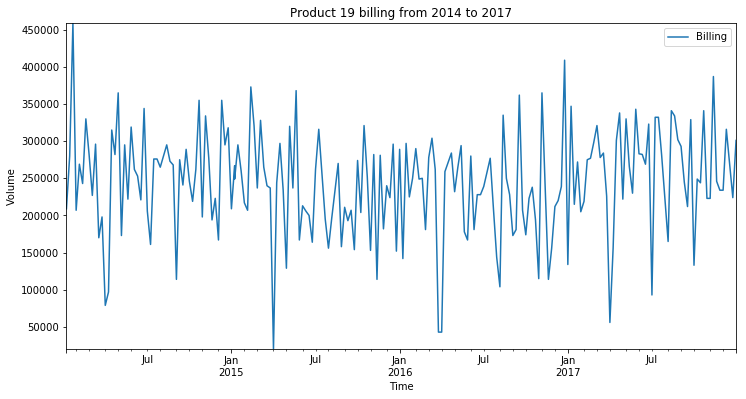

In [782]:
title = 'Product 19 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True)
ax.set(xlabel=xlabel,ylabel=ylabel)

## Convert Fc_and_order into float

In [168]:
df19.columns

Index(['Sp_number', 'Due_date', 'Fc_horizon', 'Fc_date', 'Fc_and_order',
       'Billing'],
      dtype='object')

In [14]:
df['Fc_and_order'] = df['Fc_and_order'].astype(float)

In [15]:
df19['Fc_and_order'] = df19['Fc_and_order'].astype(float)

In [352]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2014-03-17/2014-03-23,Product_19,201411,13,201350,190591.0,170000.0
2014-03-03/2014-03-09,Product_19,201409,13,201348,177902.0,227000.0
2014-02-10/2014-02-16,Product_19,201406,13,201345,496048.0,243000.0
2014-01-20/2014-01-26,Product_19,201403,13,201342,287652.0,459000.0
2014-01-13/2014-01-19,Product_19,201402,13,201341,216909.0,279997.0


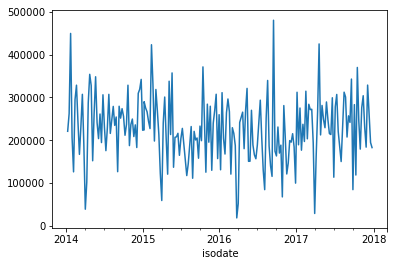

In [16]:
df19['Fc_and_order'].plot()

## Prepare data for Granger causality tests

In [17]:
granger19_1 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==1)].dropna()
granger19_2 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==2)].dropna()
granger19_3 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==3)].dropna()
granger19_4 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==4)].dropna()
granger19_5 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==5)].dropna()
granger19_6 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==6)].dropna()
granger19_7 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==7)].dropna()
granger19_8 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==8)].dropna()
granger19_9 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==9)].dropna()
granger19_10 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==10)].dropna()
granger19_11 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==11)].dropna()
granger19_12 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==12)].dropna()
granger19_13 = df[(df['Sp_number']=='Product_19') & (df['Fc_horizon']==13)].dropna()

In [18]:
granger20_1 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==1)].dropna()
granger20_2 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==2)].dropna()
granger20_3 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==3)].dropna()
granger20_4 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==4)].dropna()
granger20_5 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==5)].dropna()
granger20_6 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==6)].dropna()
granger20_7 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==7)].dropna()
granger20_8 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==8)].dropna()
granger20_9 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==9)].dropna()
granger20_10 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==10)].dropna()
granger20_11 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==11)].dropna()
granger20_12 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==12)].dropna()
granger20_13 = df[(df['Sp_number']=='Product_20') & (df['Fc_horizon']==13)].dropna()

In [19]:
granger22_1 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==1)].dropna()
granger22_2 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==2)].dropna()
granger22_3 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==3)].dropna()
granger22_4 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==4)].dropna()
granger22_5 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==5)].dropna()
granger22_6 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==6)].dropna()
granger22_7 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==7)].dropna()
granger22_8 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==8)].dropna()
granger22_9 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==9)].dropna()
granger22_10 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==10)].dropna()
granger22_11 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==11)].dropna()
granger22_12 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==12)].dropna()
granger22_13 = df[(df['Sp_number']=='Product_22') & (df['Fc_horizon']==13)].dropna()

In [20]:
granger30_1 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==1)].dropna()
granger30_2 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==2)].dropna()
granger30_3 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==3)].dropna()
granger30_4 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==4)].dropna()
granger30_5 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==5)].dropna()
granger30_6 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==6)].dropna()
granger30_7 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==7)].dropna()
granger30_8 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==8)].dropna()
granger30_9 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==9)].dropna()
granger30_10 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==10)].dropna()
granger30_11 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==11)].dropna()
granger30_12 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==12)].dropna()
granger30_13 = df[(df['Sp_number']=='Product_30') & (df['Fc_horizon']==13)].dropna()

In [21]:
granger39_1 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==1)].dropna()
granger39_2 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==2)].dropna()
granger39_3 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==3)].dropna()
granger39_4 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==4)].dropna()
granger39_5 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==5)].dropna()
granger39_6 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==6)].dropna()
granger39_7 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==7)].dropna()
granger39_8 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==8)].dropna()
granger39_9 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==9)].dropna()
granger39_10 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==10)].dropna()
granger39_11 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==11)].dropna()
granger39_12 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==12)].dropna()
granger39_13 = df[(df['Sp_number']=='Product_39') & (df['Fc_horizon']==13)].dropna()

In [22]:
granger48_1 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==1)].dropna()
granger48_2 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==2)].dropna()
granger48_3 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==3)].dropna()
granger48_4 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==4)].dropna()
granger48_5 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==5)].dropna()
granger48_6 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==6)].dropna()
granger48_7 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==7)].dropna()
granger48_8 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==8)].dropna()
granger48_9 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==9)].dropna()
granger48_10 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==10)].dropna()
granger48_11 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==11)].dropna()
granger48_12 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==12)].dropna()
granger48_13 = df[(df['Sp_number']=='Product_48') & (df['Fc_horizon']==13)].dropna()

In [23]:
granger50_1 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==1)].dropna()
granger50_2 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==2)].dropna()
granger50_3 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==3)].dropna()
granger50_4 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==4)].dropna()
granger50_5 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==5)].dropna()
granger50_6 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==6)].dropna()
granger50_7 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==7)].dropna()
granger50_8 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==8)].dropna()
granger50_9 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==9)].dropna()
granger50_10 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==10)].dropna()
granger50_11 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==11)].dropna()
granger50_12 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==12)].dropna()
granger50_13 = df[(df['Sp_number']=='Product_50') & (df['Fc_horizon']==13)].dropna()

In [24]:
granger55_1 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==1)].dropna()
granger55_2 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==2)].dropna()
granger55_3 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==3)].dropna()
granger55_4 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==4)].dropna()
granger55_5 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==5)].dropna()
granger55_6 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==6)].dropna()
granger55_7 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==7)].dropna()
granger55_8 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==8)].dropna()
granger55_9 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==9)].dropna()
granger55_10 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==10)].dropna()
granger55_11 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==11)].dropna()
granger55_12 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==12)].dropna()
granger55_13 = df[(df['Sp_number']=='Product_55') & (df['Fc_horizon']==13)].dropna()

In [25]:
granger57_1 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==1)].dropna()
granger57_2 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==2)].dropna()
granger57_3 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==3)].dropna()
granger57_4 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==4)].dropna()
granger57_5 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==5)].dropna()
granger57_6 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==6)].dropna()
granger57_7 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==7)].dropna()
granger57_8 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==8)].dropna()
granger57_9 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==9)].dropna()
granger57_10 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==10)].dropna()
granger57_11 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==11)].dropna()
granger57_12 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==12)].dropna()
granger57_13 = df[(df['Sp_number']=='Product_57') & (df['Fc_horizon']==13)].dropna()

In [26]:
granger67_1 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==1)].dropna()
granger67_2 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==2)].dropna()
granger67_3 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==3)].dropna()
granger67_4 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==4)].dropna()
granger67_5 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==5)].dropna()
granger67_6 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==6)].dropna()
granger67_7 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==7)].dropna()
granger67_8 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==8)].dropna()
granger67_9 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==9)].dropna()
granger67_10 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==10)].dropna()
granger67_11 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==11)].dropna()
granger67_12 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==12)].dropna()
granger67_13 = df[(df['Sp_number']=='Product_67') & (df['Fc_horizon']==13)].dropna()

In [27]:
len(granger19_1)

202

In [28]:
len(granger19_13)

203

## Granger causality tests

In [183]:
from statsmodels.tsa.stattools import grangercausalitytests

grangercausalitytests(granger1[['Fc_and_order','Billing']],maxlag=5);


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1936  , p=0.6604  , df_denom=198, df_num=1
ssr based chi2 test:   chi2=0.1966  , p=0.6575  , df=1
likelihood ratio test: chi2=0.1965  , p=0.6576  , df=1
parameter F test:         F=0.1936  , p=0.6604  , df_denom=198, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1651  , p=0.1175  , df_denom=195, df_num=2
ssr based chi2 test:   chi2=4.4412  , p=0.1085  , df=2
likelihood ratio test: chi2=4.3926  , p=0.1112  , df=2
parameter F test:         F=2.1651  , p=0.1175  , df_denom=195, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2427  , p=0.2955  , df_denom=192, df_num=3
ssr based chi2 test:   chi2=3.8639  , p=0.2765  , df=3
likelihood ratio test: chi2=3.8269  , p=0.2808  , df=3
parameter F test:         F=1.2427  , p=0.2955  , df_denom=192, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4982  , p=0.2044  

Essentially we're looking for extremely low p-values, which we relatively have for lag=2. Further investigation is needed.

In [125]:
from statsmodels.tsa.stattools import grangercausalitytests

grangercausalitytests(granger13[['Fc_and_order','Billing']],maxlag=5);


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3334  , p=0.5647  , df_denom=131, df_num=1
ssr based chi2 test:   chi2=0.3410  , p=0.5592  , df=1
likelihood ratio test: chi2=0.3406  , p=0.5595  , df=1
parameter F test:         F=0.3334  , p=0.5647  , df_denom=131, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3623  , p=0.6968  , df_denom=128, df_num=2
ssr based chi2 test:   chi2=0.7528  , p=0.6863  , df=2
likelihood ratio test: chi2=0.7507  , p=0.6871  , df=2
parameter F test:         F=0.3623  , p=0.6968  , df_denom=128, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6295  , p=0.5973  , df_denom=125, df_num=3
ssr based chi2 test:   chi2=1.9941  , p=0.5736  , df=3
likelihood ratio test: chi2=1.9792  , p=0.5767  , df=3
parameter F test:         F=0.6295  , p=0.5973  , df_denom=125, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7266  , p=0.5754  

##### ACF Plots
Plotting the magnitude of the autocorrelations over the first few (20-40) lags can say a lot about a time series.

In [581]:
from statsmodels.tsa.stattools import acovf,acf,pacf,pacf_yw,pacf_ols
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

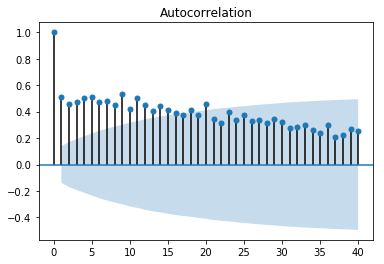

In [582]:
plot_acf(df50['Billing'],lags=40);

This plot indicates non-stationary data, as there are a large number of lags before ACF values drop off.

##### PACF Plots
Partial autocorrelations work best with stationary data. Let's look first at <strong>Daily Total Female Births</strong>:

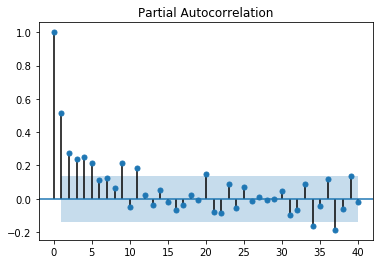

In [583]:
plot_pacf(df50['Billing'],lags=40);

##### ARIMA forecast into the future

In [610]:
model = ARIMA(df50['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

In [ ]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('ARIMA (0,1,1) FORECAST')

In [611]:
len(fcast)

13

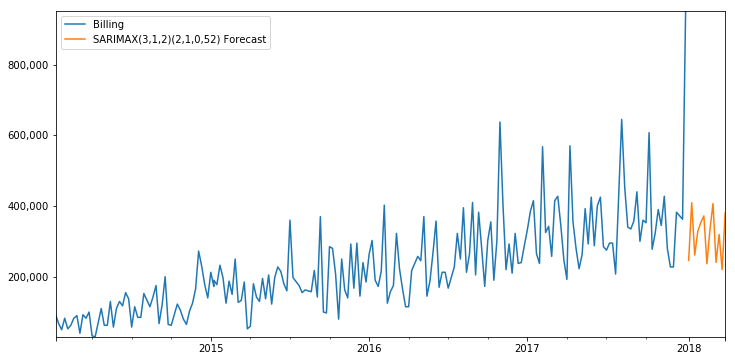

In [273]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [661]:
model = SARIMAX(df50['Billing'],order=(3,1,2),seasonal_order=(0,0,0,0))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2558.696
Date:                Wed, 25 May 2022   AIC                           5129.392
Time:                        16:35:05   BIC                           5149.211
Sample:                    12-31-2017   HQIC                          5137.412
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0488      0.488      0.100      0.920      -0.907       1.005
ar.L2         -0.1474      0.081     -1.827      0.068      -0.305       0.011
ar.L3         -0.1053      0.077     -1.364      0.173      -0.257       0.046
ma.L1         -0.9806      0.511     -1.919      0.055      -1.982       0.021
ma.L2          0.1121      0.462      0.243      0.808      -0.793       1.017
sigma2      6.887e+09   6.82e-11   1.01e+20      0.000    6.89e+09    6.89e+09
===================================================================================
Ljung-Box (Q):                       63.20   Jarque-Bera (JB):                88.36
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               0.23   Skew:                             1.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.64e+36. Standard errors may be unstable.
"""

In [662]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [611]:
len(fcast)

13

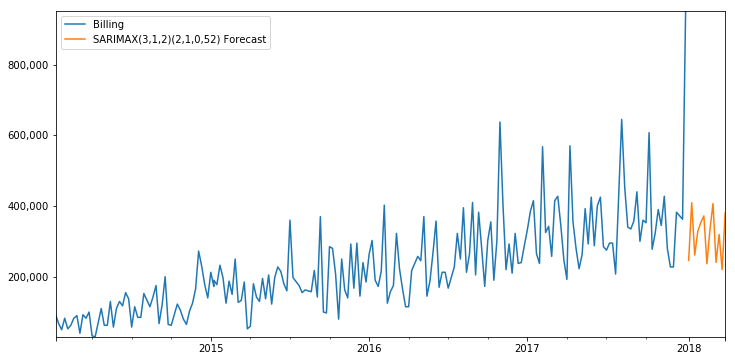

In [274]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

# FORECAST HORIZON 1: Q1/2018

In [170]:
from statsmodels.graphics.tsaplots import month_plot,quarter_plot

from statsmodels.tsa.arima_model import ARMA,ARIMA,ARMAResults,ARIMAResults
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from pmdarima import auto_arima

## APPROACH

1. Data inspection—plotting
2. ...
3. Auto_arima() → Auto_arima flow chart: https://otexts.com/fpp2/arima-r.html

### Tests for Autocorrelation — Lag Plotting
The arrays returned by <tt>.acf(df)</tt> and <tt>.pacf_yw(df)</tt> show the magnitude of the autocorrelation for a given $y$ at time $t$. Before we look at plotting arrays, let's look at the data itself for evidence of autocorrelation.

Pandas has a built-in plotting function that plots increasing $y_t$ values on the horizontal axis against lagged versions of the values $y_{t+1}$ on the vertical axis. If a dataset is non-stationary with an upward trend, then neighboring values should trend in the same way.

### Tests for Stationarity
A time series is <em>stationary</em> if the mean and variance are fixed between any two equidistant points. That is, no matter where you take your observations, the results should be the same. A times series that shows seasonality is <em>not</em> stationary.

A test for stationarity usually involves a <a href='https://en.wikipedia.org/wiki/Unit_root_test'>unit root</a> hypothesis test, where the null hypothesis $H_0$ is that the series is <em>nonstationary</em>, and contains a unit root. The alternate hypothesis $H_1$ supports stationarity. The <a href='https://en.wikipedia.org/wiki/Augmented_Dickey-Fuller_test'>augmented Dickey-Fuller</a> and <a href='https://en.wikipedia.org/wiki/KPSS_test'>Kwiatkowski-Phillips-Schmidt-Shin</a> tests are stationarity tests. 

#### Augmented Dickey-Fuller Test
To determine whether a series is stationary we can use the <a href='https://en.wikipedia.org/wiki/Augmented_Dickey-Fuller_test'>augmented Dickey-Fuller Test</a>. In this test the null hypothesis states that $\phi = 1$ (this is also called a unit test). The test returns several statistics we'll see in a moment. Our focus is on the p-value. A small p-value ($p<0.05$) indicates strong evidence against the null hypothesis.

#### Automate the augmented Dickey-Fuller Test
Since we'll be using it a lot to determine if an incoming time series is stationary, let's write a function that performs the augmented Dickey-Fuller Test.

In [30]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

### Granger Causality Tests
The <a href='https://en.wikipedia.org/wiki/Granger_causality'>Granger causality test</a> is a a hypothesis test to determine if one time series is useful in forecasting another. While it is fairly easy to measure correlations between series - when one goes up the other goes up, and vice versa - it's another thing to observe changes in one series correlated to changes in another after a consistent amount of time. This <em>may</em> indicate the presence of causality, that changes in the first series influenced the behavior of the second. However, it may also be that both series are affected by some third factor, just at different rates. Still, it can be useful if changes in one series can predict upcoming changes in another, whether there is causality or not. In this case we say that one series "Granger-causes" another.

In the case of two series, $y$ and $x$, the null hypothesis is that lagged values of $x$ do <em>not</em> explain variations in $y$.<br>
In other words, it assumes that $x_t$ doesn’t Granger-cause $y_t$.

The stattools <tt><strong>grangercausalitytests</strong></tt> function offers four tests for granger non-causality of 2 timeseries.

The function takes in a 2D array [y,x] and a maximum number of lags to test on x. We'll set maxlags to 3.

Essentially we're looking for extremely low p-values.

In [31]:
from statsmodels.tsa.stattools import grangercausalitytests

### Evaluating forecast accuracy
Two calculations related to linear regression are <a href='https://en.wikipedia.org/wiki/Mean_squared_error'><strong>mean squared error</strong></a> (MSE) and <a href='https://en.wikipedia.org/wiki/Root-mean-square_deviation'><strong>root mean squared error</strong></a> (RMSE)

The formula for the mean squared error is<br><br>
&nbsp;&nbsp;&nbsp;&nbsp;$MSE = {\frac 1 L} \sum\limits_{l=1}^L (y_{T+l} - \hat y_{T+l})^2$<br><br>
where $T$ is the last observation period and $l$ is the lag point up to $L$ number of test observations.

The formula for the root mean squared error is<br><br>
&nbsp;&nbsp;&nbsp;&nbsp;$RMSE = \sqrt{MSE} = \sqrt{{\frac 1 L} \sum\limits_{l=1}^L (y_{T+l} - \hat y_{T+l})^2}$<br><br>

The advantage of the RMSE is that it is expressed in the same units as the data.<br><br>

A method similar to the RMSE is the <a href='https://en.wikipedia.org/wiki/Mean_absolute_error'><strong>mean absolute error</strong></a> (MAE) which is the mean of the magnitudes of the error, given as<br><br>

&nbsp;&nbsp;&nbsp;&nbsp;$MAE = {\frac 1 L} \sum\limits_{l=1}^L \mid{y_{T+l}} - \hat y_{T+l}\mid$<br><br>

A forecast method that minimizes the MAE will lead to forecasts of the median, while minimizing the RMSE will lead to forecasts of the mean.

In [123]:
from statsmodels.tools.eval_measures import mse, rmse, meanabs

#### AIC / BIC
More sophisticated tests include the <a href='https://en.wikipedia.org/wiki/Akaike_information_criterion'><strong>Akaike information criterion</strong></a> (AIC) and the <a href='https://en.wikipedia.org/wiki/Bayesian_information_criterion'><strong>Bayesian information criterion</strong></a> (BIC).

The AIC evaluates a collection of models and estimates the quality of each model relative to the others. Penalties are provided for the number of parameters used in an effort to thwart overfitting. The lower the AIC and BIC, the better the model should be at forecasting.

These functions are available as

&nbsp;&nbsp;&nbsp;&nbsp;<tt>from from statsmodels.tools.eval_measures import aic, bic</tt>

but we seldom compute them alone as they are built into many of the statsmodels tools we use.

## Exposing Seasonality with Month and Quarter Plots
Statsmodels has two plotting functions that group data by month and by quarter. Note that if the data appears as months, you should employ <em>resampling</em> with an aggregate function before running a quarter plot. These plots return a <tt>matplotlib.Figure</tt> object.

### Run an ETS Decomposition (optional)
We probably won't learn a lot from it, but it never hurts to run an ETS Decomposition plot.

In [33]:
from statsmodels.tsa.seasonal import seasonal_decompose

## Save results Q1/2018

In [435]:
def _create_output(series, product:str):
    '''
    Input series format: index is equalt to dates (datetime format); one column with floats
    Output df format: product 19-, week 1-13, units (forecast)
    '''
    weeks = series.index.week
    product_ = pd.Series([product]*len(weeks))
    data = {'Product': product_, 'Week': weeks, 'Units': series.values}
    return pd.DataFrame(data, columns=data.keys())


def save_forecast(arr_of_dfs, filename='FORECAST_2018_Q1.xlsx'):
    # save in a directory 
    import os
    DIR = os.getcwd()
    if not os.path.exists(DIR):
        print("PROVIDE PATH TO FILE MANUALLY")
    FILE_NAME = filename
    PATH = os.path.join(DIR, FILE_NAME)
    
    # saving
    RES = pd.concat(arr_of_dfs, axis=0)
    RES.to_excel('FORECAST_2018_Q1.xlsx')
    print(f'SUCCESSFULLY SAVED IN {PATH}')

## Product_19

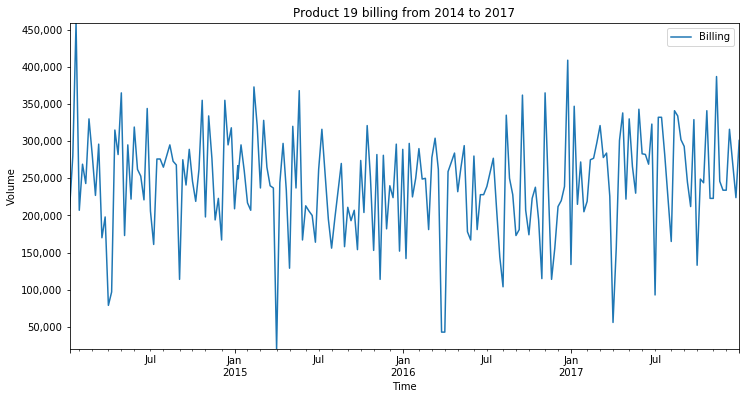

In [78]:
title = 'Product 19 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

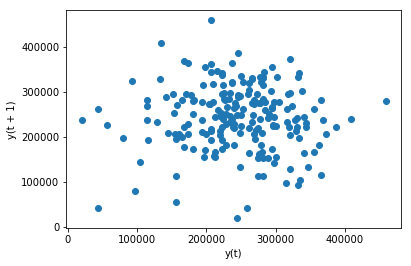

In [82]:
from pandas.plotting import lag_plot
lag_plot(df19['Billing'])

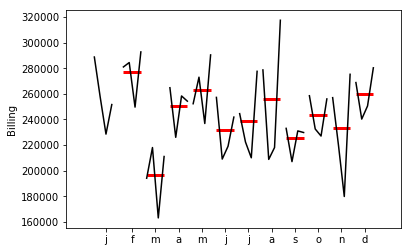

In [845]:
dfm = df19['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

# Only works without df.index = pd.DatetimeIndex(df.index).to_period('W') function

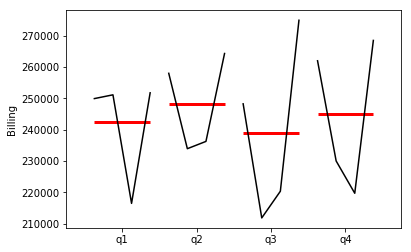

In [942]:
dfq = df19['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

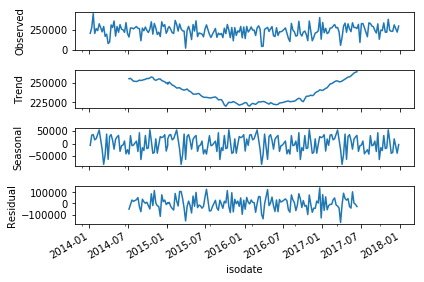

In [940]:
result = seasonal_decompose(df19['Billing'],model='add',freq=52)
result.plot();

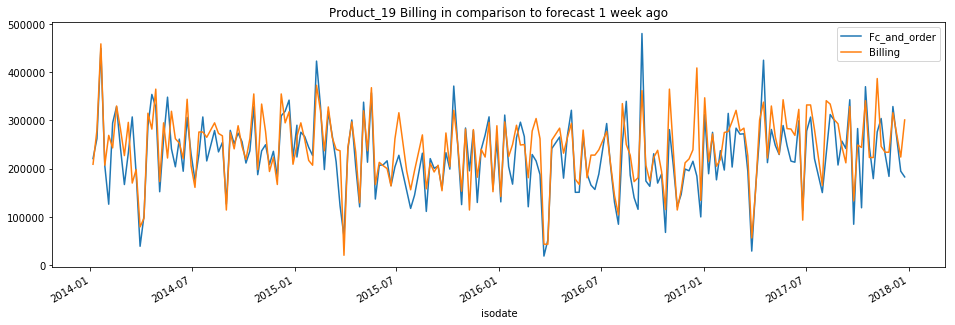

In [886]:
granger19_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_19 Billing in comparison to forecast 1 week ago');

In [913]:
MSE = mse(granger19_1['Fc_and_order'],granger19_1['Billing'])
RMSE = rmse(granger19_1['Fc_and_order'],granger19_1['Billing'])
MAE = meanabs(granger19_1['Fc_and_order'],granger19_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 2305351328.129
Client forecast RMSE: 48014.074
Client forecast  MAE: 35136.851


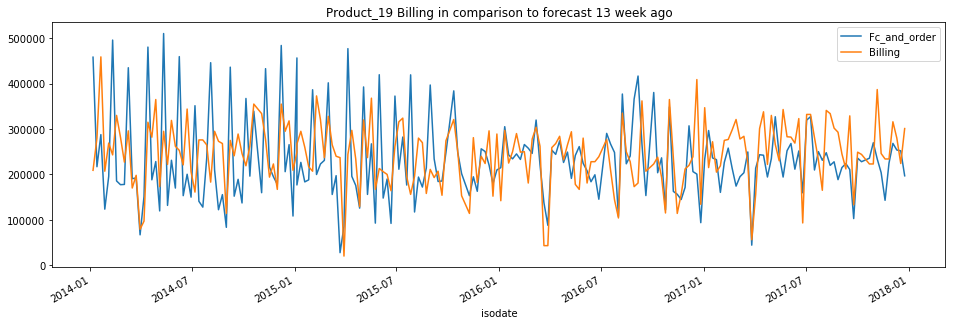

In [990]:
granger19_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_19 Billing in comparison to forecast 13 week ago');

In [914]:
MSE = mse(granger19_13['Fc_and_order'],granger19_13['Billing'])
RMSE = rmse(granger19_13['Fc_and_order'],granger19_13['Billing'])
MAE = meanabs(granger19_13['Fc_and_order'],granger19_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 9184674800.079
Client forecast RMSE: 95836.709
Client forecast  MAE: 75030.197


In [989]:
adf_test(df19['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic     -1.439953e+01
p-value                 8.554870e-27
# lags used             0.000000e+00
# observations          2.010000e+02
critical value (1%)    -3.463309e+00
critical value (5%)    -2.876029e+00
critical value (10%)   -2.574493e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [973]:
auto_arima(df19['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 0, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:                     ARMA(0, 0)   Log Likelihood               -2543.731
Method:                           css   S.D. of innovations          71238.423
Date:                Thu, 26 May 2022   AIC                           5091.461
Time:                        19:18:29   BIC                           5098.078
Sample:                             0   HQIC                          5094.138
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.438e+05   5012.318     48.637      0.000    2.34e+05    2.54e+05
==============================================================================
"""

In [1010]:
stepwise_fit = auto_arima(df19['Billing'],start_p=0,start_q=0,max_p=5,max_q=5,seasonal=False)
stepwise_fit.summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:                     ARMA(0, 0)   Log Likelihood               -2543.731
Method:                           css   S.D. of innovations          71238.423
Date:                Thu, 26 May 2022   AIC                           5091.461
Time:                        19:36:38   BIC                           5098.078
Sample:                             0   HQIC                          5094.138
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.438e+05   5012.318     48.637      0.000    2.34e+05    2.54e+05
==============================================================================
"""

In [136]:
train19 = df19['2017-09-30':]
test19 = df19[:'2017-09-30']

In [128]:
model = ARMA(train19['Billing'],order=(0,0))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  190
Model:                     ARMA(0, 0)   Log Likelihood               -2394.617
Method:                           css   S.D. of innovations          71991.941
Date:                Fri, 27 May 2022   AIC                           4793.234
Time:                        11:33:08   BIC                           4799.728
Sample:                    10-01-2017   HQIC                          4795.865
                         - 01-12-2014                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.422e+05   5222.844     46.377      0.000    2.32e+05    2.52e+05
==============================================================================
"""

In [129]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARMA (0,0) Predictions')

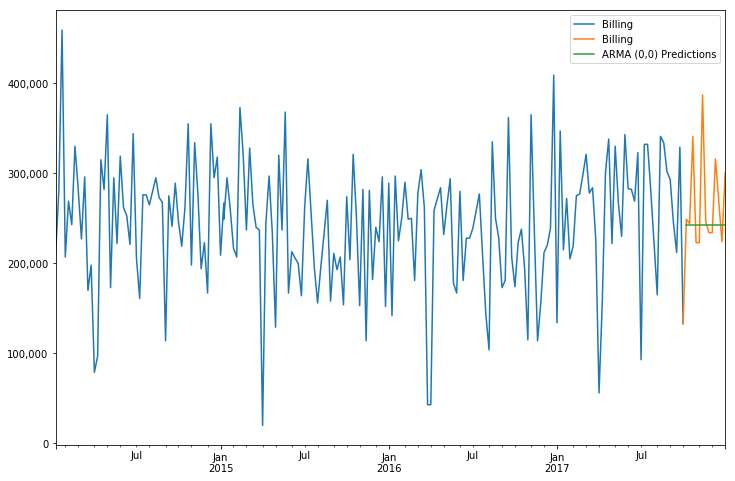

In [130]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train19['Billing'].plot(figsize=(12,8),legend=True)
test19['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [131]:
error = rmse(test19['Billing'],predictions)
error

63739.05665575302

In [88]:
auto_arima(df19['Billing'],seasonal=True,m=52).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  202
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood               -1914.606
Date:                            Sun, 29 May 2022   AIC                           3847.212
Time:                                    19:04:18   BIC                           3874.248
Sample:                                         0   HQIC                          3858.196
                                            - 202                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2601.2974   1.29e+04      0.202      0.840   -2.26e+04    2.78e+04
ar.L1         -0.6938      0.125     -5.546      0.000      -0.939      -0.449
ar.L2         -0.5417      0.148     -3.668      0.000      -0.831      -0.252
ar.L3         -0.4844      0.147     -3.299      0.001      -0.772      -0.197
ar.L4         -0.2712      0.167     -1.628      0.104      -0.598       0.055
ar.L5         -0.1458      0.139     -1.052      0.293      -0.418       0.126
ar.S.L52      -0.7572      0.124     -6.090      0.000      -1.001      -0.514
ar.S.L104     -0.3591      0.141     -2.550      0.011      -0.635      -0.083
sigma2      1.134e+10      0.005   2.08e+12      0.000    1.13e+10    1.13e+10
===================================================================================
Ljung-Box (Q):                       34.26   Jarque-Bera (JB):                 0.79
Prob(Q):                              0.73   Prob(JB):                         0.67
Heteroskedasticity (H):               1.08   Skew:                             0.07
Prob(H) (two-sided):                  0.78   Kurtosis:                         2.67
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.84e+28. Standard errors may be unstable.
"""

In [33]:
model = SARIMAX(train19['Billing'],order=(3,1,2),seasonal_order=(2,1,0,52),exog=train19['Fc_and_order'])
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  190
Model:             SARIMAX(3, 1, 2)x(2, 1, 0, 52)   Log Likelihood               -1675.510
Date:                            Sun, 29 May 2022   AIC                           3369.020
Time:                                    18:32:42   BIC                           3395.300
Sample:                                10-01-2017   HQIC                          3379.699
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.7963      0.075     10.676      0.000       0.650       0.943
ar.L1            0.2200      0.964      0.228      0.819      -1.669       2.109
ar.L2           -0.0279      0.251     -0.111      0.912      -0.520       0.465
ar.L3           -0.1544      0.262     -0.589      0.556      -0.668       0.359
ma.L1           -1.2068      0.967     -1.248      0.212      -3.102       0.689
ma.L2            0.3428      0.853      0.402      0.688      -1.329       2.014
ar.S.L52        -0.8244      0.176     -4.680      0.000      -1.170      -0.479
ar.S.L104       -0.2523      0.201     -1.258      0.209      -0.645       0.141
sigma2        3.705e+09   5.49e-10   6.74e+18      0.000    3.71e+09    3.71e+09
===================================================================================
Ljung-Box (Q):                       39.65   Jarque-Bera (JB):                 9.97
Prob(Q):                              0.49   Prob(JB):                         0.01
Heteroskedasticity (H):               1.22   Skew:                             0.10
Prob(H) (two-sided):                  0.51   Kurtosis:                         4.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.16e+34. Standard errors may be unstable.
"""

In [41]:
start = '2017-10-02'
end = '2017-12-31'
exog_forecast = test19[['Fc_and_order']]

In [42]:
exog_forecast

,Fc_and_order
isodate,
2017-12-25/2017-12-31,182723
2017-12-18/2017-12-24,194600
2017-12-04/2017-12-10,328866
2017-11-27/2017-12-03,183804
2017-11-20/2017-11-26,230685
2017-11-13/2017-11-19,304025
2017-11-06/2017-11-12,276242
2017-10-30/2017-11-05,179161
2017-10-23/2017-10-29,244925


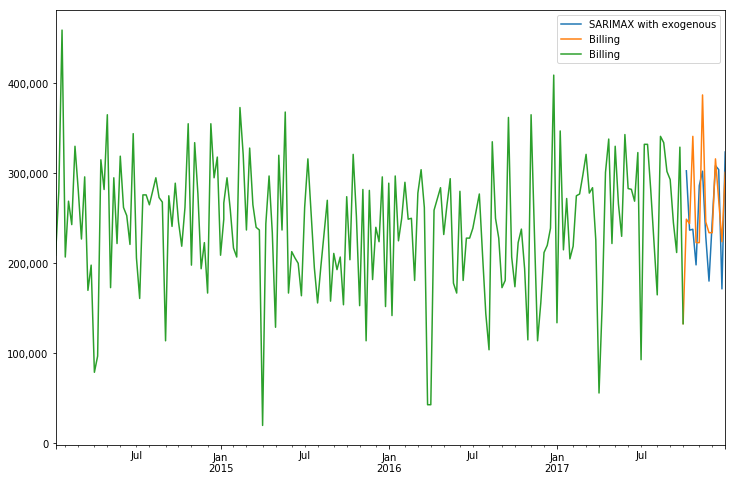

In [43]:
predictions = results.predict(start,end,exog=exog_forecast).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test19['Billing'].plot(legend=True)
train19['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [44]:
error = rmse(test19['Billing'],predictions)
error

82034.14484139525

In [159]:
model = SARIMAX(df19['Billing'],exog=df19['Fc_and_order'],order=(3,1,2),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()

exog_forecast = df19[:'2018-01-01']['Fc_and_order']
fcast = results.predict('2018-01-01','2018-04-01',exog=exog_forecast).rename('SARIMAX(3,1,2)(2,1,0,52) Forecast')

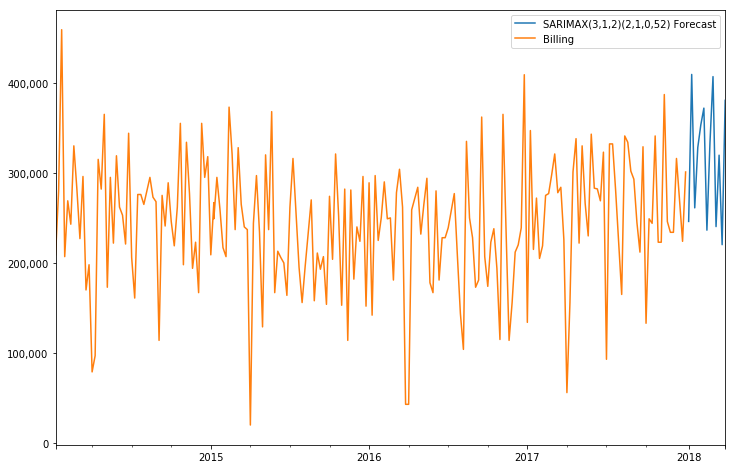

In [160]:
ax = fcast.plot(figsize=(12,8),legend=True)
df19['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title =''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

##### ARMA forecast into the future

In [279]:
model = ARMA(df19['Billing'],order=(0,0))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:                     ARMA(0, 0)   Log Likelihood               -2543.731
Method:                           css   S.D. of innovations          71238.423
Date:                Fri, 27 May 2022   AIC                           5091.461
Time:                        15:31:37   BIC                           5098.078
Sample:                    12-31-2017   HQIC                          5094.138
                         - 01-12-2014                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.438e+05   5012.318     48.637      0.000    2.34e+05    2.54e+05
==============================================================================
"""

In [281]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARMA (0,0) FORECAST')

In [282]:
len(fcast)

13

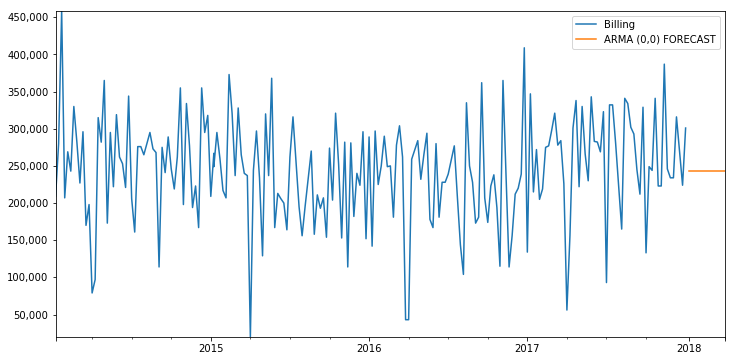

In [283]:
title = ''
ylabel = ''
xlabel = ''
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [275]:
model = SARIMAX(df19['Billing'],order=(3,1,2),seasonal_order=(2,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(3, 1, 2)x(2, 1, 0, 52)   Log Likelihood               -1913.000
Date:                            Fri, 27 May 2022   AIC                           3842.000
Time:                                    15:29:28   BIC                           3866.031
Sample:                                12-31-2017   HQIC                          3851.763
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1937      0.899     -0.216      0.829      -1.955       1.568
ar.L2         -0.0814      0.232     -0.351      0.725      -0.536       0.373
ar.L3         -0.1691      0.156     -1.081      0.280      -0.476       0.138
ma.L1         -0.5277      0.900     -0.586      0.558      -2.292       1.237
ma.L2         -0.1272      0.782     -0.163      0.871      -1.661       1.406
ar.S.L52      -0.7530      0.119     -6.322      0.000      -0.986      -0.520
ar.S.L104     -0.3417      0.139     -2.464      0.014      -0.614      -0.070
sigma2      1.114e+10   1.25e-10   8.92e+19      0.000    1.11e+10    1.11e+10
===================================================================================
Ljung-Box (Q):                       29.35   Jarque-Bera (JB):                 0.65
Prob(Q):                              0.89   Prob(JB):                         0.72
Heteroskedasticity (H):               1.00   Skew:                             0.04
Prob(H) (two-sided):                  0.99   Kurtosis:                         2.69
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.86e+36. Standard errors may be unstable.
"""

In [276]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [277]:
len(fcast)

13

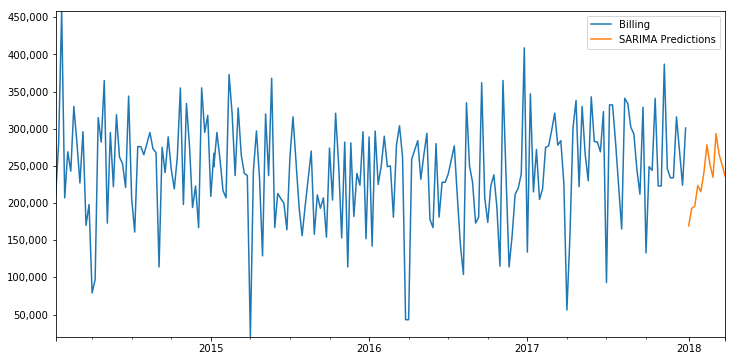

In [278]:
title = ''
ylabel = ''
xlabel = ''
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [155]:
df19.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_19,201405,1,201404,126028,126028.0,269000.0
2014-01-27/2014-02-02,Product_19,201404,1,201403,206085,206085.0,207000.0
2014-01-20/2014-01-26,Product_19,201403,1,201402,449633,449633.0,459000.0
2014-01-13/2014-01-19,Product_19,201402,1,201401,262289,262289.0,279997.0
2014-01-06/2014-01-12,Product_19,201401,1,201352,220834,220834.0,209000.0


In [156]:
model = SARIMAX(df19['Billing'],exog=df19['Forecast'],order=(5,1,0),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood                -489.213
Date:                            Sun, 29 May 2022   AIC                            996.427
Time:                                    19:28:41   BIC                           1011.626
Sample:                                12-31-2017   HQIC                          1001.922
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.6817      0.103      6.620      0.000       0.480       0.884
ar.L1         -1.0204      0.367     -2.777      0.005      -1.741      -0.300
ar.L2         -0.7180      0.538     -1.334      0.182      -1.773       0.337
ar.L3         -0.7254      0.401     -1.807      0.071      -1.512       0.061
ar.L4         -0.7112      0.378     -1.881      0.060      -1.452       0.030
ar.L5         -0.3253      0.340     -0.957      0.339      -0.992       0.341
ar.S.L52      -1.0469      0.367     -2.850      0.004      -1.767      -0.327
ar.S.L104     -0.1055      0.323     -0.327      0.744      -0.738       0.527
sigma2      3.768e+09   1.01e-10   3.74e+19      0.000    3.77e+09    3.77e+09
===================================================================================
Ljung-Box (Q):                       19.50   Jarque-Bera (JB):                 0.83
Prob(Q):                              1.00   Prob(JB):                         0.66
Heteroskedasticity (H):               1.39   Skew:                             0.22
Prob(H) (two-sided):                  0.56   Kurtosis:                         2.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.97e+35. Standard errors may be unstable.
"""

In [157]:
exog_forecast = df19exo[:'2018-01-01'][['Forecast']]

In [158]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [159]:
len(fcast)

13

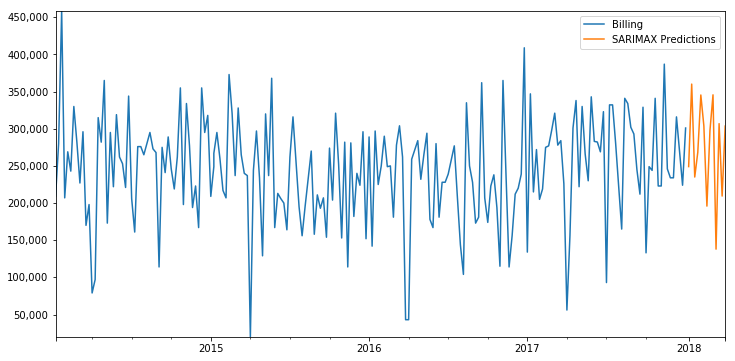

In [160]:
title = ''
ylabel = ''
xlabel = ''
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_20

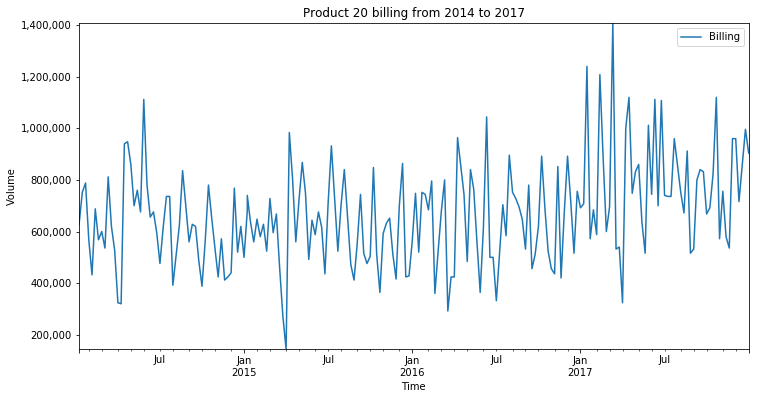

In [507]:
title = 'Product 20 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

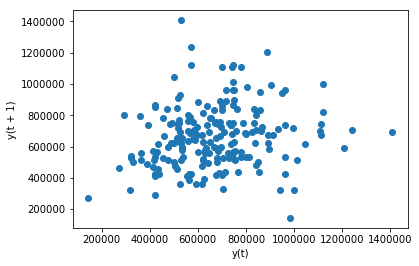

In [508]:
from pandas.plotting import lag_plot
lag_plot(df20['Billing'])

In [509]:
dfm = df20['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

IncompatibleFrequency: Frequency <Week: weekday=6> cannot be resampled to <MonthEnd>, as they are not sub or super periods

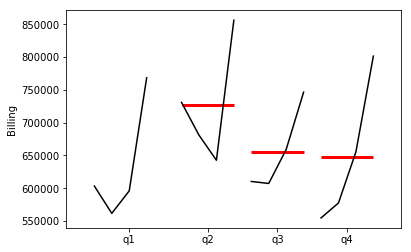

In [849]:
dfq = df20['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

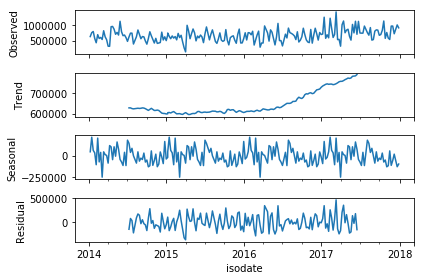

In [510]:
result = seasonal_decompose(df20['Billing'],model='add',freq=52)
result.plot();

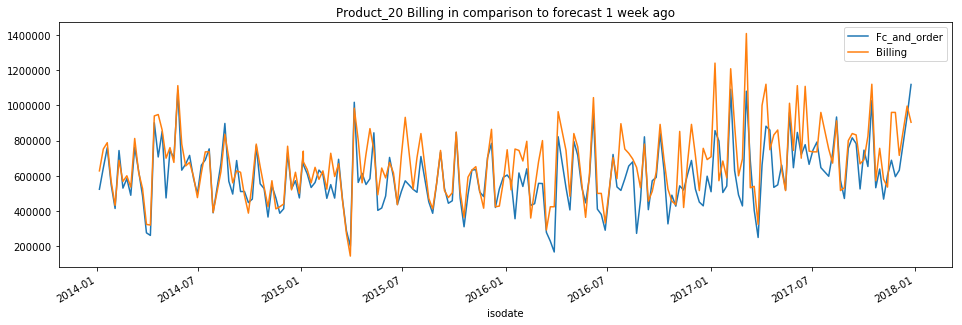

In [887]:
granger20_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_20 Billing in comparison to forecast 1 week ago');

In [915]:
MSE = mse(granger20_1['Fc_and_order'],granger20_1['Billing'])
RMSE = rmse(granger20_1['Fc_and_order'],granger20_1['Billing'])
MAE = meanabs(granger20_1['Fc_and_order'],granger20_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 18533694154.604
Client forecast RMSE: 136138.511
Client forecast  MAE: 96814.723


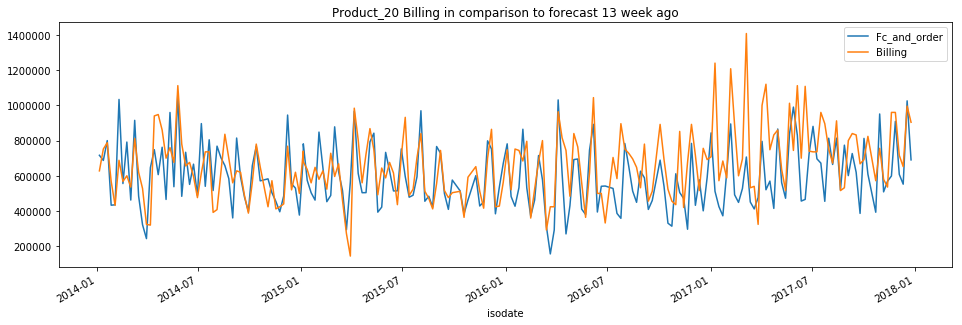

In [897]:
granger20_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_20 Billing in comparison to forecast 13 week ago');

In [916]:
MSE = mse(granger20_13['Fc_and_order'],granger20_13['Billing'])
RMSE = rmse(granger20_13['Fc_and_order'],granger20_13['Billing'])
MAE = meanabs(granger20_13['Fc_and_order'],granger20_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 38483110597.768
Client forecast RMSE: 196171.126
Client forecast  MAE: 147006.478


In [469]:
adf_test(df20['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -2.078196
p-value                   0.253372
# lags used              10.000000
# observations          191.000000
critical value (1%)      -3.465059
critical value (5%)      -2.876794
critical value (10%)     -2.574901
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [511]:
auto_arima(df20['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(3, 1, 2)   Log Likelihood               -2718.941
Method:                       css-mle   S.D. of innovations         180215.605
Date:                Sun, 29 May 2022   AIC                           5451.882
Time:                        17:31:50   BIC                           5475.005
Sample:                             1   HQIC                          5461.239
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -853.2581    885.448     -0.964      0.336   -2588.703     882.187
ar.L1.D.y     -0.5647      0.151     -3.733      0.000      -0.861      -0.268
ar.L2.D.y     -0.1915      0.087     -2.194      0.029      -0.363      -0.020
ar.L3.D.y     -0.2961      0.071     -4.143      0.000      -0.436      -0.156
ma.L1.D.y     -0.3210      0.148     -2.173      0.031      -0.611      -0.031
ma.L2.D.y     -0.5444      0.142     -3.832      0.000      -0.823      -0.266
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.2601           -0.0000j            1.2601           -0.5000
AR.2            0.3067           -1.6081j            1.6370           -0.2200
AR.3            0.3067           +1.6081j            1.6370            0.2200
MA.1            1.0922           +0.0000j            1.0922            0.0000
MA.2           -1.6819           +0.0000j            1.6819            0.5000
-----------------------------------------------------------------------------
"""

In [512]:
train20 = df20['2017-09-30':]
test20 = df20[:'2017-09-30']

In [485]:
train20 = df20[:'2017-09-30']
test20 = df20['2017-09-30':]

In [513]:
model = ARIMA(train20['Billing'],order=(3,1,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(3, 1, 2)   Log Likelihood               -2555.893
Method:                       css-mle   S.D. of innovations         179486.077
Date:                Sun, 29 May 2022   AIC                           5125.786
Time:                        17:32:03   BIC                           5148.478
Sample:                    09-24-2017   HQIC                          5134.979
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -745.8830   1009.065     -0.739      0.461   -2723.614    1231.848
ar.L1.D.Billing    -0.5509      0.146     -3.781      0.000      -0.837      -0.265
ar.L2.D.Billing    -0.2011      0.091     -2.215      0.028      -0.379      -0.023
ar.L3.D.Billing    -0.3151      0.074     -4.268      0.000      -0.460      -0.170
ma.L1.D.Billing    -0.3271      0.142     -2.297      0.023      -0.606      -0.048
ma.L2.D.Billing    -0.5219      0.138     -3.794      0.000      -0.792      -0.252
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.2567           -0.0000j            1.2567           -0.5000
AR.2            0.3092           -1.5589j            1.5893           -0.2188
AR.3            0.3092           +1.5589j            1.5893            0.2188
MA.1            1.1058           +0.0000j            1.1058            0.0000
MA.2           -1.7326           +0.0000j            1.7326            0.5000
-----------------------------------------------------------------------------
"""

In [516]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (3,1,2) Predictions')

In [517]:
len(predictions)

13

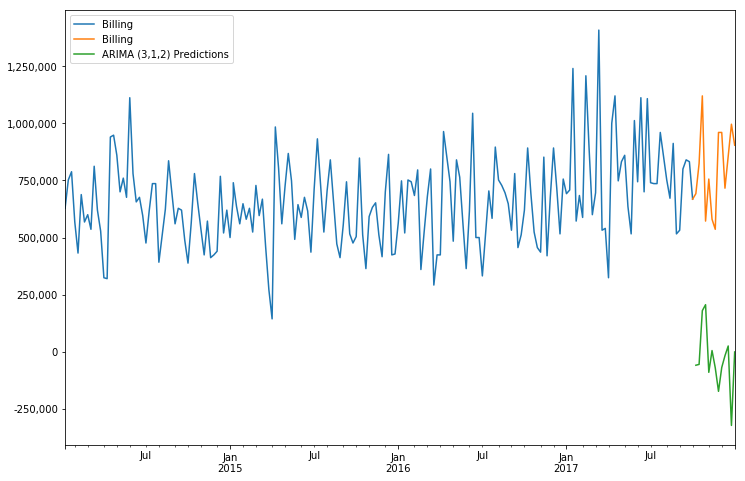

In [518]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train20['Billing'].plot(figsize=(12,8),legend=True)
test20['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [519]:
error = rmse(test20['Billing'],predictions)
error

849304.2139664687

In [494]:
len(predictions)

19

In [166]:
auto_arima(df20['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(2, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  202
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood               -2048.437
Date:                            Fri, 27 May 2022   AIC                           4114.875
Time:                                    13:21:09   BIC                           4141.910
Sample:                                         0   HQIC                          4125.859
                                            - 202                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   3521.8482   3.08e+04      0.114      0.909   -5.69e+04     6.4e+04
ar.L1         -0.5259      0.123     -4.265      0.000      -0.768      -0.284
ar.L2         -0.5941      0.145     -4.091      0.000      -0.879      -0.309
ar.L3         -0.4408      0.149     -2.960      0.003      -0.733      -0.149
ar.L4         -0.1094      0.129     -0.850      0.396      -0.362       0.143
ar.L5         -0.1461      0.111     -1.316      0.188      -0.364       0.071
ar.S.L52      -0.7012      0.123     -5.690      0.000      -0.943      -0.460
ar.S.L104     -0.3530      0.117     -3.022      0.003      -0.582      -0.124
sigma2      6.805e+10      0.012   5.51e+12      0.000     6.8e+10     6.8e+10
===================================================================================
Ljung-Box (Q):                       53.21   Jarque-Bera (JB):                 0.69
Prob(Q):                              0.08   Prob(JB):                         0.71
Heteroskedasticity (H):               0.66   Skew:                            -0.15
Prob(H) (two-sided):                  0.15   Kurtosis:                         3.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.51e+28. Standard errors may be unstable.
"""

In [178]:
model = SARIMAX(train20['Billing'],order=(5,1,0),seasonal_order=(2,1,0,52),exog=train20['Fc_and_order'])
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  190
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood               -1811.365
Date:                            Fri, 27 May 2022   AIC                           3640.729
Time:                                    13:36:08   BIC                           3667.009
Sample:                                10-01-2017   HQIC                          3651.409
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.9386      0.106      8.854      0.000       0.731       1.146
ar.L1           -0.8116      0.146     -5.551      0.000      -1.098      -0.525
ar.L2           -0.6155      0.206     -2.992      0.003      -1.019      -0.212
ar.L3           -0.3586      0.229     -1.564      0.118      -0.808       0.091
ar.L4           -0.2938      0.210     -1.396      0.163      -0.706       0.119
ar.L5           -0.1709      0.149     -1.149      0.251      -0.462       0.121
ar.S.L52        -0.6491      0.146     -4.454      0.000      -0.935      -0.363
ar.S.L104       -0.3622      0.168     -2.156      0.031      -0.692      -0.033
sigma2        2.628e+10   3.28e-12   8.02e+21      0.000    2.63e+10    2.63e+10
===================================================================================
Ljung-Box (Q):                       32.31   Jarque-Bera (JB):                 0.20
Prob(Q):                              0.80   Prob(JB):                         0.91
Heteroskedasticity (H):               0.50   Skew:                             0.08
Prob(H) (two-sided):                  0.02   Kurtosis:                         3.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.14e+38. Standard errors may be unstable.
"""

In [179]:
start = '2017-10-02'
end = '2017-12-31'

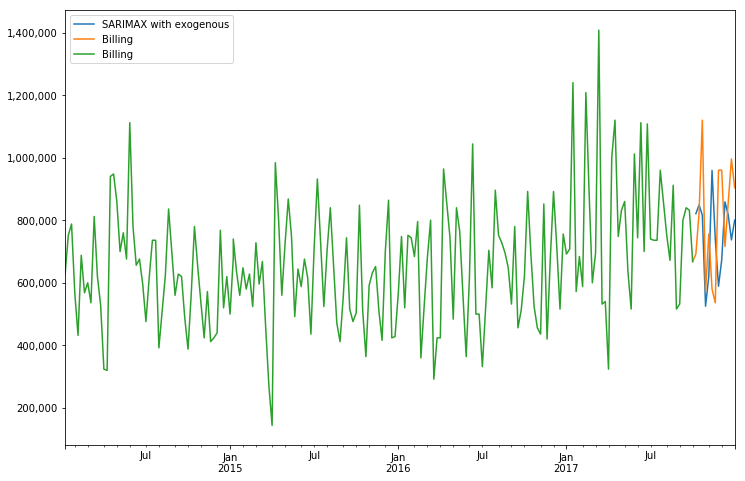

In [180]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test20['Billing'].plot(legend=True)
train20['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [181]:
error = rmse(test20['Billing'],predictions)
error

227677.68167976683

##### ARIMA forecast into the future

In [284]:
model = ARIMA(df20['Billing'],order=(3,1,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(3, 1, 2)   Log Likelihood               -2718.941
Method:                       css-mle   S.D. of innovations         180215.573
Date:                Fri, 27 May 2022   AIC                           5451.882
Time:                        15:34:49   BIC                           5475.005
Sample:                    12-24-2017   HQIC                          5461.239
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -853.1439    885.277     -0.964      0.336   -2588.255     881.967
ar.L1.D.Billing    -0.5647      0.151     -3.733      0.000      -0.861      -0.268
ar.L2.D.Billing    -0.1914      0.087     -2.193      0.029      -0.363      -0.020
ar.L3.D.Billing    -0.2961      0.071     -4.142      0.000      -0.436      -0.156
ma.L1.D.Billing    -0.3210      0.148     -2.173      0.031      -0.611      -0.031
ma.L2.D.Billing    -0.5444      0.142     -3.833      0.000      -0.823      -0.266
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.2601           -0.0000j            1.2601           -0.5000
AR.2            0.3067           -1.6082j            1.6372           -0.2200
AR.3            0.3067           +1.6082j            1.6372            0.2200
MA.1            1.0922           +0.0000j            1.0922            0.0000
MA.2           -1.6818           +0.0000j            1.6818            0.5000
-----------------------------------------------------------------------------
"""

In [285]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (3,1,2) FORECAST')

In [286]:
len(fcast)

13

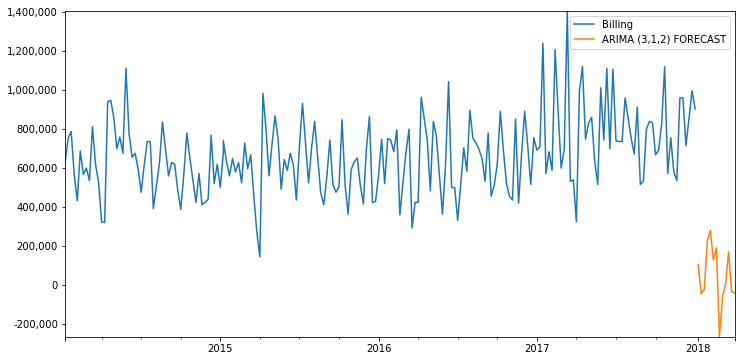

In [287]:
title = ''
ylabel = ''
xlabel = ''
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [288]:
model = SARIMAX(df20['Billing'],order=(5,1,0),seasonal_order=(2,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood               -2048.337
Date:                            Fri, 27 May 2022   AIC                           4112.673
Time:                                    15:36:34   BIC                           4136.705
Sample:                                12-31-2017   HQIC                          4122.437
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5266      0.123     -4.286      0.000      -0.767      -0.286
ar.L2         -0.5950      0.146     -4.081      0.000      -0.881      -0.309
ar.L3         -0.4420      0.149     -2.972      0.003      -0.733      -0.151
ar.L4         -0.1105      0.128     -0.861      0.389      -0.362       0.141
ar.L5         -0.1470      0.111     -1.327      0.184      -0.364       0.070
ar.S.L52      -0.7014      0.124     -5.663      0.000      -0.944      -0.459
ar.S.L104     -0.3530      0.117     -3.028      0.002      -0.582      -0.125
sigma2      6.806e+10   8.45e-13   8.05e+22      0.000    6.81e+10    6.81e+10
===================================================================================
Ljung-Box (Q):                       53.14   Jarque-Bera (JB):                 0.69
Prob(Q):                              0.08   Prob(JB):                         0.71
Heteroskedasticity (H):               0.66   Skew:                            -0.15
Prob(H) (two-sided):                  0.15   Kurtosis:                         3.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.91e+38. Standard errors may be unstable.
"""

In [289]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [290]:
len(fcast)

13

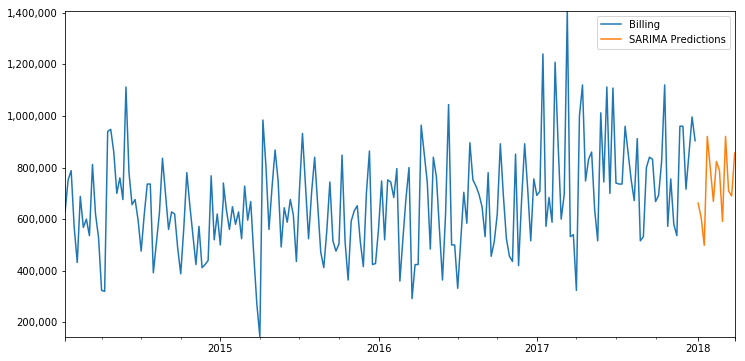

In [291]:
title = ''
ylabel = ''
xlabel = ''
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [161]:
df20.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_20,201405,1,201404,414438,414438.0,432000.0
2014-01-27/2014-02-02,Product_20,201404,1,201403,549350,549350.0,568000.0
2014-01-20/2014-01-26,Product_20,201403,1,201402,759243,759243.0,788000.0
2014-01-13/2014-01-19,Product_20,201402,1,201401,644972,644972.0,752000.0
2014-01-06/2014-01-12,Product_20,201401,1,201352,523579,523579.0,628000.0


In [162]:
model = SARIMAX(df20['Billing'],exog=df20['Forecast'],order=(5,1,0),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(5, 1, 0)x(2, 1, 0, 52)   Log Likelihood                -523.718
Date:                            Sun, 29 May 2022   AIC                           1065.436
Time:                                    19:35:02   BIC                           1080.636
Sample:                                12-31-2017   HQIC                          1070.932
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.9074      0.307      2.961      0.003       0.307       1.508
ar.L1         -0.8748      0.588     -1.487      0.137      -2.028       0.278
ar.L2         -0.7126      0.764     -0.933      0.351      -2.209       0.784
ar.L3         -0.5883      0.758     -0.777      0.437      -2.073       0.896
ar.L4         -0.4357      0.653     -0.667      0.505      -1.715       0.844
ar.L5         -0.3004      0.426     -0.706      0.480      -1.135       0.534
ar.S.L52      -0.4766      0.358     -1.331      0.183      -1.179       0.225
ar.S.L104     -0.3355      0.227     -1.475      0.140      -0.781       0.110
sigma2       2.54e+10   3.51e-11   7.24e+20      0.000    2.54e+10    2.54e+10
===================================================================================
Ljung-Box (Q):                       21.48   Jarque-Bera (JB):                 0.72
Prob(Q):                              0.99   Prob(JB):                         0.70
Heteroskedasticity (H):               1.20   Skew:                             0.23
Prob(H) (two-sided):                  0.75   Kurtosis:                         3.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.85e+36. Standard errors may be unstable.
"""

In [163]:
exog_forecast = df20exo[:'2018-01-01'][['Forecast']]

In [164]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [165]:
len(fcast)

13

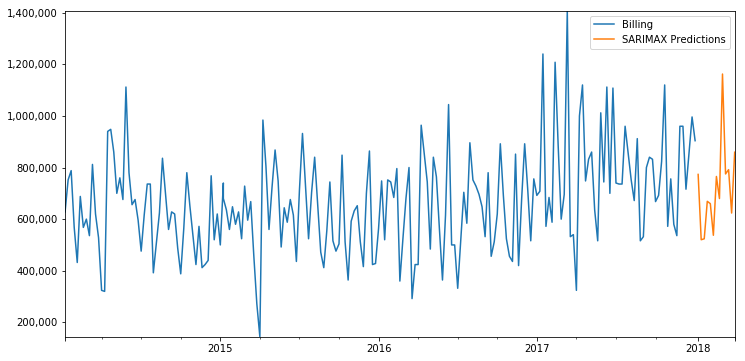

In [166]:
title = ''
ylabel = ''
xlabel = ''
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_22

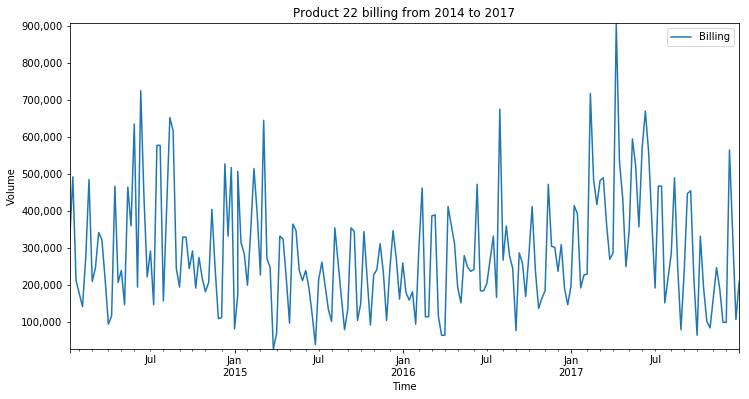

In [82]:
title = 'Product 22 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

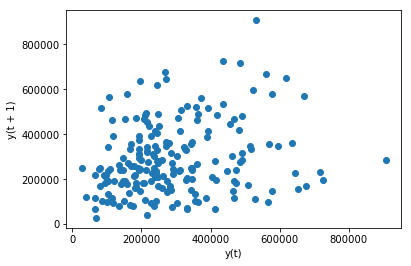

In [773]:
from pandas.plotting import lag_plot
lag_plot(df22['Billing'])

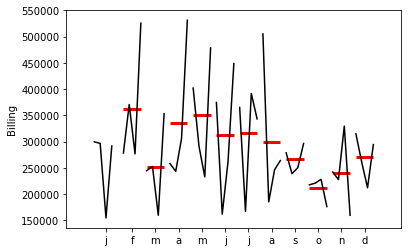

In [809]:
dfm = df22['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

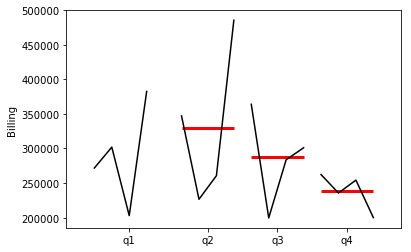

In [850]:
dfq = df22['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

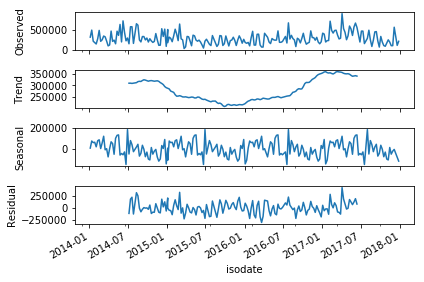

In [943]:
result = seasonal_decompose(df22['Billing'],model='add',freq=52)
result.plot();

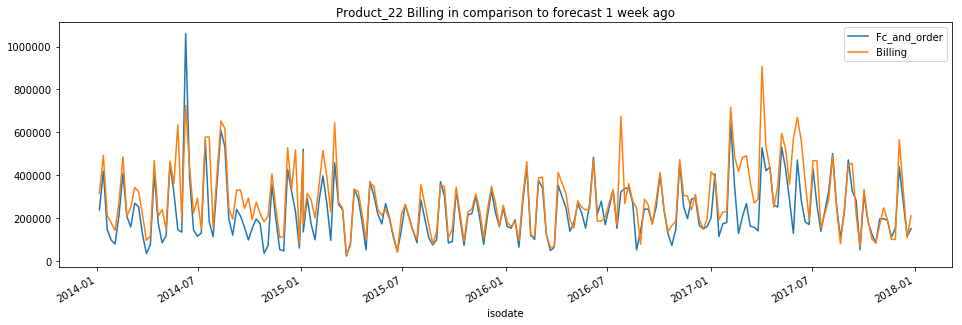

In [888]:
granger22_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_22 Billing in comparison to forecast 1 week ago');

In [917]:
MSE = mse(granger22_1['Fc_and_order'],granger22_1['Billing'])
RMSE = rmse(granger22_1['Fc_and_order'],granger22_1['Billing'])
MAE = meanabs(granger22_1['Fc_and_order'],granger22_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 11326805917.109
Client forecast RMSE: 106427.468
Client forecast  MAE: 67001.436


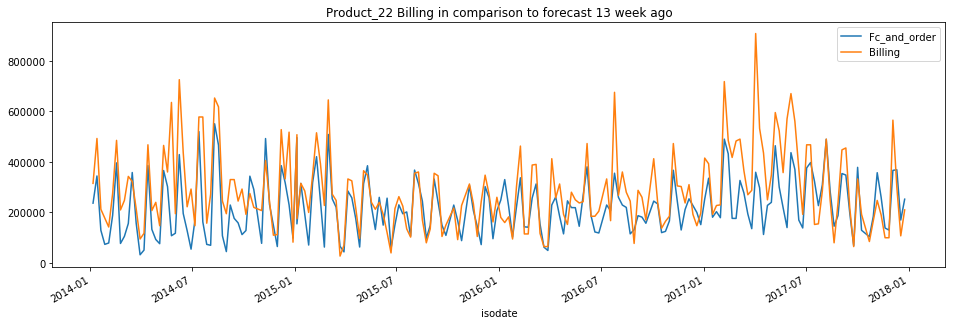

In [898]:
granger22_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_22 Billing in comparison to forecast 13 week ago');

In [918]:
MSE = mse(granger22_13['Fc_and_order'],granger22_13['Billing'])
RMSE = rmse(granger22_13['Fc_and_order'],granger22_13['Billing'])
MAE = meanabs(granger22_13['Fc_and_order'],granger22_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 15923181978.926
Client forecast RMSE: 126187.091
Client forecast  MAE: 91203.015


In [960]:
adf_test(df22['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -2.545490
p-value                   0.104795
# lags used               7.000000
# observations          194.000000
critical value (1%)      -3.464515
critical value (5%)      -2.876556
critical value (10%)     -2.574775
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [172]:
auto_arima(df22['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:                     ARMA(1, 1)   Log Likelihood               -2692.355
Method:                       css-mle   S.D. of innovations         148581.804
Date:                Fri, 27 May 2022   AIC                           5392.711
Time:                        13:32:44   BIC                           5405.944
Sample:                             0   HQIC                          5398.065
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.873e+05   2.71e+04     10.600      0.000    2.34e+05     3.4e+05
ar.L1.y        0.9333      0.040     23.313      0.000       0.855       1.012
ma.L1.y       -0.8194      0.059    -13.982      0.000      -0.934      -0.705
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0714           +0.0000j            1.0714            0.0000
MA.1            1.2205           +0.0000j            1.2205            0.0000
-----------------------------------------------------------------------------
"""

In [173]:
train22 = df22['2017-09-30':]
test22 = df22[:'2017-09-30']

In [174]:
model = ARMA(train22['Billing'],order=(1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  190
Model:                     ARMA(1, 1)   Log Likelihood               -2535.479
Method:                       css-mle   S.D. of innovations         151071.290
Date:                Fri, 27 May 2022   AIC                           5078.958
Time:                        13:33:09   BIC                           5091.947
Sample:                    10-01-2017   HQIC                          5084.220
                         - 01-12-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          2.928e+05   1.38e+04     21.274      0.000    2.66e+05     3.2e+05
ar.L1.Billing    -0.0043      0.225     -0.019      0.985      -0.446       0.438
ma.L1.Billing     0.2624      0.213      1.232      0.220      -0.155       0.680
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1         -231.8318           +0.0000j          231.8318            0.5000
MA.1           -3.8115           +0.0000j            3.8115            0.5000
-----------------------------------------------------------------------------
"""

In [175]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARMA (1,1) Predictions')

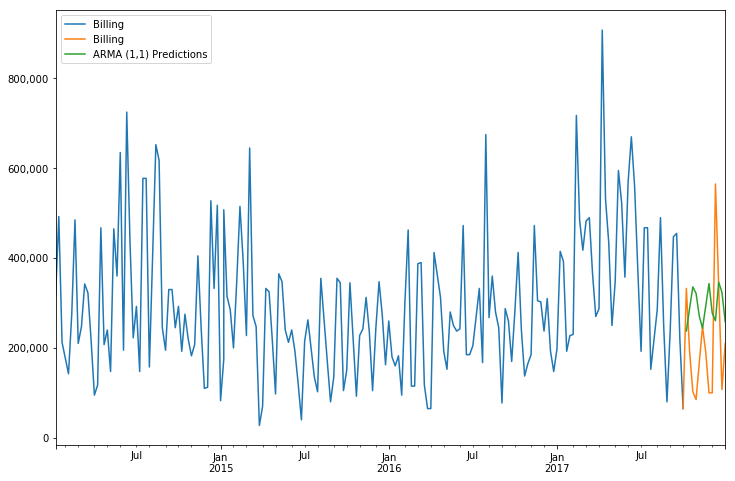

In [176]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train22['Billing'].plot(figsize=(12,8),legend=True)
test22['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [177]:
error = rmse(test22['Billing'],predictions)
error

157690.109038067

In [182]:
auto_arima(df22['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(2, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  202
Model:             SARIMAX(4, 1, 1)x(2, 1, 0, 52)   Log Likelihood               -2001.933
Date:                            Fri, 27 May 2022   AIC                           4021.866
Time:                                    13:41:12   BIC                           4048.901
Sample:                                         0   HQIC                          4032.850
                                            - 202                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2713.1493   5030.510     -0.539      0.590   -1.26e+04    7146.469
ar.L1          0.0156      0.222      0.070      0.944      -0.419       0.451
ar.L2         -0.1225      0.179     -0.683      0.494      -0.474       0.229
ar.L3         -0.1301      0.143     -0.910      0.363      -0.410       0.150
ar.L4          0.1351      0.162      0.836      0.403      -0.182       0.452
ma.L1         -0.8321      0.151     -5.513      0.000      -1.128      -0.536
ar.S.L52      -0.7799      0.171     -4.574      0.000      -1.114      -0.446
ar.S.L104     -0.3583      0.170     -2.103      0.035      -0.692      -0.024
sigma2      3.861e+10      0.000   8.61e+13      0.000    3.86e+10    3.86e+10
===================================================================================
Ljung-Box (Q):                       75.95   Jarque-Bera (JB):                23.64
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.59   Skew:                             0.77
Prob(H) (two-sided):                  0.11   Kurtosis:                         4.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.22e+30. Standard errors may be unstable.
"""

In [183]:
model = SARIMAX(train22['Billing'],order=(4,1,1),seasonal_order=(2,1,0,52),exog=train22['Fc_and_order'])
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  190
Model:             SARIMAX(4, 1, 1)x(2, 1, 0, 52)   Log Likelihood               -1767.089
Date:                            Fri, 27 May 2022   AIC                           3552.179
Time:                                    13:43:33   BIC                           3578.459
Sample:                                10-01-2017   HQIC                          3562.858
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.8682      0.055     15.815      0.000       0.761       0.976
ar.L1           -0.1060      0.250     -0.424      0.672      -0.596       0.384
ar.L2           -0.1017      0.219     -0.464      0.643      -0.532       0.328
ar.L3           -0.0693      0.200     -0.347      0.729      -0.461       0.323
ar.L4            0.1016      0.156      0.652      0.514      -0.204       0.407
ma.L1           -0.8229      0.195     -4.216      0.000      -1.205      -0.440
ar.S.L52        -0.6690      0.196     -3.414      0.001      -1.053      -0.285
ar.S.L104       -0.2489      0.160     -1.556      0.120      -0.562       0.065
sigma2        1.303e+10   2.05e-11   6.35e+20      0.000     1.3e+10     1.3e+10
===================================================================================
Ljung-Box (Q):                       26.06   Jarque-Bera (JB):               153.32
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               1.42   Skew:                             1.04
Prob(H) (two-sided):                  0.23   Kurtosis:                         7.75
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.12e+36. Standard errors may be unstable.
"""

In [184]:
start = '2017-10-02'
end = '2017-12-31'

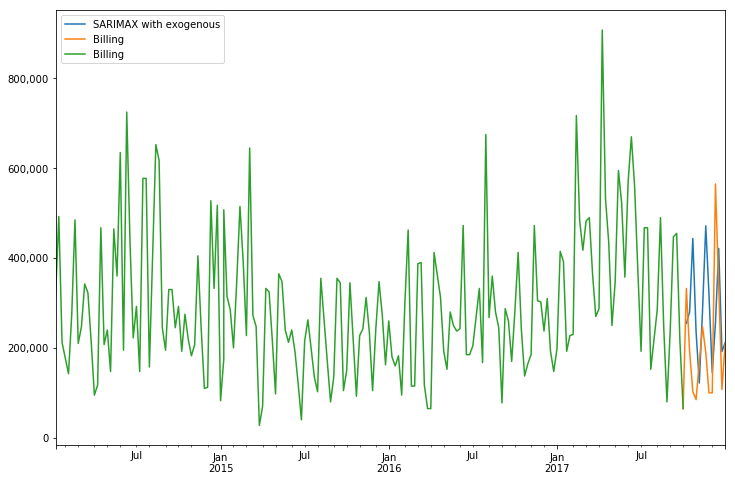

In [185]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test22['Billing'].plot(legend=True)
train22['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [136]:
error = rmse(test22['Billing'],predictions)
error

81460.69584907721

##### ARMA forecast into the future

In [292]:
model = ARMA(df22['Billing'],order=(1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:                     ARMA(1, 1)   Log Likelihood               -2692.355
Method:                       css-mle   S.D. of innovations         148581.804
Date:                Fri, 27 May 2022   AIC                           5392.711
Time:                        15:41:24   BIC                           5405.944
Sample:                    12-31-2017   HQIC                          5398.065
                         - 01-12-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          2.873e+05   2.71e+04     10.600      0.000    2.34e+05     3.4e+05
ar.L1.Billing     0.9333      0.040     23.313      0.000       0.855       1.012
ma.L1.Billing    -0.8194      0.059    -13.982      0.000      -0.934      -0.705
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0714           +0.0000j            1.0714            0.0000
MA.1            1.2205           +0.0000j            1.2205            0.0000
-----------------------------------------------------------------------------
"""

In [293]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARMA (1,1) FORECAST')

In [294]:
len(fcast)

13

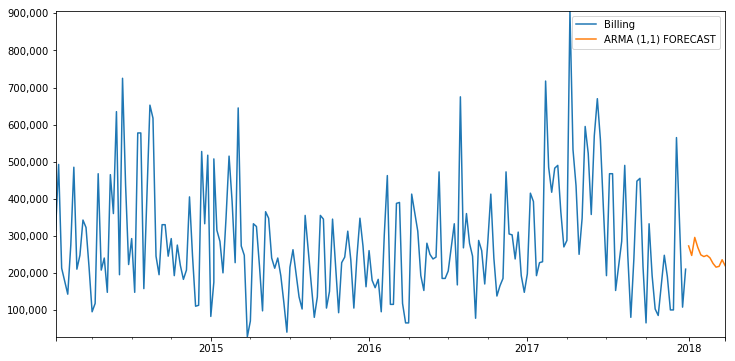

In [295]:
title = ''
ylabel = ''
xlabel = ''
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [296]:
model = SARIMAX(df22['Billing'],order=(4,1,1),seasonal_order=(2,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(4, 1, 1)x(2, 1, 0, 52)   Log Likelihood               -2002.359
Date:                            Fri, 27 May 2022   AIC                           4020.718
Time:                                    15:42:38   BIC                           4044.750
Sample:                                12-31-2017   HQIC                          4030.482
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0050      0.242     -0.021      0.984      -0.479       0.469
ar.L2         -0.1376      0.190     -0.723      0.469      -0.510       0.235
ar.L3         -0.1423      0.153     -0.928      0.353      -0.443       0.158
ar.L4          0.1260      0.167      0.756      0.450      -0.201       0.453
ma.L1         -0.8045      0.184     -4.372      0.000      -1.165      -0.444
ar.S.L52      -0.7751      0.166     -4.677      0.000      -1.100      -0.450
ar.S.L104     -0.3530      0.150     -2.348      0.019      -0.648      -0.058
sigma2      3.863e+10   3.69e-12   1.05e+22      0.000    3.86e+10    3.86e+10
===================================================================================
Ljung-Box (Q):                       78.30   Jarque-Bera (JB):                21.58
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.58   Skew:                             0.73
Prob(H) (two-sided):                  0.11   Kurtosis:                         4.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.89e+38. Standard errors may be unstable.
"""

In [297]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [298]:
len(fcast)

13

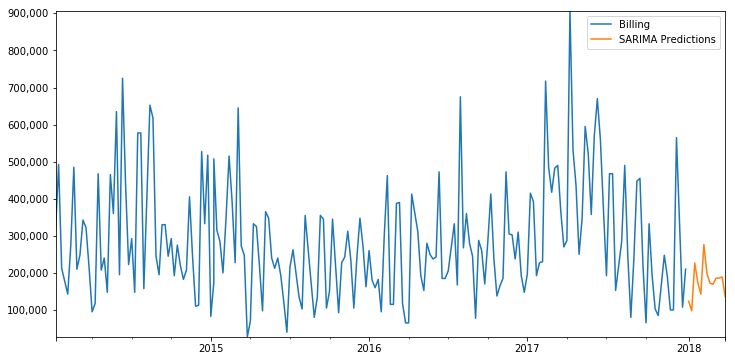

In [299]:
title = ''
ylabel = ''
xlabel = ''
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [167]:
df22.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_22,201405,1,201404,78560,78560.0,142500.0
2014-01-27/2014-02-02,Product_22,201404,1,201403,96510,96510.0,177500.0
2014-01-20/2014-01-26,Product_22,201403,1,201402,145072,145072.0,212500.0
2014-01-13/2014-01-19,Product_22,201402,1,201401,418880,418880.0,492500.0
2014-01-06/2014-01-12,Product_22,201401,1,201352,237802,237802.0,315000.0


In [168]:
model = SARIMAX(df22['Billing'],exog=df20['Forecast'],order=(4,1,1),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(4, 1, 1)x(2, 1, 0, 52)   Log Likelihood                -548.834
Date:                            Sun, 29 May 2022   AIC                           1115.668
Time:                                    19:37:52   BIC                           1131.090
Sample:                                12-31-2017   HQIC                          1121.284
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.6542      0.210      3.117      0.002       0.243       1.066
ar.L1         -0.0676      0.272     -0.249      0.804      -0.601       0.466
ar.L2         -0.3010      0.330     -0.911      0.362      -0.948       0.346
ar.L3         -0.1952      0.302     -0.646      0.518      -0.787       0.397
ar.L4         -0.3330      0.224     -1.484      0.138      -0.773       0.107
ma.L1         -0.6903      0.292     -2.365      0.018      -1.262      -0.118
ar.S.L52      -0.6707      0.239     -2.804      0.005      -1.139      -0.202
ar.S.L104     -0.2682      0.180     -1.490      0.136      -0.621       0.085
sigma2      3.218e+10      3e-12   1.07e+22      0.000    3.22e+10    3.22e+10
===================================================================================
Ljung-Box (Q):                       30.46   Jarque-Bera (JB):                 0.47
Prob(Q):                              0.86   Prob(JB):                         0.79
Heteroskedasticity (H):               0.69   Skew:                            -0.05
Prob(H) (two-sided):                  0.49   Kurtosis:                         2.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

In [169]:
exog_forecast = df22exo[:'2018-01-01'][['Forecast']]

In [170]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [171]:
len(fcast)

13

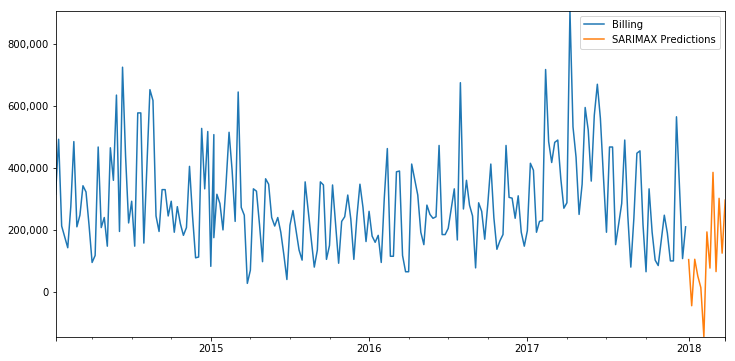

In [172]:
title = ''
ylabel = ''
xlabel = ''
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_30

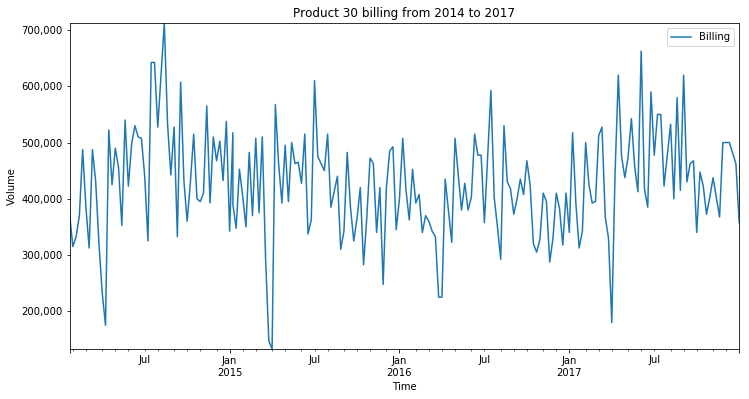

In [83]:
title = 'Product 30 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

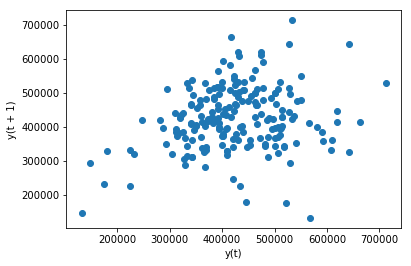

In [774]:
from pandas.plotting import lag_plot
lag_plot(df30['Billing'])

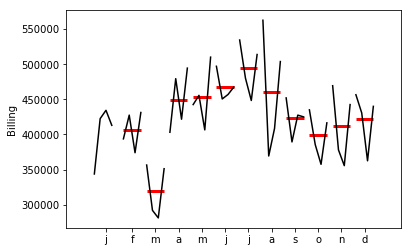

In [810]:
dfm = df30['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

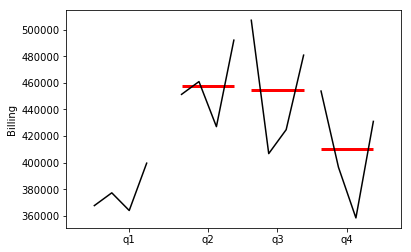

In [851]:
dfq = df30['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

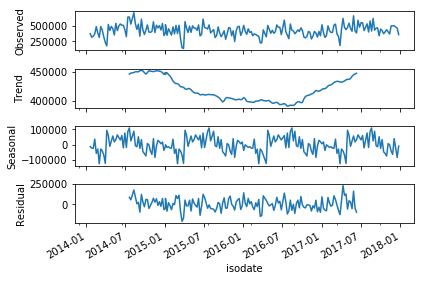

In [944]:
result = seasonal_decompose(df30['Billing'],model='add',freq=52)
result.plot();

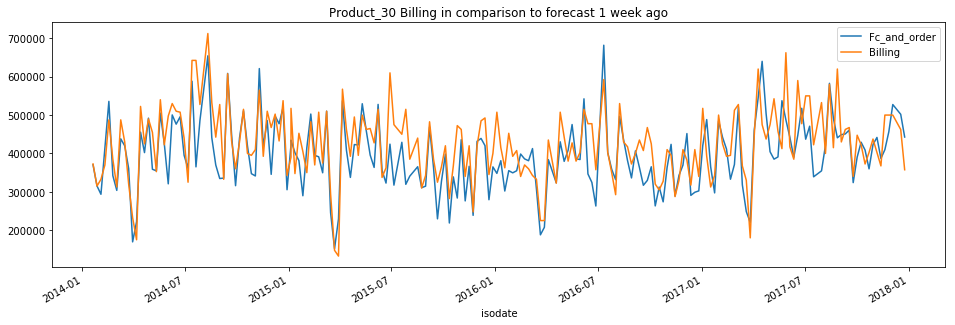

In [889]:
granger30_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_30 Billing in comparison to forecast 1 week ago');

In [919]:
MSE = mse(granger30_1['Fc_and_order'],granger30_1['Billing'])
RMSE = rmse(granger30_1['Fc_and_order'],granger30_1['Billing'])
MAE = meanabs(granger30_1['Fc_and_order'],granger30_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 5145724692.420
Client forecast RMSE: 71733.707
Client forecast  MAE: 53631.770


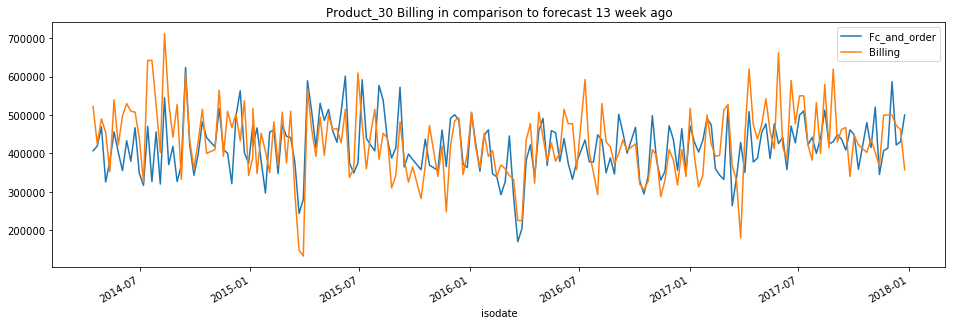

In [899]:
granger30_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_30 Billing in comparison to forecast 13 week ago');

In [920]:
MSE = mse(granger30_13['Fc_and_order'],granger30_13['Billing'])
RMSE = rmse(granger30_13['Fc_and_order'],granger30_13['Billing'])
MAE = meanabs(granger30_13['Fc_and_order'],granger30_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 7160565519.021
Client forecast RMSE: 84620.125
Client forecast  MAE: 65148.619


In [961]:
adf_test(df30['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -4.247365
p-value                   0.000547
# lags used               4.000000
# observations          195.000000
critical value (1%)      -3.464337
critical value (5%)      -2.876479
critical value (10%)     -2.574733
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [186]:
auto_arima(df30['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 0, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 0, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  200
Model:                     ARMA(1, 1)   Log Likelihood               -2564.710
Method:                       css-mle   S.D. of innovations          89696.866
Date:                Fri, 27 May 2022   AIC                           5137.421
Time:                        13:45:09   BIC                           5150.614
Sample:                             0   HQIC                          5142.760
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.248e+05   1.33e+04     32.006      0.000    3.99e+05    4.51e+05
ar.L1.y        0.8831      0.072     12.248      0.000       0.742       1.024
ma.L1.y       -0.7500      0.098     -7.619      0.000      -0.943      -0.557
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.1323           +0.0000j            1.1323            0.0000
MA.1            1.3334           +0.0000j            1.3334            0.0000
-----------------------------------------------------------------------------
"""

In [187]:
train30 = df30['2017-09-30':]
test30 = df30[:'2017-09-30']

In [188]:
model = ARMA(train30['Billing'],order=(1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  188
Model:                     ARMA(1, 1)   Log Likelihood               -2414.722
Method:                       css-mle   S.D. of innovations          91569.535
Date:                Fri, 27 May 2022   AIC                           4837.444
Time:                        13:45:18   BIC                           4850.390
Sample:                    10-01-2017   HQIC                          4842.689
                         - 01-26-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          4.244e+05   1.43e+04     29.747      0.000    3.96e+05    4.52e+05
ar.L1.Billing     0.8886      0.071     12.470      0.000       0.749       1.028
ma.L1.Billing    -0.7559      0.098     -7.731      0.000      -0.948      -0.564
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.1254           +0.0000j            1.1254            0.0000
MA.1            1.3229           +0.0000j            1.3229            0.0000
-----------------------------------------------------------------------------
"""

In [189]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARMA (1,1) Predictions')

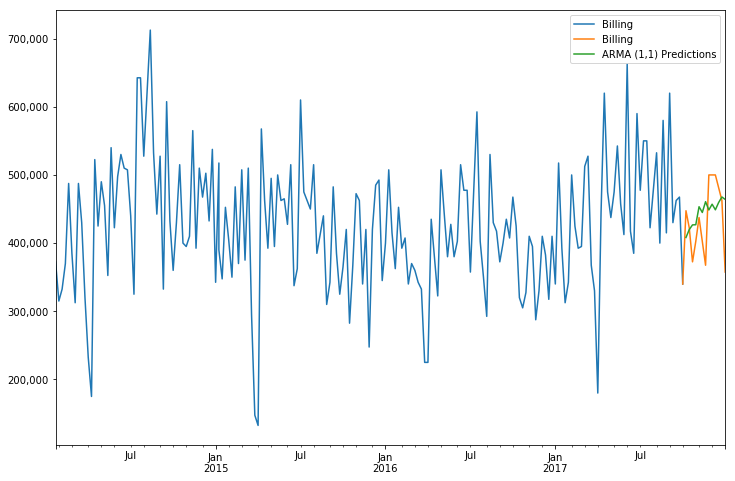

In [190]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train30['Billing'].plot(figsize=(12,8),legend=True)
test30['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [191]:
error = rmse(test30['Billing'],predictions)
error

63721.95493401114

In [192]:
auto_arima(df30['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(2, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  200
Model:             SARIMAX(2, 1, 3)x(2, 1, 0, 52)   Log Likelihood               -1915.428
Date:                            Fri, 27 May 2022   AIC                           3848.856
Time:                                    13:53:36   BIC                           3875.770
Sample:                                         0   HQIC                          3859.791
                                            - 200                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1144.9146   1.41e+04      0.081      0.935   -2.64e+04    2.87e+04
ar.L1         -1.7218      0.132    -13.005      0.000      -1.981      -1.462
ar.L2         -0.7966      0.129     -6.152      0.000      -1.050      -0.543
ma.L1          1.1269      0.126      8.968      0.000       0.881       1.373
ma.L2         -0.4082      0.154     -2.649      0.008      -0.710      -0.106
ma.L3         -0.6683      0.079     -8.431      0.000      -0.824      -0.513
ar.S.L52      -0.6805      0.110     -6.166      0.000      -0.897      -0.464
ar.S.L104     -0.3010      0.119     -2.533      0.011      -0.534      -0.068
sigma2      1.513e+10      0.027   5.59e+11      0.000    1.51e+10    1.51e+10
===================================================================================
Ljung-Box (Q):                       35.61   Jarque-Bera (JB):                 3.98
Prob(Q):                              0.67   Prob(JB):                         0.14
Heteroskedasticity (H):               1.36   Skew:                            -0.35
Prob(H) (two-sided):                  0.29   Kurtosis:                         3.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.83e+27. Standard errors may be unstable.
"""

In [202]:
model = SARIMAX(train30['Billing'],order=(2,1,3),seasonal_order=(2,1,0,52),exog=train30['Fc_and_order'],enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  188
Model:             SARIMAX(2, 1, 3)x(2, 1, 0, 52)   Log Likelihood                -364.164
Date:                            Fri, 27 May 2022   AIC                            746.328
Time:                                    14:06:08   BIC                            758.634
Sample:                                10-01-2017   HQIC                           750.182
                                     - 01-26-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.8712      0.277      3.146      0.002       0.328       1.414
ar.L1           -1.5517      0.176     -8.839      0.000      -1.896      -1.208
ar.L2           -0.9854      0.241     -4.096      0.000      -1.457      -0.514
ma.L1            0.5984      0.136      4.398      0.000       0.332       0.865
ma.L2           -0.5315      0.154     -3.461      0.001      -0.832      -0.231
ma.L3           -0.9836      0.145     -6.770      0.000      -1.268      -0.699
ar.S.L52        -0.4569      0.248     -1.840      0.066      -0.944       0.030
ar.S.L104        0.0133      0.250      0.053      0.957      -0.476       0.503
sigma2        7.332e+09   8.44e-12   8.69e+20      0.000    7.33e+09    7.33e+09
===================================================================================
Ljung-Box (Q):                       31.36   Jarque-Bera (JB):                 4.05
Prob(Q):                              0.30   Prob(JB):                         0.13
Heteroskedasticity (H):               0.27   Skew:                             0.73
Prob(H) (two-sided):                  0.05   Kurtosis:                         4.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.39e+37. Standard errors may be unstable.
"""

In [203]:
start = '2017-10-02'
end = '2017-12-31'

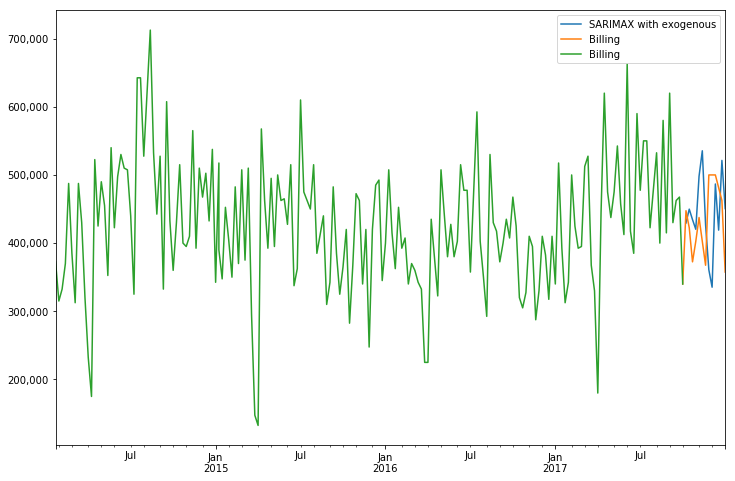

In [204]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test30['Billing'].plot(legend=True)
train30['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [205]:
error = rmse(test30['Billing'],predictions)
error

81299.32696721434

##### ARMA forecast into the future

In [300]:
model = ARMA(df30['Billing'],order=(1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  200
Model:                     ARMA(1, 1)   Log Likelihood               -2564.710
Method:                       css-mle   S.D. of innovations          89696.866
Date:                Fri, 27 May 2022   AIC                           5137.421
Time:                        15:43:46   BIC                           5150.614
Sample:                    12-31-2017   HQIC                          5142.760
                         - 01-26-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          4.248e+05   1.33e+04     32.006      0.000    3.99e+05    4.51e+05
ar.L1.Billing     0.8831      0.072     12.248      0.000       0.742       1.024
ma.L1.Billing    -0.7500      0.098     -7.619      0.000      -0.943      -0.557
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.1323           +0.0000j            1.1323            0.0000
MA.1            1.3334           +0.0000j            1.3334            0.0000
-----------------------------------------------------------------------------
"""

In [301]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARMA (1,1) FORECAST')

In [302]:
len(fcast)

13

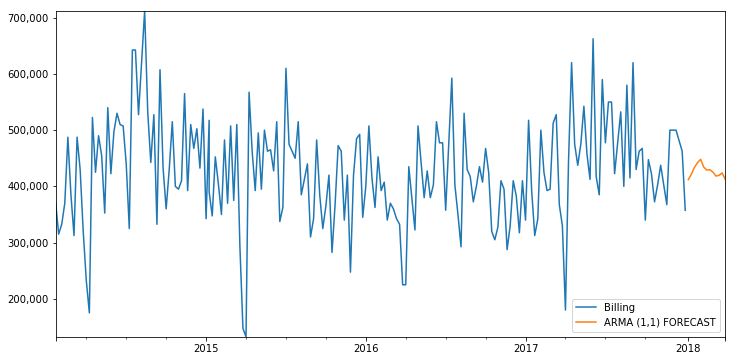

In [303]:
title = ''
ylabel = ''
xlabel = ''
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [304]:
model = SARIMAX(df30['Billing'],order=(2,1,3),seasonal_order=(2,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  200
Model:             SARIMAX(2, 1, 3)x(2, 1, 0, 52)   Log Likelihood               -1917.495
Date:                            Fri, 27 May 2022   AIC                           3850.990
Time:                                    15:45:13   BIC                           3874.913
Sample:                                12-31-2017   HQIC                          3860.710
                                     - 01-26-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1756      5.034      0.035      0.972      -9.690      10.041
ar.L2          0.2936      1.659      0.177      0.860      -2.958       3.546
ma.L1         -0.7979      5.052     -0.158      0.875     -10.700       9.104
ma.L2         -0.2944      2.085     -0.141      0.888      -4.380       3.791
ma.L3          0.2397      1.588      0.151      0.880      -2.873       3.352
ar.S.L52      -0.6740      0.111     -6.052      0.000      -0.892      -0.456
ar.S.L104     -0.3218      0.131     -2.453      0.014      -0.579      -0.065
sigma2      1.512e+10   4.39e-09   3.44e+18      0.000    1.51e+10    1.51e+10
===================================================================================
Ljung-Box (Q):                       38.50   Jarque-Bera (JB):                 4.26
Prob(Q):                              0.54   Prob(JB):                         0.12
Heteroskedasticity (H):               1.31   Skew:                            -0.38
Prob(H) (two-sided):                  0.35   Kurtosis:                         3.32
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.17e+35. Standard errors may be unstable.
"""

In [305]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [306]:
len(fcast)

13

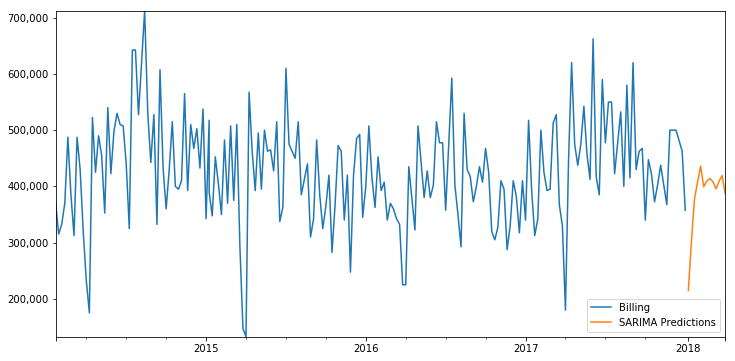

In [307]:
title = ''
ylabel = ''
xlabel = ''
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [175]:
df30.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-17/2014-02-23,Product_30,201407,1,201406,535708,535708.0,487500.0
2014-02-10/2014-02-16,Product_30,201406,1,201405,413685,413685.0,370000.0
2014-02-03/2014-02-09,Product_30,201405,1,201404,293570,293570.0,332500.0
2014-01-27/2014-02-02,Product_30,201404,1,201403,315400,315400.0,315000.0
2014-01-20/2014-01-26,Product_30,201403,1,201402,370384,370384.0,372500.0


In [176]:
model = SARIMAX(df30['Billing'],exog=df30['Forecast'],order=(2,1,3),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  200
Model:             SARIMAX(2, 1, 3)x(2, 1, 0, 52)   Log Likelihood                -515.454
Date:                            Sun, 29 May 2022   AIC                           1048.908
Time:                                    19:46:59   BIC                           1064.330
Sample:                                12-31-2017   HQIC                          1054.524
                                     - 01-26-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.7658      0.188      4.083      0.000       0.398       1.133
ar.L1         -1.4840      0.147    -10.075      0.000      -1.773      -1.195
ar.L2         -1.0060      0.186     -5.418      0.000      -1.370      -0.642
ma.L1          0.5376      0.080      6.704      0.000       0.380       0.695
ma.L2         -0.4610      0.076     -6.087      0.000      -0.609      -0.313
ma.L3         -0.9758      0.087    -11.278      0.000      -1.145      -0.806
ar.S.L52      -0.6029      0.193     -3.119      0.002      -0.982      -0.224
ar.S.L104     -0.0289      0.262     -0.110      0.912      -0.543       0.485
sigma2      7.692e+09    1.3e-11   5.92e+20      0.000    7.69e+09    7.69e+09
===================================================================================
Ljung-Box (Q):                       26.44   Jarque-Bera (JB):                 0.57
Prob(Q):                              0.95   Prob(JB):                         0.75
Heteroskedasticity (H):               0.82   Skew:                            -0.03
Prob(H) (two-sided):                  0.72   Kurtosis:                         3.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.53e+36. Standard errors may be unstable.
"""

In [177]:
exog_forecast = df30exo[:'2018-01-01'][['Forecast']]

In [178]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [179]:
len(fcast)

13

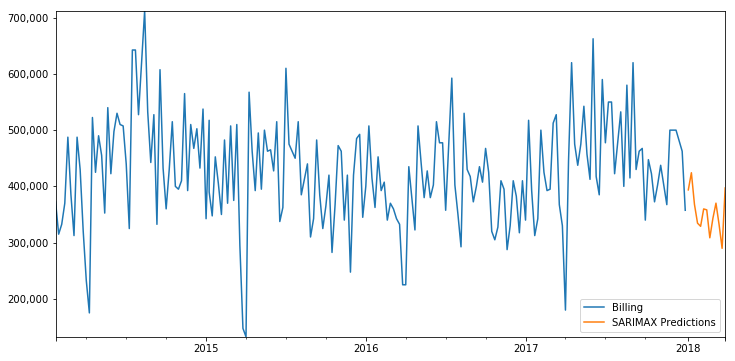

In [180]:
title = ''
ylabel = ''
xlabel = ''
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_39

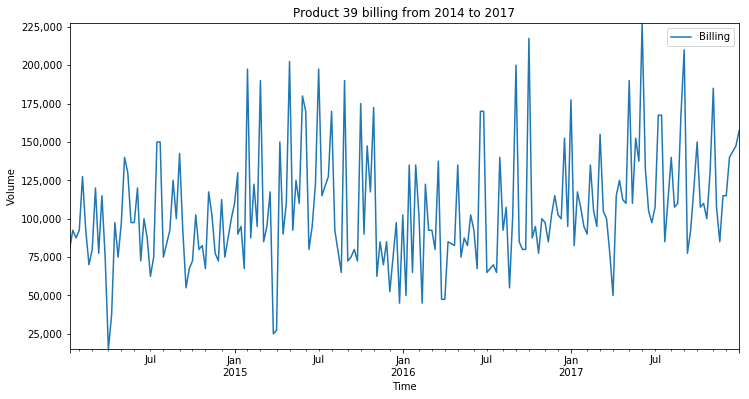

In [84]:
title = 'Product 39 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

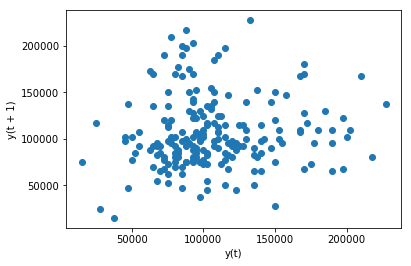

In [775]:
from pandas.plotting import lag_plot
lag_plot(df39['Billing'])

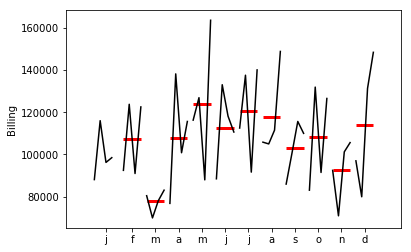

In [811]:
dfm = df39['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

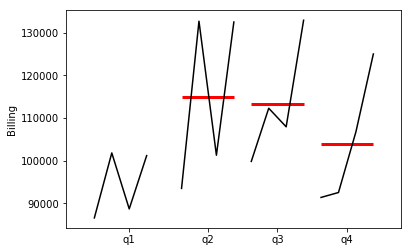

In [852]:
dfq = df39['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

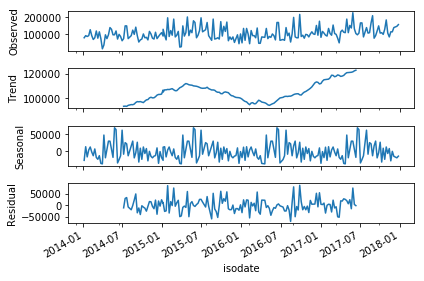

In [945]:
result = seasonal_decompose(df39['Billing'],model='add',freq=52)
result.plot();

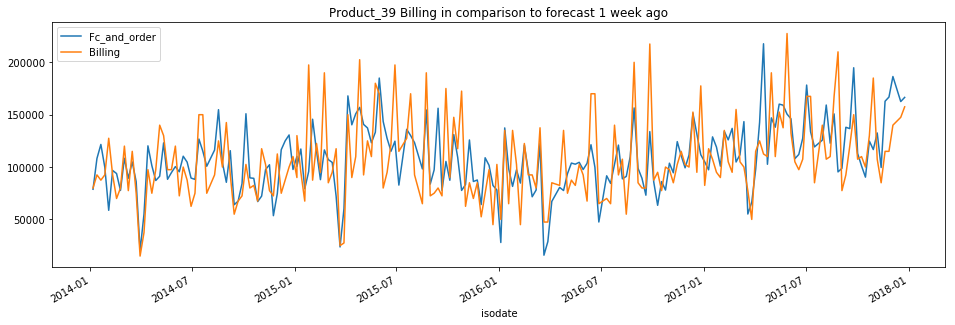

In [890]:
granger39_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_39 Billing in comparison to forecast 1 week ago');

In [921]:
MSE = mse(granger39_1['Fc_and_order'],granger39_1['Billing'])
RMSE = rmse(granger39_1['Fc_and_order'],granger39_1['Billing'])
MAE = meanabs(granger39_1['Fc_and_order'],granger39_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 1106959393.871
Client forecast RMSE: 33270.999
Client forecast  MAE: 25367.663


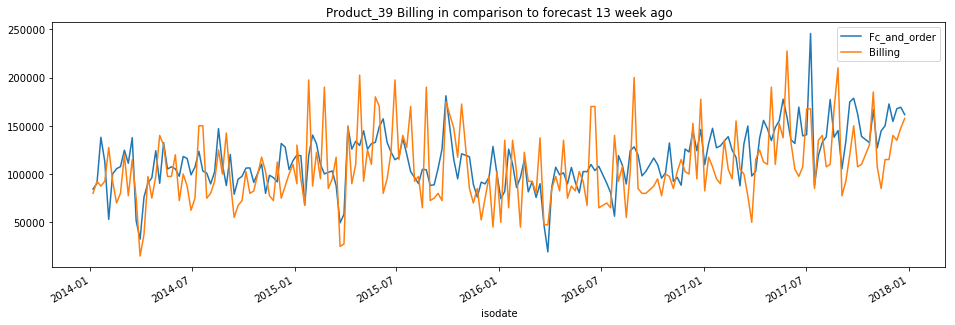

In [900]:
granger39_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_39 Billing in comparison to forecast 13 week ago');

In [922]:
MSE = mse(granger39_13['Fc_and_order'],granger39_13['Billing'])
RMSE = rmse(granger39_13['Fc_and_order'],granger39_13['Billing'])
MAE = meanabs(granger39_13['Fc_and_order'],granger39_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 1231176086.300
Client forecast RMSE: 35088.119
Client forecast  MAE: 28039.512


In [962]:
adf_test(df39['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -5.377204
p-value                   0.000004
# lags used               3.000000
# observations          198.000000
critical value (1%)      -3.463815
critical value (5%)      -2.876251
critical value (10%)     -2.574611
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [193]:
auto_arima(df39['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2403.041
Method:                       css-mle   S.D. of innovations          37441.972
Date:                Fri, 27 May 2022   AIC                           4812.083
Time:                        13:56:03   BIC                           4821.992
Sample:                             1   HQIC                          4816.093
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -197.7307    139.931     -1.413      0.159    -471.990      76.529
ma.L1.D.y     -0.9530      0.032    -30.127      0.000      -1.015      -0.891
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0493           +0.0000j            1.0493            0.0000
-----------------------------------------------------------------------------
"""

In [194]:
train39 = df39['2017-09-30':]
test39 = df39[:'2017-09-30']

In [195]:
model = ARIMA(train39['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2262.377
Method:                       css-mle   S.D. of innovations          37997.683
Date:                Fri, 27 May 2022   AIC                           4530.753
Time:                        13:56:08   BIC                           4540.478
Sample:                    09-24-2017   HQIC                          4534.693
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -208.1493    163.362     -1.274      0.204    -528.334     112.035
ma.L1.D.Billing    -0.9474      0.032    -29.749      0.000      -1.010      -0.885
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0555           +0.0000j            1.0555            0.0000
-----------------------------------------------------------------------------
"""

In [196]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (0,1,1) Predictions')

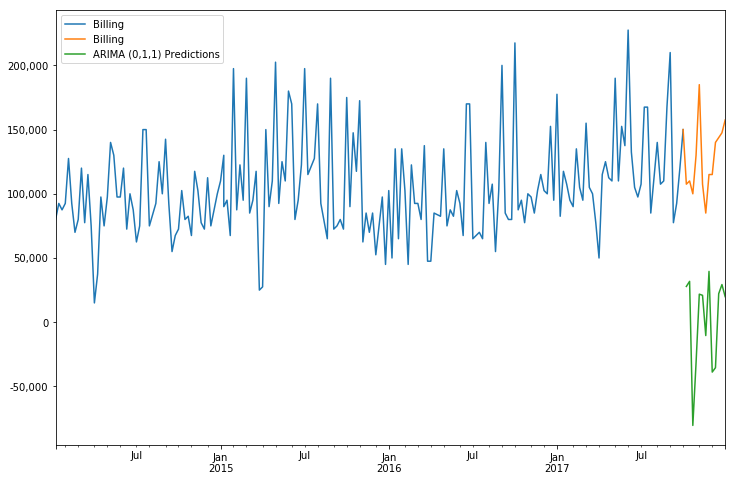

In [198]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train39['Billing'].plot(figsize=(12,8),legend=True)
test39['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [199]:
error = rmse(test39['Billing'],predictions)
error

131775.05406138883

In [200]:
auto_arima(df39['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 0, 2) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 0, 1) seasonal_order=(0, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 0, 0) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  202
Model:             SARIMAX(2, 0, 2)x(1, 1, 0, 52)   Log Likelihood               -1830.236
Date:                            Fri, 27 May 2022   AIC                           3674.471
Time:                                    14:03:58   BIC                           3695.546
Sample:                                         0   HQIC                          3683.033
                                            - 202                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -8515.9157   2.13e+04     -0.400      0.689   -5.02e+04    3.32e+04
ar.L1         -1.1133      0.158     -7.056      0.000      -1.423      -0.804
ar.L2         -0.8001      0.144     -5.551      0.000      -1.083      -0.518
ma.L1          1.2261      0.091     13.487      0.000       1.048       1.404
ma.L2          0.9215      0.091     10.178      0.000       0.744       1.099
ar.S.L52      -0.3353      0.087     -3.843      0.000      -0.506      -0.164
sigma2      3.175e+09      0.294   1.08e+10      0.000    3.18e+09    3.18e+09
===================================================================================
Ljung-Box (Q):                       42.28   Jarque-Bera (JB):                 8.62
Prob(Q):                              0.37   Prob(JB):                         0.01
Heteroskedasticity (H):               0.66   Skew:                             0.34
Prob(H) (two-sided):                  0.14   Kurtosis:                         3.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.44e+30. Standard errors may be unstable.
"""

In [206]:
model = SARIMAX(train39['Billing'],order=(2,0,2),seasonal_order=(1,1,0,52),exog=train39['Fc_and_order'])
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  190
Model:             SARIMAX(2, 0, 2)x(1, 1, 0, 52)   Log Likelihood               -1657.836
Date:                            Fri, 27 May 2022   AIC                           3329.671
Time:                                    14:10:48   BIC                           3350.162
Sample:                                10-01-2017   HQIC                          3337.998
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.8442      0.112      7.505      0.000       0.624       1.065
ar.L1            0.1440      0.093      1.544      0.123      -0.039       0.327
ar.L2           -0.9425      0.068    -13.880      0.000      -1.076      -0.809
ma.L1           -0.0721      0.133     -0.541      0.589      -0.333       0.189
ma.L2            0.8629      0.123      7.029      0.000       0.622       1.103
ar.S.L52        -0.5674      0.100     -5.682      0.000      -0.763      -0.372
sigma2        2.128e+09   1.08e-11   1.97e+20      0.000    2.13e+09    2.13e+09
===================================================================================
Ljung-Box (Q):                       44.12   Jarque-Bera (JB):                 2.26
Prob(Q):                              0.30   Prob(JB):                         0.32
Heteroskedasticity (H):               0.99   Skew:                             0.24
Prob(H) (two-sided):                  0.97   Kurtosis:                         3.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.88e+35. Standard errors may be unstable.
"""

In [207]:
start = '2017-10-02'
end = '2017-12-31'

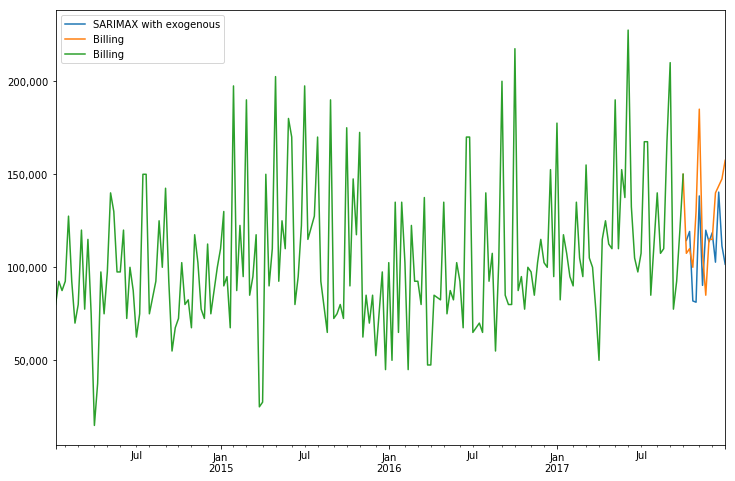

In [208]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test39['Billing'].plot(legend=True)
train39['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [210]:
error = rmse(test39['Billing'],predictions)
error

35515.94105150444

##### ARIMA forecast into the future

In [308]:
model = ARIMA(df39['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2403.041
Method:                       css-mle   S.D. of innovations          37441.972
Date:                Fri, 27 May 2022   AIC                           4812.083
Time:                        15:45:36   BIC                           4821.992
Sample:                    12-24-2017   HQIC                          4816.093
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -197.7307    139.931     -1.413      0.159    -471.990      76.529
ma.L1.D.Billing    -0.9530      0.032    -30.127      0.000      -1.015      -0.891
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0493           +0.0000j            1.0493            0.0000
-----------------------------------------------------------------------------
"""

In [309]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (0,1,1) FORECAST')

In [310]:
len(fcast)

13

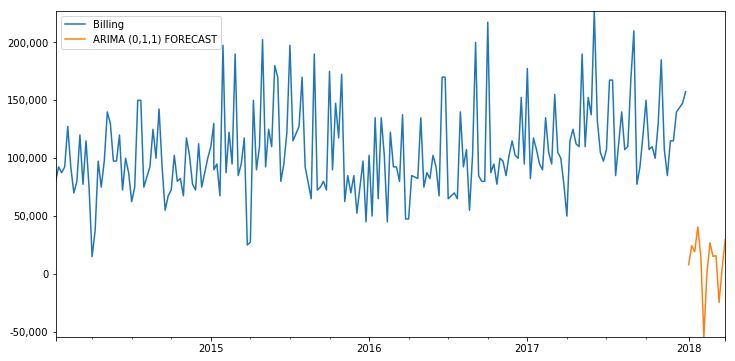

In [311]:
title = ''
ylabel = ''
xlabel = ''
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [315]:
model = SARIMAX(df39['Billing'],order=(2,0,2),seasonal_order=(1,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(2, 0, 2)x(1, 1, 0, 52)   Log Likelihood               -1827.689
Date:                            Fri, 27 May 2022   AIC                           3667.379
Time:                                    15:49:26   BIC                           3685.442
Sample:                                12-31-2017   HQIC                          3674.717
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0485      0.116      0.417      0.677      -0.179       0.276
ar.L2          0.9048      0.107      8.477      0.000       0.696       1.114
ma.L1          0.0220      0.087      0.253      0.801      -0.148       0.192
ma.L2         -0.9242      0.082    -11.296      0.000      -1.085      -0.764
ar.S.L52      -0.4996      0.100     -4.983      0.000      -0.696      -0.303
sigma2      3.234e+09   6.07e-12   5.33e+20      0.000    3.23e+09    3.23e+09
===================================================================================
Ljung-Box (Q):                       50.26   Jarque-Bera (JB):                 6.65
Prob(Q):                              0.13   Prob(JB):                         0.04
Heteroskedasticity (H):               0.82   Skew:                             0.43
Prob(H) (two-sided):                  0.48   Kurtosis:                         3.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.08e+37. Standard errors may be unstable.
"""

In [316]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [317]:
len(fcast)

13

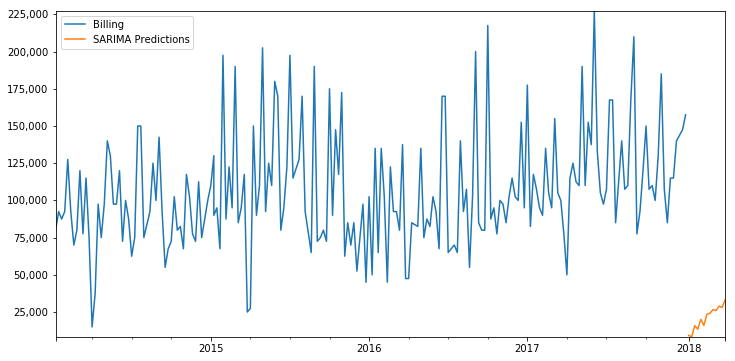

In [318]:
title = ''
ylabel = ''
xlabel = ''
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [181]:
df39.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_39,201405,1,201404,58690,58690.0,127500.0
2014-01-27/2014-02-02,Product_39,201404,1,201403,99880,99880.0,92500.0
2014-01-20/2014-01-26,Product_39,201403,1,201402,121582,121582.0,87500.0
2014-01-13/2014-01-19,Product_39,201402,1,201401,108220,108220.0,92500.0
2014-01-06/2014-01-12,Product_39,201401,1,201352,78796,78796.0,80000.0


In [182]:
model = SARIMAX(df39['Billing'],exog=df39['Forecast'],order=(2,0,2),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(2, 0, 2)x(2, 1, 0, 52)   Log Likelihood                -522.749
Date:                            Sun, 29 May 2022   AIC                           1061.498
Time:                                    19:49:58   BIC                           1075.772
Sample:                                12-31-2017   HQIC                          1066.792
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.5721      0.313      1.829      0.067      -0.041       1.185
ar.L1          0.3473      0.331      1.049      0.294      -0.301       0.996
ar.L2         -0.9038      0.399     -2.268      0.023      -1.685      -0.123
ma.L1         -0.2362      0.578     -0.409      0.683      -1.369       0.896
ma.L2          0.8221      0.478      1.720      0.085      -0.115       1.759
ar.S.L52      -0.7225      0.297     -2.434      0.015      -1.304      -0.141
ar.S.L104     -0.2289      0.309     -0.740      0.459      -0.835       0.377
sigma2      2.248e+09   1.53e-10   1.46e+19      0.000    2.25e+09    2.25e+09
===================================================================================
Ljung-Box (Q):                       33.23   Jarque-Bera (JB):                 0.61
Prob(Q):                              0.77   Prob(JB):                         0.74
Heteroskedasticity (H):               0.80   Skew:                            -0.12
Prob(H) (two-sided):                  0.67   Kurtosis:                         3.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.32e+35. Standard errors may be unstable.
"""

In [183]:
exog_forecast = df39exo[:'2018-01-01'][['Forecast']]

In [188]:
exog_forecast.tail()

,Forecast
isodate,
2018-01-29/2018-02-04,139378.0
2018-01-22/2018-01-28,164494.0
2018-01-15/2018-01-21,154782.0
2018-01-08/2018-01-14,147862.0
2018-01-01/2018-01-07,138310.0


In [184]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [185]:
len(fcast)

13

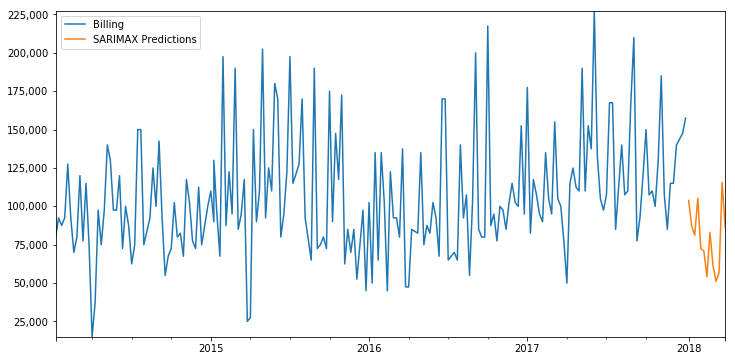

In [186]:
title = ''
ylabel = ''
xlabel = ''
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_48

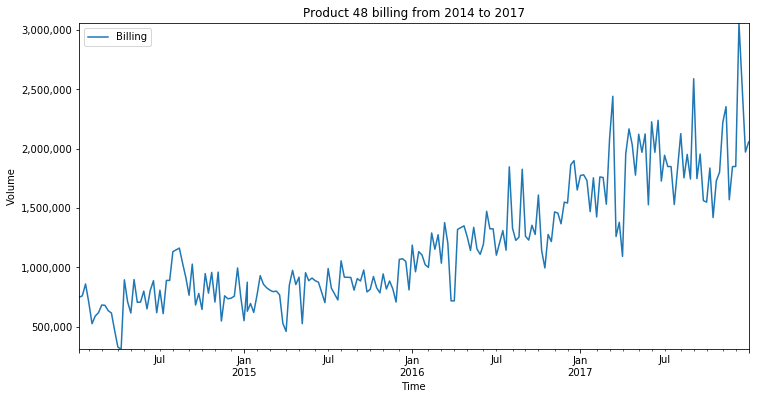

In [85]:
title = 'Product 48 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

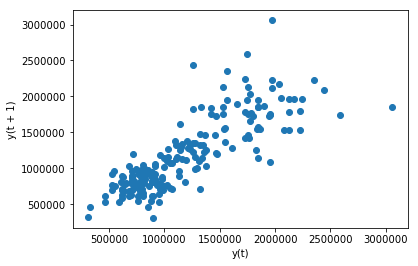

In [776]:
from pandas.plotting import lag_plot
lag_plot(df48['Billing'])

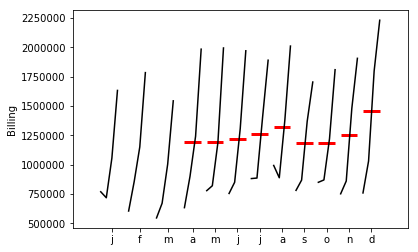

In [834]:
dfm = df48['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

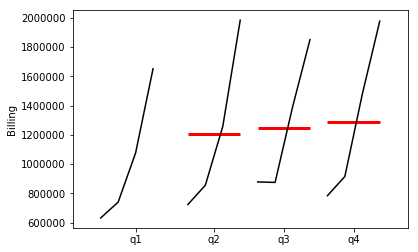

In [853]:
dfq = df48['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

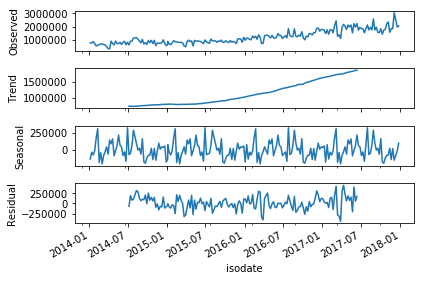

In [946]:
result = seasonal_decompose(df48['Billing'],model='add',freq=52)
result.plot();

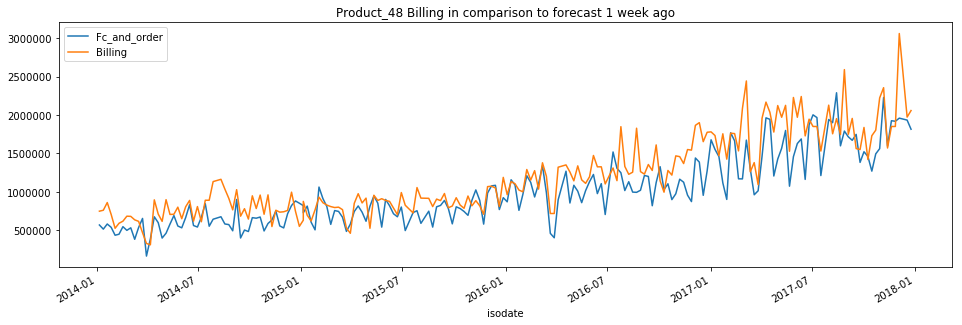

In [891]:
granger48_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_48 Billing in comparison to forecast 1 week ago');

In [923]:
MSE = mse(granger48_1['Fc_and_order'],granger48_1['Billing'])
RMSE = rmse(granger48_1['Fc_and_order'],granger48_1['Billing'])
MAE = meanabs(granger48_1['Fc_and_order'],granger48_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 91390991650.827
Client forecast RMSE: 302309.430
Client forecast  MAE: 229009.520


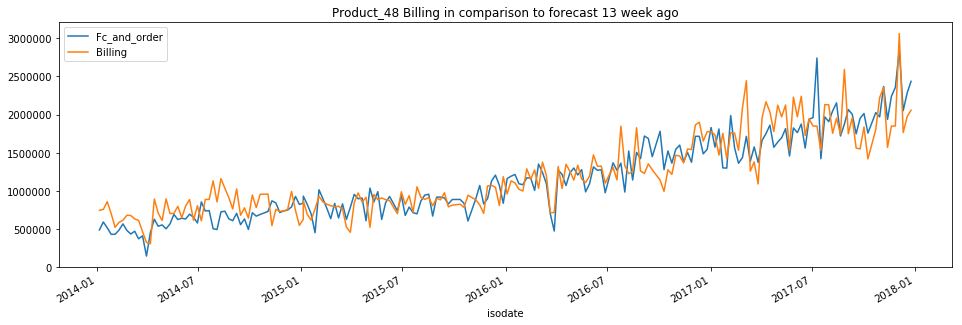

In [901]:
granger48_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_48 Billing in comparison to forecast 13 week ago');

In [924]:
MSE = mse(granger48_13['Fc_and_order'],granger48_13['Billing'])
RMSE = rmse(granger48_13['Fc_and_order'],granger48_13['Billing'])
MAE = meanabs(granger48_13['Fc_and_order'],granger48_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 59450101589.956
Client forecast RMSE: 243823.915
Client forecast  MAE: 192915.404


##### This is very interesting: The 13-week forecast seems to be more precise than the 1-week forecast.

In [963]:
adf_test(df48['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -0.974005
p-value                   0.762627
# lags used              13.000000
# observations          188.000000
critical value (1%)      -3.465620
critical value (5%)      -2.877040
critical value (10%)     -2.575032
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [320]:
auto_arima(df48['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2760.234
Method:                       css-mle   S.D. of innovations         221400.377
Date:                Sun, 29 May 2022   AIC                           5532.468
Time:                        14:50:19   BIC                           5552.288
Sample:                             1   HQIC                          5540.488
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -7008.5370   1885.745     -3.717      0.000   -1.07e+04   -3312.544
ar.L1.D.y     -0.8063      0.081     -9.996      0.000      -0.964      -0.648
ar.L2.D.y      0.1871      0.080      2.353      0.020       0.031       0.343
ma.L1.D.y      0.0501      0.040      1.245      0.215      -0.029       0.129
ma.L2.D.y     -0.8639      0.036    -23.948      0.000      -0.935      -0.793
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.0056           +0.0000j            1.0056            0.5000
AR.2            5.3149           +0.0000j            5.3149            0.0000
MA.1           -1.0472           +0.0000j            1.0472            0.5000
MA.2            1.1053           +0.0000j            1.1053            0.0000
-----------------------------------------------------------------------------
"""

In [321]:
train48 = df48['2017-09-30':]
test48 = df48[:'2017-09-30']

In [322]:
model = ARIMA(train48['Billing'],order=(2,1,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2579.307
Method:                       css-mle   S.D. of innovations         203283.018
Date:                Sun, 29 May 2022   AIC                           5170.614
Time:                        14:50:20   BIC                           5190.064
Sample:                    09-24-2017   HQIC                          5178.494
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -6767.3646   2040.402     -3.317      0.001   -1.08e+04   -2768.250
ar.L1.D.Billing    -0.7595      0.088     -8.628      0.000      -0.932      -0.587
ar.L2.D.Billing     0.2311      0.086      2.701      0.008       0.063       0.399
ma.L1.D.Billing     0.0421      0.050      0.838      0.403      -0.056       0.141
ma.L2.D.Billing    -0.8414      0.043    -19.401      0.000      -0.926      -0.756
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.0077           +0.0000j            1.0077            0.5000
AR.2            4.2936           +0.0000j            4.2936            0.0000
MA.1           -1.0655           +0.0000j            1.0655            0.5000
MA.2            1.1155           +0.0000j            1.1155            0.0000
-----------------------------------------------------------------------------
"""

In [323]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (2,1,2) Predictions')

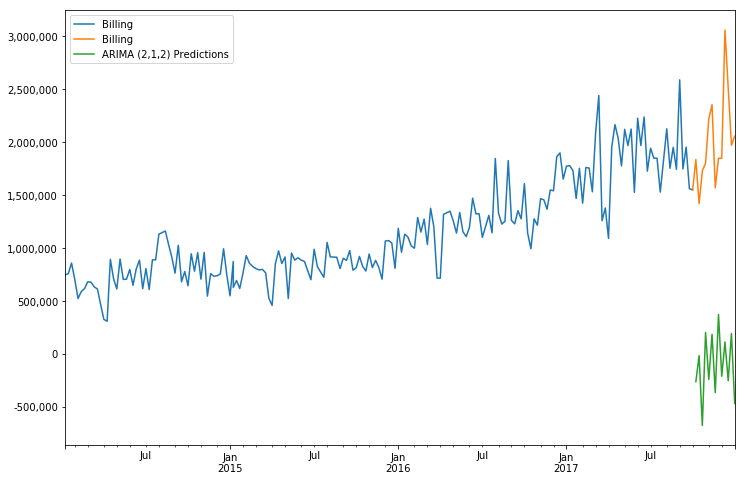

In [324]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train48['Billing'].plot(figsize=(12,8),legend=True)
test48['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [325]:
error = rmse(test48['Billing'],predictions)
error

2135394.5520815877

In [326]:
auto_arima(df48['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(1, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:               SARIMAX(4, 1, 2)   Log Likelihood               -2765.388
Date:                Sun, 29 May 2022   AIC                           5546.776
Time:                        14:50:54   BIC                           5573.202
Sample:                             0   HQIC                          5557.469
                                - 202                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2.129e+04   7103.477     -2.998      0.003   -3.52e+04   -7370.864
ar.L1         -0.8302      0.076    -10.932      0.000      -0.979      -0.681
ar.L2          0.0675      0.086      0.784      0.433      -0.101       0.236
ar.L3         -0.3847      0.069     -5.554      0.000      -0.521      -0.249
ar.L4         -0.2934      0.052     -5.620      0.000      -0.396      -0.191
ma.L1          0.1711      0.063      2.720      0.007       0.048       0.294
ma.L2         -0.7660      0.048    -16.042      0.000      -0.860      -0.672
sigma2      4.633e+10      0.000   1.51e+14      0.000    4.63e+10    4.63e+10
===================================================================================
Ljung-Box (Q):                       47.22   Jarque-Bera (JB):                47.54
Prob(Q):                              0.20   Prob(JB):                         0.00
Heteroskedasticity (H):               0.28   Skew:                             0.35
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.74e+32. Standard errors may be unstable.
"""

In [327]:
model = SARIMAX(train48['Billing'],order=(4,1,2),seasonal_order=(0,0,0,52),exog=train48['Fc_and_order'])
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  190
Model:               SARIMAX(4, 1, 2)   Log Likelihood               -2560.663
Date:                Sun, 29 May 2022   AIC                           5137.325
Time:                        14:50:55   BIC                           5163.259
Sample:                    10-01-2017   HQIC                          5147.832
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.5388      0.058      9.251      0.000       0.425       0.653
ar.L1           -0.7835      0.093     -8.389      0.000      -0.967      -0.600
ar.L2            0.1132      0.132      0.855      0.392      -0.146       0.373
ar.L3           -0.1383      0.121     -1.139      0.255      -0.376       0.100
ar.L4           -0.0512      0.073     -0.701      0.483      -0.194       0.092
ma.L1            0.1325      0.086      1.545      0.122      -0.036       0.301
ma.L2           -0.7624      0.073    -10.383      0.000      -0.906      -0.618
sigma2        3.145e+10   2.87e-12    1.1e+22      0.000    3.15e+10    3.15e+10
===================================================================================
Ljung-Box (Q):                       40.51   Jarque-Bera (JB):                38.23
Prob(Q):                              0.45   Prob(JB):                         0.00
Heteroskedasticity (H):               0.30   Skew:                             0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.63e+38. Standard errors may be unstable.
"""

In [328]:
start = '2017-10-02'
end = '2017-12-31'

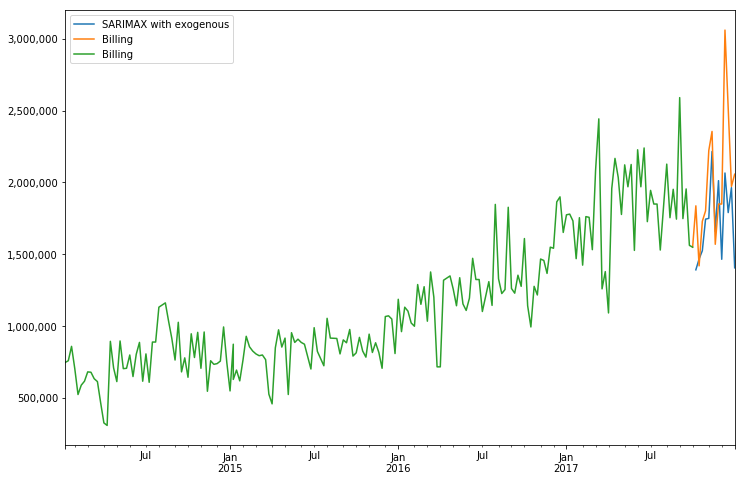

In [329]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test48['Billing'].plot(legend=True)
train48['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [330]:
error = rmse(test48['Billing'],predictions)
error

582959.2962450902

##### ARIMA forecast into the future

In [331]:
model = ARIMA(df48['Billing'],order=(2,1,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2760.234
Method:                       css-mle   S.D. of innovations         221400.405
Date:                Sun, 29 May 2022   AIC                           5532.468
Time:                        14:53:06   BIC                           5552.288
Sample:                    12-24-2017   HQIC                          5540.488
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -7008.5384   1885.985     -3.716      0.000   -1.07e+04   -3312.077
ar.L1.D.Billing    -0.8062      0.081     -9.995      0.000      -0.964      -0.648
ar.L2.D.Billing     0.1872      0.080      2.354      0.020       0.031       0.343
ma.L1.D.Billing     0.0501      0.040      1.245      0.215      -0.029       0.129
ma.L2.D.Billing    -0.8639      0.036    -23.945      0.000      -0.935      -0.793
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.0056           +0.0000j            1.0056            0.5000
AR.2            5.3128           +0.0000j            5.3128            0.0000
MA.1           -1.0473           +0.0000j            1.0473            0.5000
MA.2            1.1053           +0.0000j            1.1053            0.0000
-----------------------------------------------------------------------------
"""

In [332]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (2,1,2) FORECAST')

In [333]:
len(fcast)

13

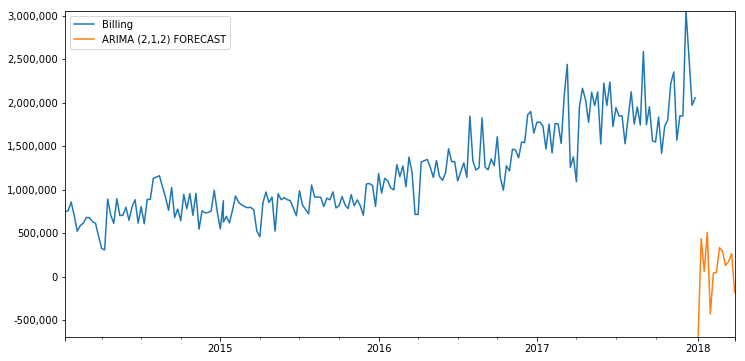

In [335]:
title = ''
ylabel = ''
xlabel = ''
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [336]:
model = SARIMAX(df48['Billing'],order=(4,1,2),seasonal_order=(0,0,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(4, 1, 2)   Log Likelihood               -2766.472
Date:                Sun, 29 May 2022   AIC                           5546.944
Time:                        14:55:05   BIC                           5570.067
Sample:                    12-31-2017   HQIC                          5556.301
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8221      0.080    -10.249      0.000      -0.979      -0.665
ar.L2          0.0850      0.091      0.929      0.353      -0.094       0.264
ar.L3         -0.3577      0.073     -4.884      0.000      -0.501      -0.214
ar.L4         -0.2762      0.055     -5.052      0.000      -0.383      -0.169
ma.L1          0.2039      0.068      2.999      0.003       0.071       0.337
ma.L2         -0.7322      0.051    -14.233      0.000      -0.833      -0.631
sigma2      4.673e+10   4.77e-13    9.8e+22      0.000    4.67e+10    4.67e+10
===================================================================================
Ljung-Box (Q):                       46.08   Jarque-Bera (JB):                69.11
Prob(Q):                              0.24   Prob(JB):                         0.00
Heteroskedasticity (H):               0.26   Skew:                             0.45
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.68e+38. Standard errors may be unstable.
"""

In [337]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [338]:
len(fcast)

13

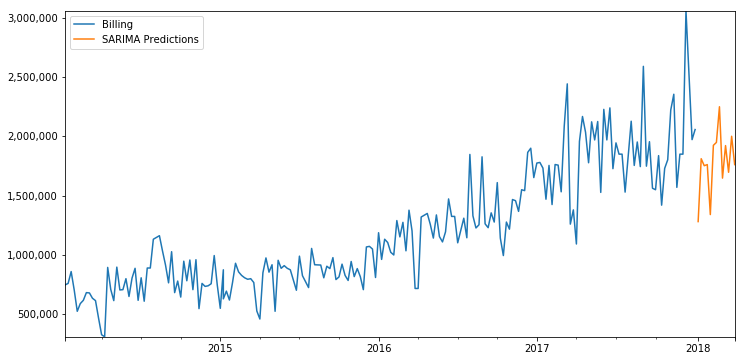

In [339]:
title = ''
ylabel = ''
xlabel = ''
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [189]:
df48.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_48,201405,1,201404,434506,434506.0,525000.0
2014-01-27/2014-02-02,Product_48,201404,1,201403,537354,537354.0,705000.0
2014-01-20/2014-01-26,Product_48,201403,1,201402,580756,580756.0,860000.0
2014-01-13/2014-01-19,Product_48,201402,1,201401,514092,514092.0,760000.0
2014-01-06/2014-01-12,Product_48,201401,1,201352,567903,567903.0,747500.0


In [190]:
model = SARIMAX(df48['Billing'],exog=df48['Forecast'],order=(4,1,2),seasonal_order=(0,0,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(4, 1, 2)   Log Likelihood               -2667.832
Date:                Sun, 29 May 2022   AIC                           5351.665
Time:                        19:52:29   BIC                           5377.930
Sample:                    12-31-2017   HQIC                          5362.297
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.5159      0.063      8.128      0.000       0.391       0.640
ar.L1          0.0387      0.416      0.093      0.926      -0.776       0.854
ar.L2         -0.0396      0.087     -0.457      0.648      -0.209       0.130
ar.L3         -0.1936      0.075     -2.580      0.010      -0.341      -0.046
ar.L4          0.0454      0.111      0.408      0.683      -0.173       0.263
ma.L1         -0.7761      0.419     -1.850      0.064      -1.598       0.046
ma.L2         -0.0213      0.348     -0.061      0.951      -0.703       0.661
sigma2      3.492e+10   1.48e-11   2.35e+21      0.000    3.49e+10    3.49e+10
===================================================================================
Ljung-Box (Q):                       40.90   Jarque-Bera (JB):                24.30
Prob(Q):                              0.43   Prob(JB):                         0.00
Heteroskedasticity (H):               0.33   Skew:                             0.25
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.98e+38. Standard errors may be unstable.
"""

In [191]:
exog_forecast = df48exo[:'2018-01-01'][['Forecast']]

In [192]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [193]:
len(fcast)

13

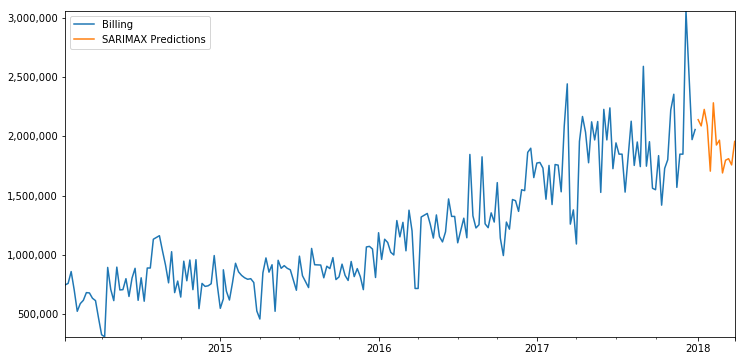

In [194]:
title = ''
ylabel = ''
xlabel = ''
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_50

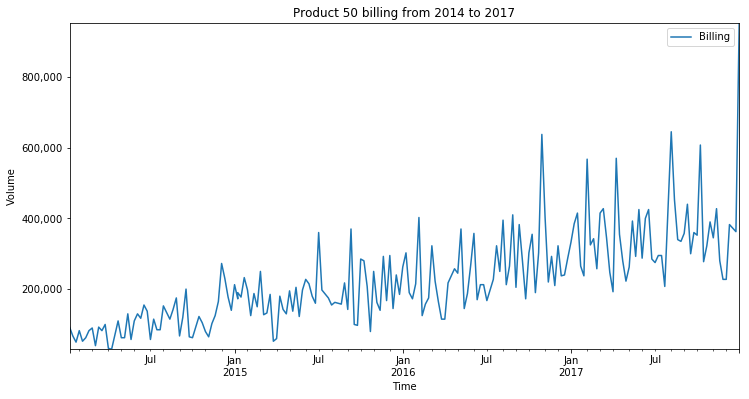

In [86]:
title = 'Product 50 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

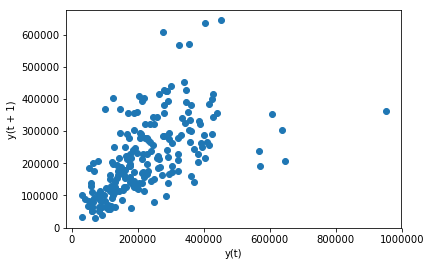

In [777]:
from pandas.plotting import lag_plot
lag_plot(df50['Billing'])

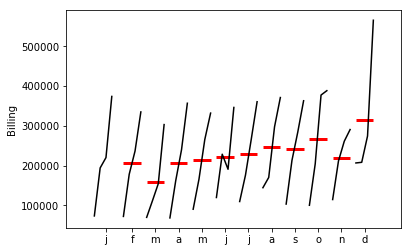

In [855]:
dfm = df50['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

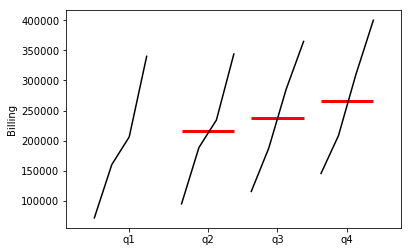

In [856]:
dfq = df50['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

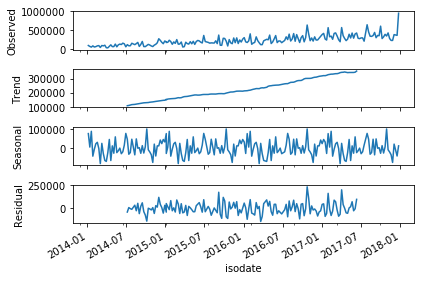

In [947]:
result = seasonal_decompose(df50['Billing'],model='add',freq=52)
result.plot();

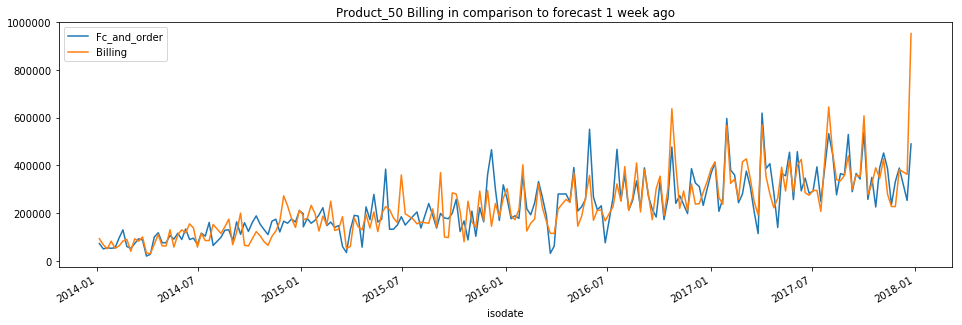

In [892]:
granger50_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_50 Billing in comparison to forecast 1 week ago');

In [925]:
MSE = mse(granger50_1['Fc_and_order'],granger50_1['Billing'])
RMSE = rmse(granger50_1['Fc_and_order'],granger50_1['Billing'])
MAE = meanabs(granger50_1['Fc_and_order'],granger50_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 5465300593.391
Client forecast RMSE: 73927.671
Client forecast  MAE: 51162.589


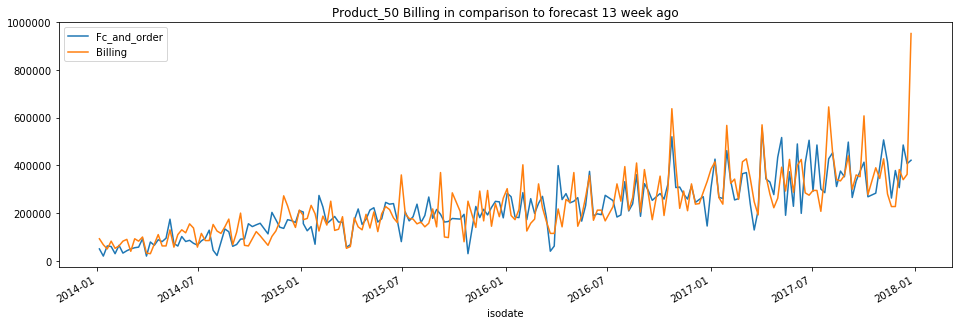

In [902]:
granger50_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_50 Billing in comparison to forecast 13 week ago');

In [926]:
MSE = mse(granger50_13['Fc_and_order'],granger50_13['Billing'])
RMSE = rmse(granger50_13['Fc_and_order'],granger50_13['Billing'])
MAE = meanabs(granger50_13['Fc_and_order'],granger50_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 7453162084.631
Client forecast RMSE: 86331.698
Client forecast  MAE: 60537.970


In [964]:
adf_test(df50['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -0.530163
p-value                   0.885995
# lags used              10.000000
# observations          191.000000
critical value (1%)      -3.465059
critical value (5%)      -2.876794
critical value (10%)     -2.574901
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [224]:
auto_arima(df50['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2575.272
Method:                       css-mle   S.D. of innovations          87570.484
Date:                Fri, 27 May 2022   AIC                           5156.544
Time:                        14:25:57   BIC                           5166.454
Sample:                             1   HQIC                          5160.554
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1665.6221    105.661    -15.764      0.000   -1872.714   -1458.530
ma.L1.D.y     -0.9999      0.014    -69.333      0.000      -1.028      -0.972
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [225]:
train50 = df50['2017-09-30':]
test50 = df50[:'2017-09-30']

In [226]:
model = ARIMA(train50['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2395.143
Method:                       css-mle   S.D. of innovations          76106.820
Date:                Fri, 27 May 2022   AIC                           4796.285
Time:                        14:25:59   BIC                           4806.011
Sample:                    09-24-2017   HQIC                          4800.225
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1631.9869    100.668    -16.212      0.000   -1829.292   -1434.682
ma.L1.D.Billing    -1.0000      0.016    -63.866      0.000      -1.031      -0.969
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0000           +0.0000j            1.0000            0.0000
-----------------------------------------------------------------------------
"""

In [228]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (0,1,1) Predictions')

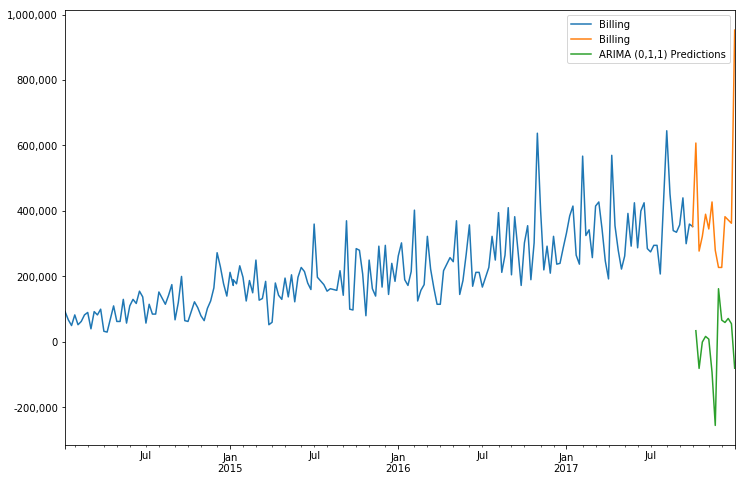

In [229]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train50['Billing'].plot(figsize=(12,8),legend=True)
test50['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [230]:
error = rmse(test50['Billing'],predictions)
error

449370.0225074597

In [223]:
auto_arima(df50['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(2, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2555.231
Date:                Fri, 27 May 2022   AIC                           5124.462
Time:                        14:25:56   BIC                           5147.585
Sample:                             0   HQIC                          5133.819
                                - 202                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -5444.7075   1821.571     -2.989      0.003   -9014.921   -1874.494
ar.L1         -1.0488      0.078    -13.494      0.000      -1.201      -0.896
ar.L2         -0.2276      0.124     -1.841      0.066      -0.470       0.015
ar.L3         -0.1267      0.089     -1.420      0.156      -0.302       0.048
ma.L1          0.0727      0.120      0.605      0.545      -0.163       0.308
ma.L2         -0.9248      0.086    -10.739      0.000      -1.094      -0.756
sigma2      6.852e+09   2.85e-05    2.4e+14      0.000    6.85e+09    6.85e+09
===================================================================================
Ljung-Box (Q):                       55.75   Jarque-Bera (JB):                75.00
Prob(Q):                              0.05   Prob(JB):                         0.00
Heteroskedasticity (H):               0.21   Skew:                             0.91
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.11e+31. Standard errors may be unstable.
"""

In [233]:
model = SARIMAX(train50['Billing'],order=(3,1,2),seasonal_order=(0,0,0,52),exog=train50['Fc_and_order'],enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  190
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2309.263
Date:                Fri, 27 May 2022   AIC                           4632.527
Time:                        14:29:12   BIC                           4655.107
Sample:                    10-01-2017   HQIC                          4641.677
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.6373      0.047     13.426      0.000       0.544       0.730
ar.L1           -0.8566      0.096     -8.897      0.000      -1.045      -0.668
ar.L2           -0.0074      0.137     -0.054      0.957      -0.276       0.261
ar.L3           -0.0188      0.104     -0.181      0.856      -0.222       0.184
ma.L1            0.0113      0.065      0.174      0.861      -0.116       0.139
ma.L2           -0.8737      0.066    -13.226      0.000      -1.003      -0.744
sigma2        3.853e+09   6.68e-12   5.76e+20      0.000    3.85e+09    3.85e+09
===================================================================================
Ljung-Box (Q):                       29.92   Jarque-Bera (JB):                25.23
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.45   Skew:                             0.57
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.24e+36. Standard errors may be unstable.
"""

In [234]:
start = '2017-10-02'
end = '2017-12-31'

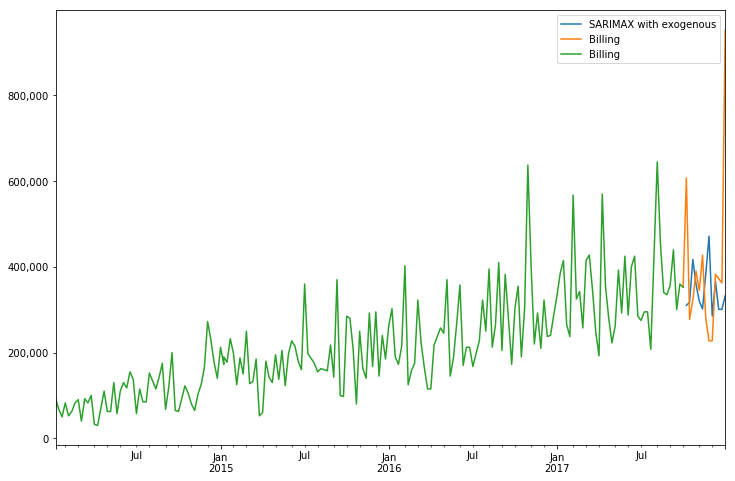

In [235]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test50['Billing'].plot(legend=True)
train50['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [236]:
error = rmse(test50['Billing'],predictions)
error

209061.7884062558

##### ARIMA forecast into the future

In [340]:
model = ARIMA(df50['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2575.272
Method:                       css-mle   S.D. of innovations          87570.484
Date:                Sun, 29 May 2022   AIC                           5156.544
Time:                        14:56:17   BIC                           5166.454
Sample:                    12-24-2017   HQIC                          5160.554
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1665.6221    105.661    -15.764      0.000   -1872.714   -1458.530
ma.L1.D.Billing    -0.9999      0.014    -69.333      0.000      -1.028      -0.972
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [341]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (0,1,1) FORECAST')

In [342]:
len(fcast)

13

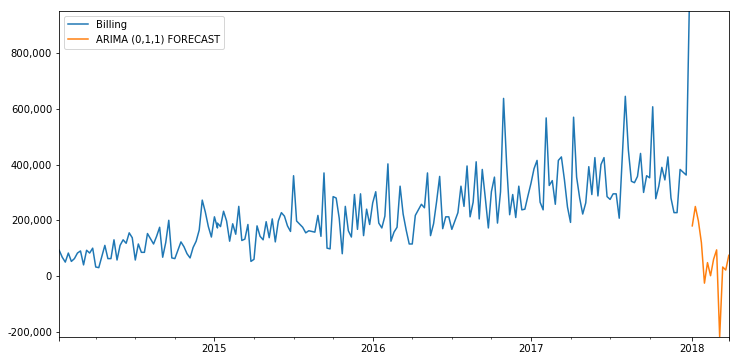

In [343]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [344]:
model = SARIMAX(df50['Billing'],order=(3,1,2),seasonal_order=(0,0,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2558.696
Date:                Sun, 29 May 2022   AIC                           5129.392
Time:                        14:59:04   BIC                           5149.211
Sample:                    12-31-2017   HQIC                          5137.412
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0488      0.488      0.100      0.920      -0.907       1.005
ar.L2         -0.1474      0.081     -1.827      0.068      -0.305       0.011
ar.L3         -0.1053      0.077     -1.364      0.173      -0.257       0.046
ma.L1         -0.9806      0.511     -1.919      0.055      -1.982       0.021
ma.L2          0.1121      0.462      0.243      0.808      -0.793       1.017
sigma2      6.887e+09   6.82e-11   1.01e+20      0.000    6.89e+09    6.89e+09
===================================================================================
Ljung-Box (Q):                       63.20   Jarque-Bera (JB):                88.36
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               0.23   Skew:                             1.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.64e+36. Standard errors may be unstable.
"""

In [345]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [346]:
len(fcast)

13

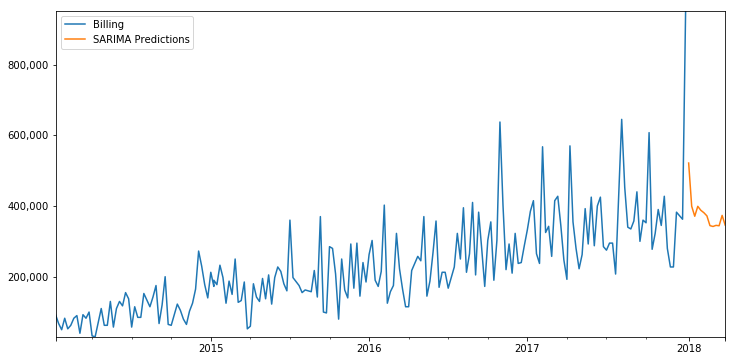

In [347]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMAX forecast into the future

In [196]:
df50.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_50,201405,1,201404,55000,55000.0,52500.0
2014-01-27/2014-02-02,Product_50,201404,1,201403,52500,52500.0,82500.0
2014-01-20/2014-01-26,Product_50,201403,1,201402,55000,55000.0,50000.0
2014-01-13/2014-01-19,Product_50,201402,1,201401,50000,50000.0,67500.0
2014-01-06/2014-01-12,Product_50,201401,1,201352,72500,72500.0,92500.0


In [197]:
model = SARIMAX(df50['Billing'],exog=df50['Forecast'],order=(3,1,2),seasonal_order=(0,0,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2474.751
Date:                Sun, 29 May 2022   AIC                           4963.502
Time:                        19:53:54   BIC                           4986.520
Sample:                    12-31-2017   HQIC                          4972.819
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.6414      0.044     14.597      0.000       0.555       0.728
ar.L1         -0.8460      0.099     -8.553      0.000      -1.040      -0.652
ar.L2         -0.0934      0.150     -0.621      0.535      -0.388       0.201
ar.L3          0.0107      0.089      0.120      0.904      -0.164       0.185
ma.L1          0.1690      0.086      1.973      0.049       0.001       0.337
ma.L2         -0.5708      0.075     -7.639      0.000      -0.717      -0.424
sigma2      3.949e+09   2.64e-11   1.49e+20      0.000    3.95e+09    3.95e+09
===================================================================================
Ljung-Box (Q):                       44.17   Jarque-Bera (JB):                17.60
Prob(Q):                              0.30   Prob(JB):                         0.00
Heteroskedasticity (H):               0.34   Skew:                             0.29
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.93e+35. Standard errors may be unstable.
"""

In [198]:
exog_forecast = df50exo[:'2018-01-01'][['Forecast']]

In [199]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [200]:
len(fcast)

13

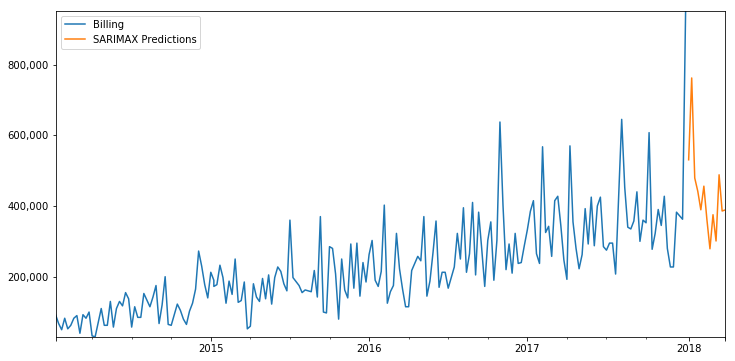

In [201]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_55

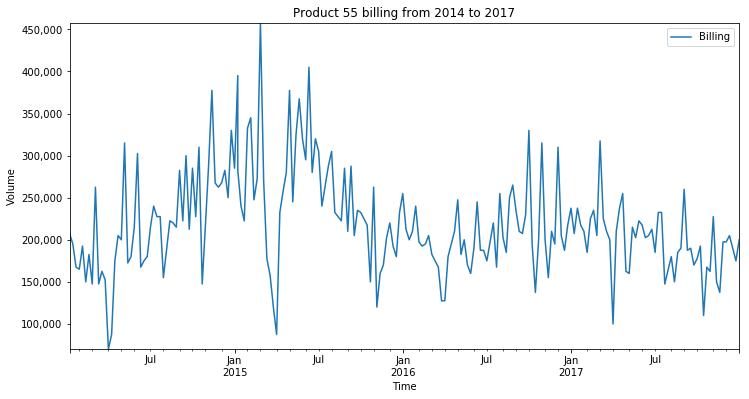

In [87]:
title = 'Product 55 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

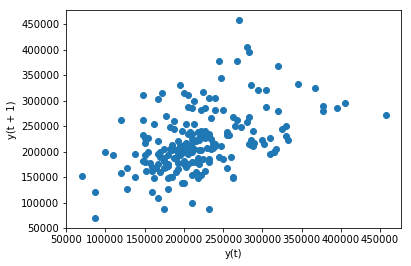

In [778]:
from pandas.plotting import lag_plot
lag_plot(df55['Billing'])

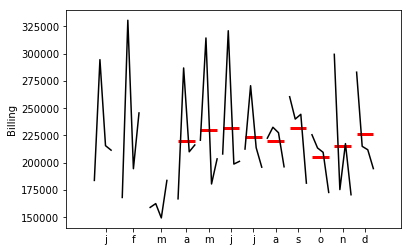

In [832]:
dfm = df55['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

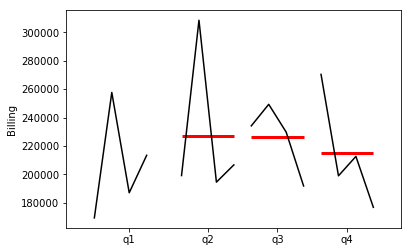

In [857]:
dfq = df55['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

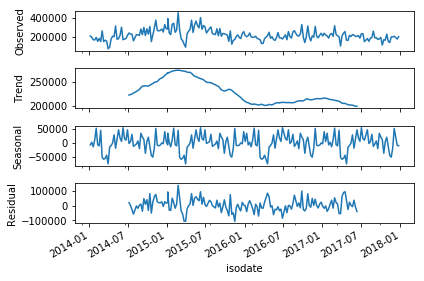

In [948]:
result = seasonal_decompose(df55['Billing'],model='add',freq=52)
result.plot();

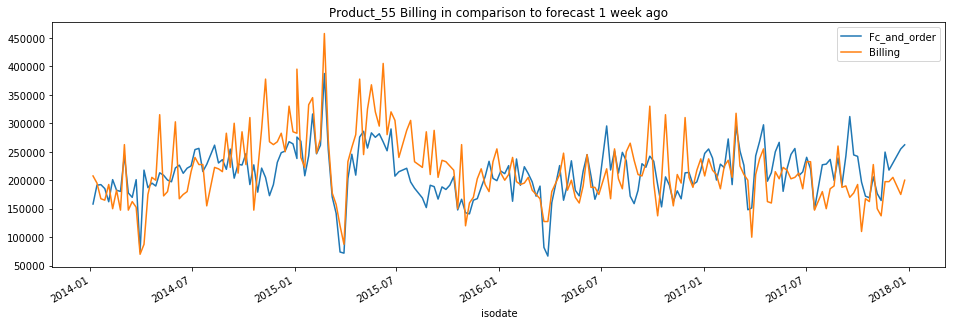

In [893]:
granger55_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_55 Billing in comparison to forecast 1 week ago');

In [927]:
MSE = mse(granger55_1['Fc_and_order'],granger55_1['Billing'])
RMSE = rmse(granger55_1['Fc_and_order'],granger55_1['Billing'])
MAE = meanabs(granger55_1['Fc_and_order'],granger55_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 2581889480.069
Client forecast RMSE: 50812.297
Client forecast  MAE: 39120.663


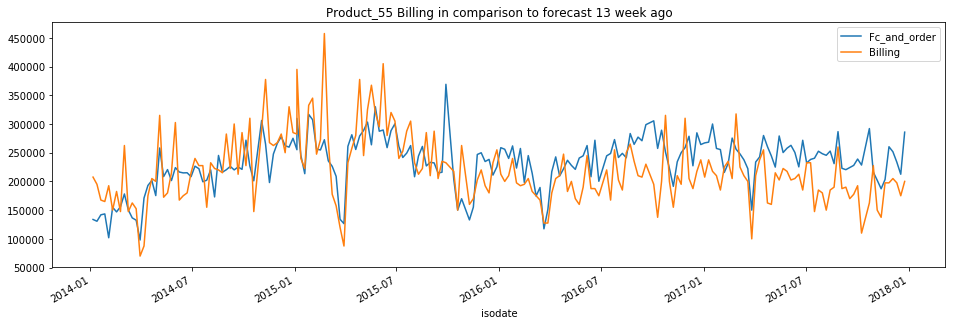

In [903]:
granger55_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_55 Billing in comparison to forecast 13 week ago');

In [928]:
MSE = mse(granger55_13['Fc_and_order'],granger55_13['Billing'])
RMSE = rmse(granger55_13['Fc_and_order'],granger55_13['Billing'])
MAE = meanabs(granger55_13['Fc_and_order'],granger55_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 2719082366.217
Client forecast RMSE: 52144.821
Client forecast  MAE: 41833.468


In [965]:
adf_test(df55['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -2.680533
p-value                   0.077468
# lags used               9.000000
# observations          192.000000
critical value (1%)      -3.464875
critical value (5%)      -2.876714
critical value (10%)     -2.574859
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [237]:
auto_arima(df55['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2465.949
Method:                       css-mle   S.D. of innovations          51372.644
Date:                Fri, 27 May 2022   AIC                           4939.898
Time:                        14:30:03   BIC                           4953.111
Sample:                             1   HQIC                          4945.244
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.5399    626.424     -0.020      0.984   -1240.309    1215.229
ar.L1.D.y      0.2011      0.087      2.323      0.021       0.031       0.371
ma.L1.D.y     -0.8662      0.046    -18.995      0.000      -0.956      -0.777
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            4.9739           +0.0000j            4.9739            0.0000
MA.1            1.1544           +0.0000j            1.1544            0.0000
-----------------------------------------------------------------------------
"""

In [238]:
train55 = df55['2017-09-30':]
test55 = df55[:'2017-09-30']

In [239]:
model = ARIMA(train55['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2321.800
Method:                       css-mle   S.D. of innovations          52206.557
Date:                Fri, 27 May 2022   AIC                           4651.600
Time:                        14:31:03   BIC                           4664.567
Sample:                    09-24-2017   HQIC                          4656.854
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -38.2506    658.739     -0.058      0.954   -1329.355    1252.854
ar.L1.D.Billing     0.2082      0.089      2.333      0.021       0.033       0.383
ma.L1.D.Billing    -0.8673      0.047    -18.436      0.000      -0.960      -0.775
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            4.8036           +0.0000j            4.8036            0.0000
MA.1            1.1529           +0.0000j            1.1529            0.0000
-----------------------------------------------------------------------------
"""

In [240]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (1,1,1) Predictions')

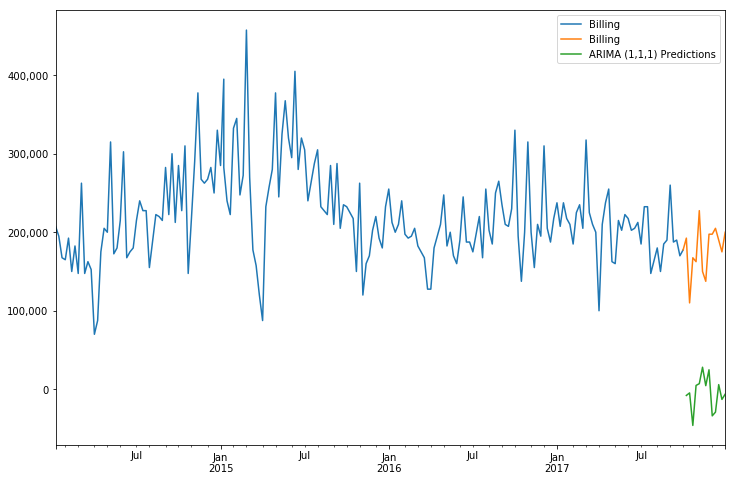

In [241]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train55['Billing'].plot(figsize=(12,8),legend=True)
test55['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [242]:
error = rmse(test55['Billing'],predictions)
error

186089.87802174038

In [243]:
auto_arima(df55['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  202
Model:               SARIMAX(3, 1, 1)   Log Likelihood               -2467.400
Date:                Fri, 27 May 2022   AIC                           4946.800
Time:                        14:33:46   BIC                           4966.620
Sample:                             0   HQIC                          4954.820
                                - 202                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    -40.4405    577.335     -0.070      0.944   -1171.995    1091.114
ar.L1          0.2065      0.078      2.646      0.008       0.054       0.359
ar.L2          0.0212      0.099      0.215      0.830      -0.172       0.215
ar.L3         -0.0225      0.081     -0.277      0.782      -0.181       0.136
ma.L1         -0.8623      0.054    -15.896      0.000      -0.969      -0.756
sigma2      2.864e+09      0.000   6.36e+12      0.000    2.86e+09    2.86e+09
===================================================================================
Ljung-Box (Q):                       38.39   Jarque-Bera (JB):                31.92
Prob(Q):                              0.54   Prob(JB):                         0.00
Heteroskedasticity (H):               2.10   Skew:                             0.41
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.68e+28. Standard errors may be unstable.
"""

In [244]:
model = SARIMAX(train55['Billing'],order=(3,1,1),seasonal_order=(0,0,0,52),exog=train55['Fc_and_order'],enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  190
Model:               SARIMAX(3, 1, 1)   Log Likelihood               -2250.319
Date:                Fri, 27 May 2022   AIC                           4512.637
Time:                        14:35:51   BIC                           4531.992
Sample:                    10-01-2017   HQIC                          4520.481
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.7618      0.062     12.259      0.000       0.640       0.884
ar.L1           -0.2098      0.118     -1.785      0.074      -0.440       0.021
ar.L2           -0.1863      0.101     -1.848      0.065      -0.384       0.011
ar.L3           -0.1978      0.101     -1.962      0.050      -0.395      -0.000
ma.L1           -0.6703      0.111     -6.044      0.000      -0.888      -0.453
sigma2        2.013e+09   3.84e-11   5.25e+19      0.000    2.01e+09    2.01e+09
===================================================================================
Ljung-Box (Q):                       63.27   Jarque-Bera (JB):                 7.00
Prob(Q):                              0.01   Prob(JB):                         0.03
Heteroskedasticity (H):               1.69   Skew:                             0.08
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.52e+35. Standard errors may be unstable.
"""

In [245]:
start = '2017-10-02'
end = '2017-12-31'

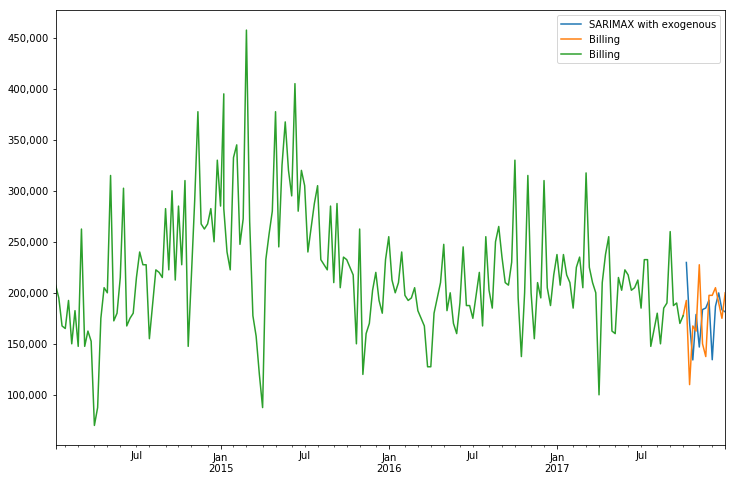

In [246]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test55['Billing'].plot(legend=True)
train55['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [247]:
error = rmse(test55['Billing'],predictions)
error

41827.0089256764

##### ARIMA forecast into the future

In [351]:
model = ARIMA(df55['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2465.949
Method:                       css-mle   S.D. of innovations          51372.644
Date:                Sun, 29 May 2022   AIC                           4939.898
Time:                        15:02:07   BIC                           4953.111
Sample:                    12-24-2017   HQIC                          4945.244
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -12.5399    626.424     -0.020      0.984   -1240.309    1215.229
ar.L1.D.Billing     0.2011      0.087      2.323      0.021       0.031       0.371
ma.L1.D.Billing    -0.8662      0.046    -18.995      0.000      -0.956      -0.777
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            4.9739           +0.0000j            4.9739            0.0000
MA.1            1.1544           +0.0000j            1.1544            0.0000
-----------------------------------------------------------------------------
"""

In [352]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (1,1,1) FORECAST')

In [353]:
len(fcast)

13

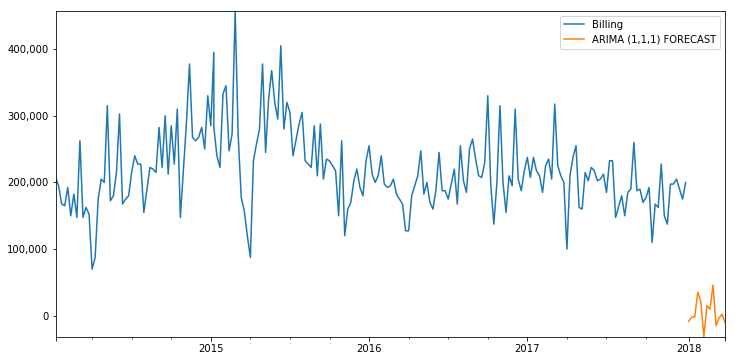

In [354]:
title = ''
ylabel = ''
xlabel = ''
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [398]:
model = SARIMAX(df55['Billing'],order=(3,1,1),seasonal_order=(0,0,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(3, 1, 1)   Log Likelihood               -2467.382
Date:                Sun, 29 May 2022   AIC                           4944.763
Time:                        15:21:45   BIC                           4961.280
Sample:                    12-31-2017   HQIC                          4951.447
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2071      0.077      2.688      0.007       0.056       0.358
ar.L2          0.0217      0.096      0.226      0.821      -0.167       0.210
ar.L3         -0.0220      0.081     -0.272      0.786      -0.181       0.137
ma.L1         -0.8630      0.054    -15.973      0.000      -0.969      -0.757
sigma2      2.864e+09   1.57e-11   1.83e+20      0.000    2.86e+09    2.86e+09
===================================================================================
Ljung-Box (Q):                       38.38   Jarque-Bera (JB):                31.77
Prob(Q):                              0.54   Prob(JB):                         0.00
Heteroskedasticity (H):               2.11   Skew:                             0.41
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.71e+35. Standard errors may be unstable.
"""

In [399]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [400]:
len(fcast)

13

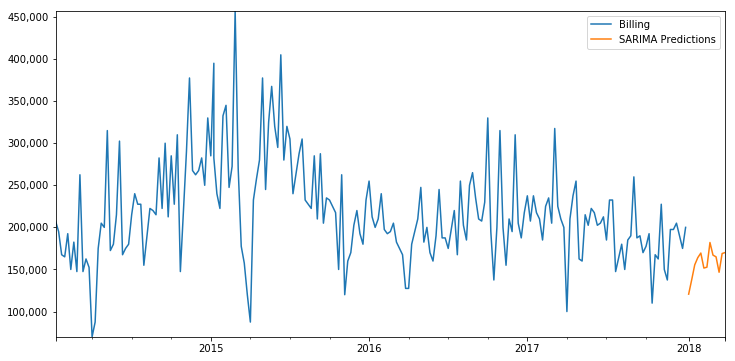

In [401]:
title = ''
ylabel = ''
xlabel = ''
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [402]:
len(df55.loc['2017-12-31':'2017-01-01'])

51

In [403]:
fcast.head()

2018-01-01/2018-01-07    120654.998874
2018-01-08/2018-01-14    137732.155656
2018-01-15/2018-01-21    155510.296765
2018-01-22/2018-01-28    164014.282445
2018-01-29/2018-02-04    169510.237710
Freq: W-SUN, Name: SARIMA Predictions, dtype: float64

##### SARIMAX forecast into the future

In [202]:
df55.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_55,201405,1,201404,162201,162201.0,192500.0
2014-01-27/2014-02-02,Product_55,201404,1,201403,185302,185302.0,165000.0
2014-01-20/2014-01-26,Product_55,201403,1,201402,192278,192278.0,167500.0
2014-01-13/2014-01-19,Product_55,201402,1,201401,191283,191283.0,195000.0
2014-01-06/2014-01-12,Product_55,201401,1,201352,158206,158206.0,207500.0


In [203]:
model = SARIMAX(df55['Billing'],exog=df55['Forecast'],order=(3,1,2),seasonal_order=(0,0,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  202
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -2392.848
Date:                Sun, 29 May 2022   AIC                           4799.697
Time:                        19:55:10   BIC                           4822.714
Sample:                    12-31-2017   HQIC                          4809.013
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.7250      0.058     12.530      0.000       0.612       0.838
ar.L1         -0.7023      0.331     -2.124      0.034      -1.350      -0.054
ar.L2         -0.1827      0.116     -1.582      0.114      -0.409       0.044
ar.L3         -0.1877      0.092     -2.044      0.041      -0.368      -0.008
ma.L1         -0.1757      0.353     -0.498      0.618      -0.867       0.516
ma.L2         -0.4593      0.305     -1.504      0.133      -1.058       0.139
sigma2      1.946e+09    3.3e-10   5.89e+18      0.000    1.95e+09    1.95e+09
===================================================================================
Ljung-Box (Q):                       62.54   Jarque-Bera (JB):                 9.03
Prob(Q):                              0.01   Prob(JB):                         0.01
Heteroskedasticity (H):               1.85   Skew:                             0.07
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.56e+34. Standard errors may be unstable.
"""

In [204]:
exog_forecast = df55exo[:'2018-01-01'][['Forecast']]

In [205]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [206]:
len(fcast)

13

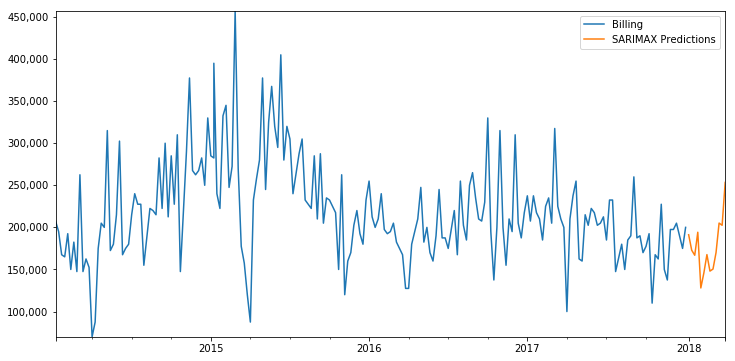

In [207]:
title = ''
ylabel = ''
xlabel = ''
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_57

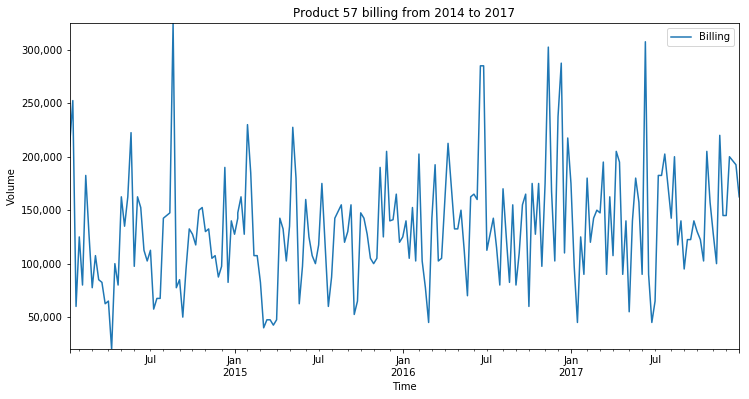

In [88]:
title = 'Product 57 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

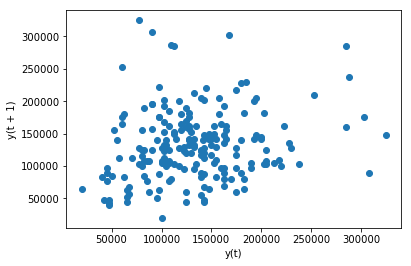

In [779]:
from pandas.plotting import lag_plot
lag_plot(df57['Billing'])

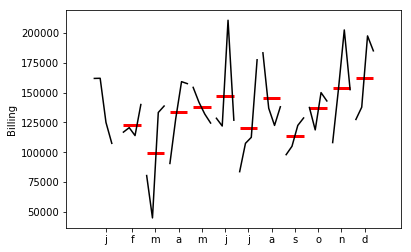

In [815]:
dfm = df57['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

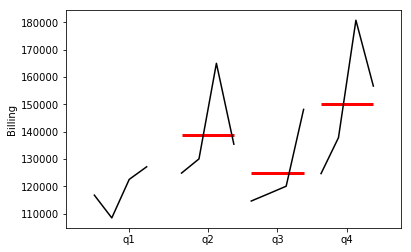

In [858]:
dfq = df57['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

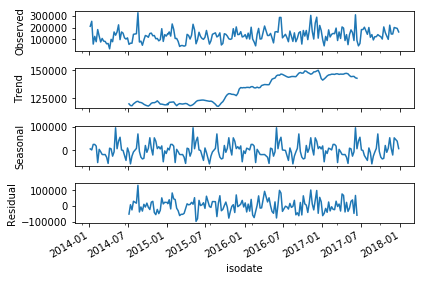

In [949]:
result = seasonal_decompose(df57['Billing'],model='add',freq=52)
result.plot();

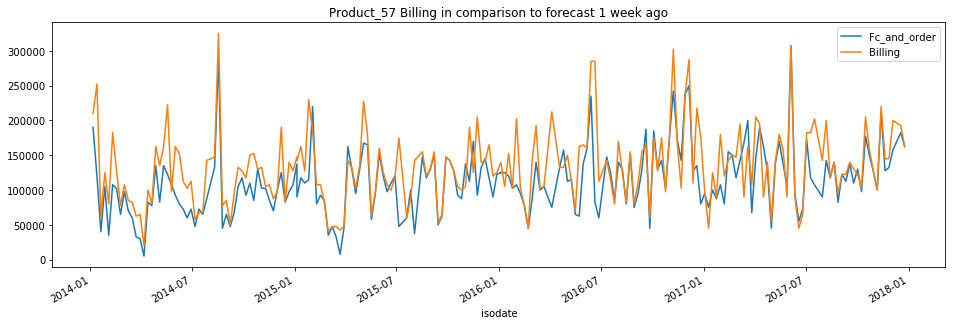

In [894]:
granger57_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_57 Billing in comparison to forecast 1 week ago');

In [929]:
MSE = mse(granger57_1['Fc_and_order'],granger57_1['Billing'])
RMSE = rmse(granger57_1['Fc_and_order'],granger57_1['Billing'])
MAE = meanabs(granger57_1['Fc_and_order'],granger57_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 1682817976.299
Client forecast RMSE: 41022.164
Client forecast  MAE: 26375.095


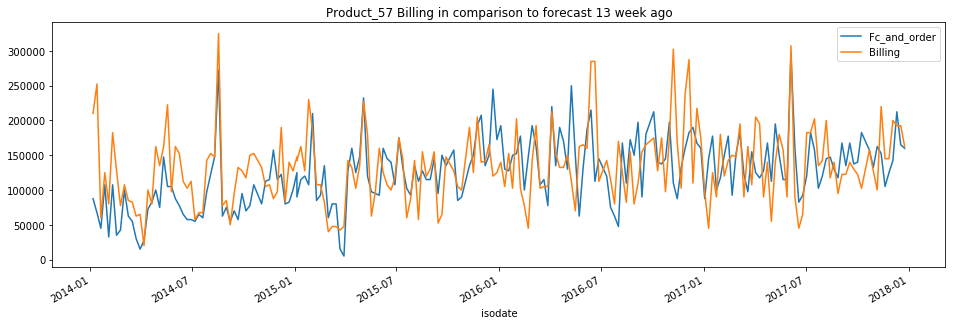

In [904]:
granger57_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_57 Billing in comparison to forecast 13 week ago');

In [930]:
MSE = mse(granger57_13['Fc_and_order'],granger57_13['Billing'])
RMSE = rmse(granger57_13['Fc_and_order'],granger57_13['Billing'])
MAE = meanabs(granger57_13['Fc_and_order'],granger57_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 2763299424.808
Client forecast RMSE: 52567.095
Client forecast  MAE: 40547.320


In [966]:
adf_test(df57['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic     -1.148080e+01
p-value                 5.000212e-21
# lags used             0.000000e+00
# observations          2.000000e+02
critical value (1%)    -3.463476e+00
critical value (5%)    -2.876102e+00
critical value (10%)   -2.574532e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [250]:
auto_arima(df57['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(3, 1, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  200
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2458.078
Method:                       css-mle   S.D. of innovations          52000.296
Date:                Fri, 27 May 2022   AIC                           4924.157
Time:                        14:41:09   BIC                           4937.350
Sample:                             1   HQIC                          4929.496
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -194.3677     75.187     -2.585      0.010    -341.733     -47.003
ar.L1.D.y      0.1615      0.071      2.291      0.023       0.023       0.300
ma.L1.D.y     -1.0000      0.014    -73.898      0.000      -1.027      -0.973
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            6.1901           +0.0000j            6.1901            0.0000
MA.1            1.0000           +0.0000j            1.0000            0.0000
-----------------------------------------------------------------------------
"""

In [251]:
train57 = df57['2017-09-30':]
test57 = df57[:'2017-09-30']

In [252]:
model = ARIMA(train57['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  188
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2313.158
Method:                       css-mle   S.D. of innovations          52683.489
Date:                Fri, 27 May 2022   AIC                           4634.316
Time:                        14:41:16   BIC                           4647.261
Sample:                    09-24-2017   HQIC                          4639.561
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -181.0410     84.344     -2.146      0.033    -346.353     -15.729
ar.L1.D.Billing     0.1697      0.073      2.334      0.021       0.027       0.312
ma.L1.D.Billing    -1.0000      0.015    -68.149      0.000      -1.029      -0.971
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            5.8929           +0.0000j            5.8929            0.0000
MA.1            1.0000           +0.0000j            1.0000            0.0000
-----------------------------------------------------------------------------
"""

In [253]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (1,1,1) Predictions')

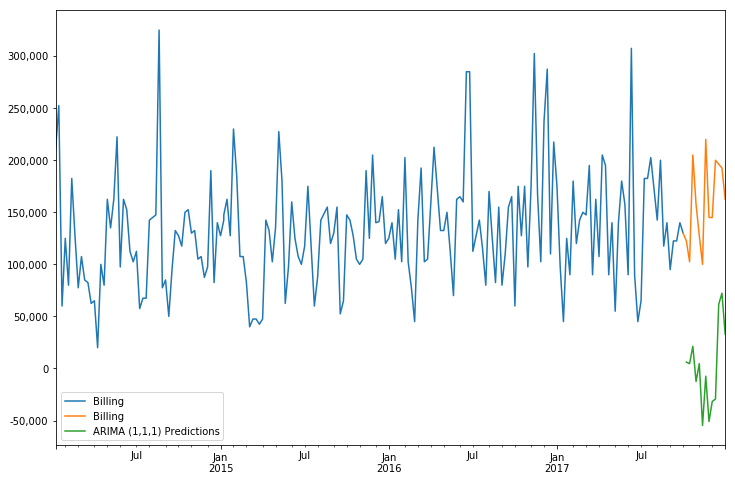

In [254]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train57['Billing'].plot(figsize=(12,8),legend=True)
test57['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [255]:
error = rmse(test57['Billing'],predictions)
error

166250.90593819835

In [256]:
auto_arima(df57['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 1, 2) seasonal_order=(1, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 1) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 1, 0) seasonal_order=(0, 0, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  201
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -2463.297
Date:                Fri, 27 May 2022   AIC                           4932.595
Time:                        14:44:16   BIC                           4942.490
Sample:                             0   HQIC                          4936.599
                                - 201                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -173.0387     98.419     -1.758      0.079    -365.936      19.859
ma.L1         -0.9963      0.076    -13.043      0.000      -1.146      -0.847
sigma2      3.318e+09    1.2e-06   2.77e+15      0.000    3.32e+09    3.32e+09
===================================================================================
Ljung-Box (Q):                       39.88   Jarque-Bera (JB):                40.10
Prob(Q):                              0.48   Prob(JB):                         0.00
Heteroskedasticity (H):               0.93   Skew:                             0.87
Prob(H) (two-sided):                  0.75   Kurtosis:                         4.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.7e+31. Standard errors may be unstable.
"""

In [257]:
model = SARIMAX(train57['Billing'],order=(0,1,1),seasonal_order=(0,0,0,52),exog=train57['Fc_and_order'],enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  189
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -2217.947
Date:                Fri, 27 May 2022   AIC                           4441.895
Time:                        14:44:39   BIC                           4451.572
Sample:                    10-01-2017   HQIC                          4445.816
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.8549      0.073     11.743      0.000       0.712       0.998
ma.L1           -1.0103      0.009   -109.892      0.000      -1.028      -0.992
sigma2        1.626e+09   1.15e-11   1.41e+20      0.000    1.63e+09    1.63e+09
===================================================================================
Ljung-Box (Q):                       54.70   Jarque-Bera (JB):               144.37
Prob(Q):                              0.06   Prob(JB):                         0.00
Heteroskedasticity (H):               0.55   Skew:                             1.38
Prob(H) (two-sided):                  0.02   Kurtosis:                         6.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.02e+35. Standard errors may be unstable.
"""

In [258]:
start = '2017-10-02'
end = '2017-12-31'

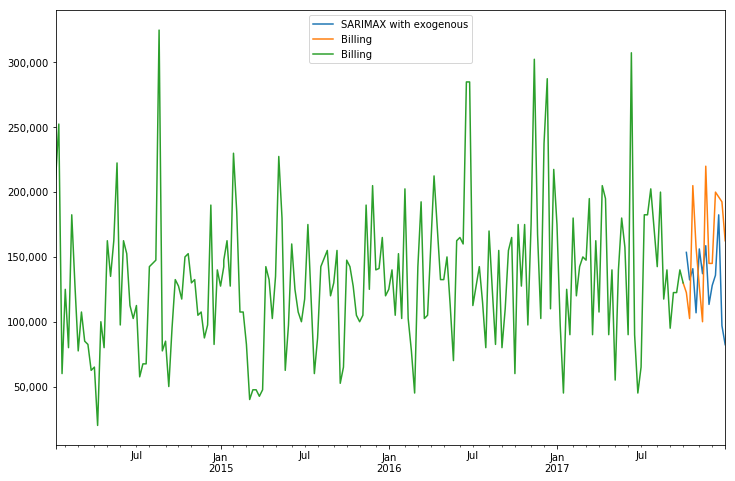

In [259]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test57['Billing'].plot(legend=True)
train57['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [260]:
error = rmse(test57['Billing'],predictions)
error

51332.18990636207

##### ARIMA forecast into the future

In [404]:
model = ARIMA(df57['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\statsmodels\base\model.py:488: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  200
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2458.078
Method:                       css-mle   S.D. of innovations          52000.296
Date:                Sun, 29 May 2022   AIC                           4924.157
Time:                        15:23:47   BIC                           4937.350
Sample:                    12-24-2017   HQIC                          4929.496
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -194.3677     75.187     -2.585      0.010    -341.733     -47.003
ar.L1.D.Billing     0.1615      0.071      2.291      0.023       0.023       0.300
ma.L1.D.Billing    -1.0000      0.014    -73.898      0.000      -1.027      -0.973
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            6.1901           +0.0000j            6.1901            0.0000
MA.1            1.0000           +0.0000j            1.0000            0.0000
-----------------------------------------------------------------------------
"""

In [405]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (1,1,1) FORECAST')

In [406]:
len(fcast)

13

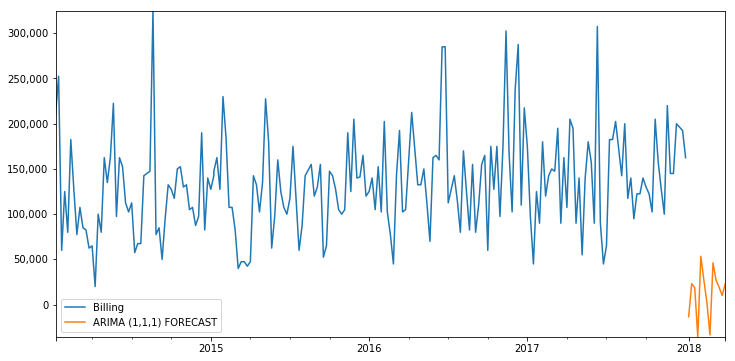

In [407]:
title = ''
ylabel = ''
xlabel = ''
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [408]:
model = SARIMAX(df57['Billing'],order=(0,1,1),seasonal_order=(0,0,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  201
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -2464.655
Date:                Sun, 29 May 2022   AIC                           4933.311
Time:                        15:24:51   BIC                           4939.907
Sample:                    12-31-2017   HQIC                          4935.980
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9714      0.021    -46.327      0.000      -1.012      -0.930
sigma2      3.339e+09   5.45e-13   6.12e+21      0.000    3.34e+09    3.34e+09
===================================================================================
Ljung-Box (Q):                       39.72   Jarque-Bera (JB):                40.23
Prob(Q):                              0.48   Prob(JB):                         0.00
Heteroskedasticity (H):               0.94   Skew:                             0.87
Prob(H) (two-sided):                  0.80   Kurtosis:                         4.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

In [409]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [410]:
len(fcast)

13

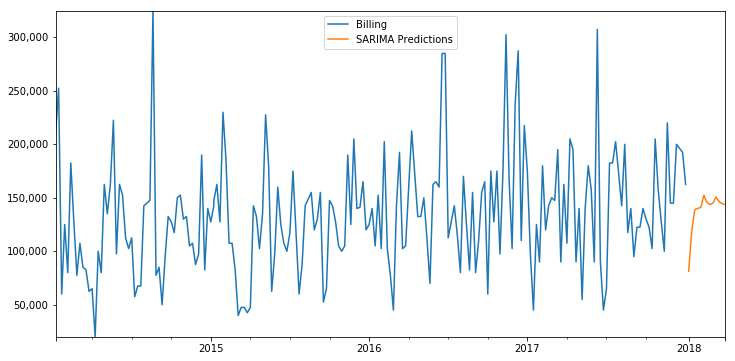

In [411]:
title = ''
ylabel = ''
xlabel = ''
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [412]:
len(df57.loc['2017-12-31':'2017-01-01'])

51

In [413]:
fcast.head()

2018-01-01/2018-01-07     81296.717134
2018-01-08/2018-01-14    118420.275892
2018-01-15/2018-01-21    138876.823357
2018-01-22/2018-01-28    140107.711502
2018-01-29/2018-02-04    140929.414203
Freq: W-SUN, Name: SARIMA Predictions, dtype: float64

##### SARIMAX forecast into the future

In [208]:
df57.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_57,201405,1,201404,35000,35000.0,80000.0
2014-01-27/2014-02-02,Product_57,201404,1,201403,105000,105000.0,125000.0
2014-01-20/2014-01-26,Product_57,201403,1,201402,40000,40000.0,60000.0
2014-01-13/2014-01-19,Product_57,201402,1,201401,120000,120000.0,252500.0
2014-01-06/2014-01-12,Product_57,201401,1,201352,190000,190000.0,210000.0


In [209]:
model = SARIMAX(df57['Billing'],exog=df57['Forecast'],order=(0,1,1),seasonal_order=(0,0,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                Billing   No. Observations:                  201
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -2358.029
Date:                Sun, 29 May 2022   AIC                           4722.059
Time:                        19:56:29   BIC                           4731.924
Sample:                    12-31-2017   HQIC                          4726.052
                         - 01-12-2014                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.8572      0.063     13.583      0.000       0.734       0.981
ma.L1         -0.9766      0.022    -44.162      0.000      -1.020      -0.933
sigma2      1.558e+09   1.56e-11   9.98e+19      0.000    1.56e+09    1.56e+09
===================================================================================
Ljung-Box (Q):                       60.79   Jarque-Bera (JB):               185.79
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               0.85   Skew:                             1.46
Prob(H) (two-sided):                  0.52   Kurtosis:                         6.75
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.71e+35. Standard errors may be unstable.
"""

In [210]:
exog_forecast = df57exo[:'2018-01-01'][['Forecast']]

In [211]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [212]:
len(fcast)

13

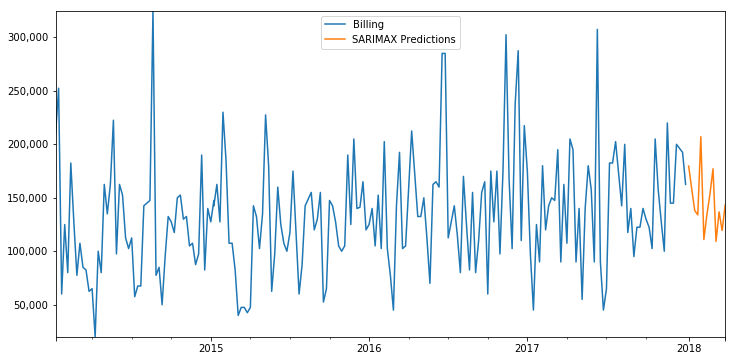

In [213]:
title = ''
ylabel = ''
xlabel = ''
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Product_67

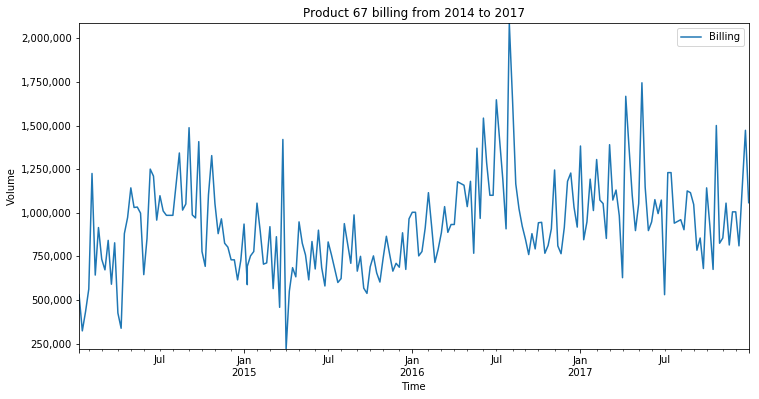

In [89]:
title = 'Product 67 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

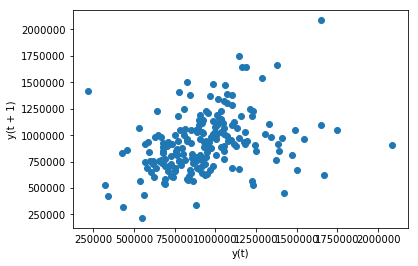

In [780]:
from pandas.plotting import lag_plot
lag_plot(df67['Billing'])

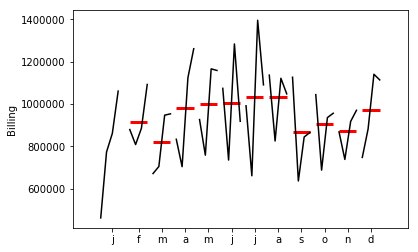

In [816]:
dfm = df67['Billing'].resample(rule='M').mean()
month_plot(dfm,ylabel='Billing');

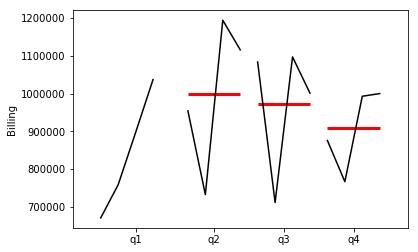

In [859]:
dfq = df67['Billing'].resample(rule='Q').mean()
quarter_plot(dfq,ylabel='Billing');

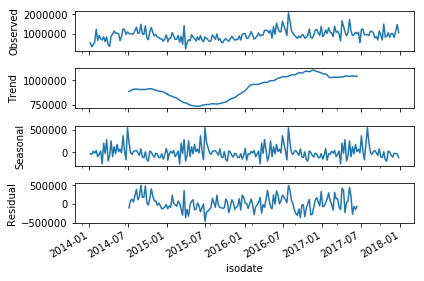

In [950]:
result = seasonal_decompose(df67['Billing'],model='add',freq=52)
result.plot();

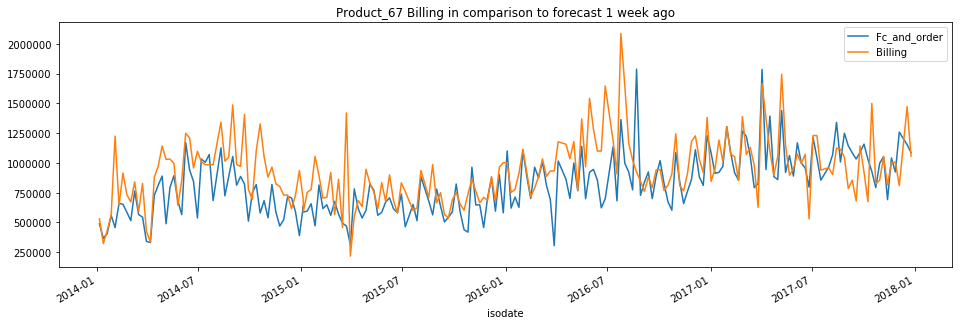

In [895]:
granger67_1[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_67 Billing in comparison to forecast 1 week ago');

In [932]:
MSE = mse(granger67_1['Fc_and_order'],granger67_1['Billing'])
RMSE = rmse(granger67_1['Fc_and_order'],granger67_1['Billing'])
MAE = meanabs(granger67_1['Fc_and_order'],granger67_1['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 68426835593.505
Client forecast RMSE: 261585.236
Client forecast  MAE: 186271.574


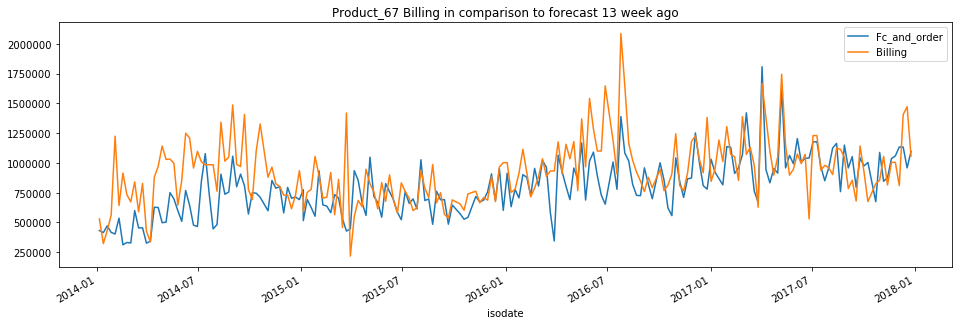

In [905]:
granger67_13[['Fc_and_order','Billing']].plot(figsize=(16,5),legend=True,title='Product_67 Billing in comparison to forecast 13 week ago');

In [933]:
MSE = mse(granger67_13['Fc_and_order'],granger67_13['Billing'])
RMSE = rmse(granger67_13['Fc_and_order'],granger67_13['Billing'])
MAE = meanabs(granger67_13['Fc_and_order'],granger67_13['Billing'])

print(f'Client forecast  MSE: {MSE:.3f}')
print(f'Client forecast RMSE: {RMSE:.3f}')
print(f'Client forecast  MAE: {MAE:.3f}')

Client forecast  MSE: 74647965181.892
Client forecast RMSE: 273217.798
Client forecast  MAE: 199227.133


In [967]:
adf_test(df67['Billing'])

Augmented Dickey-Fuller Test: 
ADF test statistic       -2.514294
p-value                   0.112035
# lags used               4.000000
# observations          197.000000
critical value (1%)      -3.463987
critical value (5%)      -2.876326
critical value (10%)     -2.574652
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [261]:
auto_arima(df67['Billing'],seasonal=False).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 1, 2); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2774.081
Method:                       css-mle   S.D. of innovations         237945.504
Date:                Fri, 27 May 2022   AIC                           5554.161
Time:                        14:46:15   BIC                           5564.071
Sample:                             1   HQIC                          5558.171
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2624.3779   3275.298     -0.801      0.424   -9043.844    3795.088
ma.L1.D.y     -0.8105      0.041    -19.833      0.000      -0.891      -0.730
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.2338           +0.0000j            1.2338            0.0000
-----------------------------------------------------------------------------
"""

In [262]:
train67 = df67['2017-09-30':]
test67 = df67[:'2017-09-30']

In [263]:
model = ARIMA(train67['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  189
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2607.067
Method:                       css-mle   S.D. of innovations         236183.304
Date:                Fri, 27 May 2022   AIC                           5220.134
Time:                        14:47:37   BIC                           5229.859
Sample:                    09-24-2017   HQIC                          5224.073
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1910.0842   3514.038     -0.544      0.587   -8797.473    4977.304
ma.L1.D.Billing    -0.7999      0.043    -18.489      0.000      -0.885      -0.715
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.2501           +0.0000j            1.2501            0.0000
-----------------------------------------------------------------------------
"""

In [264]:
start = '2017-10-02'
end = '2017-12-31'
predictions = results.predict(start,end).rename('ARIMA (0,1,1) Predictions')

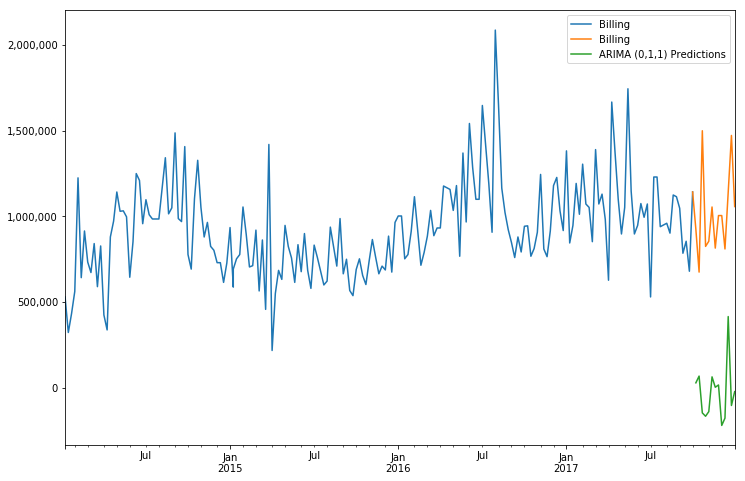

In [265]:
import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')

ax = train67['Billing'].plot(figsize=(12,8),legend=True)
test67['Billing'].plot(legend=True)
predictions.plot(legend=True)

title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [266]:
error = rmse(test67['Billing'],predictions)
error

1088095.8812581906

In [267]:
auto_arima(df67['Billing'],seasonal=True,m=52).summary()

C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(2, 0, 2) seasonal_order=(1, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(0, 0, 1) seasonal_order=(0, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning: Unable to fit ARIMA for order=(1, 0, 0) seasonal_order=(2, 1, 1, 52); data is likely non-stationary. (if you do not want to see these warnings, run with error_action="ignore")
  ModelFitWarning)
C:\Users\tammo\anaconda3\envs\tsa_course\lib\site-packages\pmdarima\arima\auto.py:870: ModelFitWarning:

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  202
Model:             SARIMAX(4, 0, 0)x(2, 1, 0, 52)   Log Likelihood               -2087.863
Date:                            Fri, 27 May 2022   AIC                           4191.727
Time:                                    14:53:35   BIC                           4215.812
Sample:                                         0   HQIC                          4201.512
                                            - 202                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -1.822e+04   4.05e+04     -0.450      0.653   -9.75e+04    6.11e+04
ar.L1          0.3812      0.094      4.049      0.000       0.197       0.566
ar.L2          0.0977      0.138      0.707      0.479      -0.173       0.368
ar.L3          0.0960      0.147      0.654      0.513      -0.192       0.384
ar.L4          0.2115      0.141      1.495      0.135      -0.066       0.489
ar.S.L52      -0.6209      0.142     -4.359      0.000      -0.900      -0.342
ar.S.L104     -0.3554      0.110     -3.232      0.001      -0.571      -0.140
sigma2      9.642e+10      0.043   2.22e+12      0.000    9.64e+10    9.64e+10
===================================================================================
Ljung-Box (Q):                       20.76   Jarque-Bera (JB):                10.88
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.62   Skew:                             0.45
Prob(H) (two-sided):                  0.09   Kurtosis:                         3.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.78e+27. Standard errors may be unstable.
"""

In [268]:
model = SARIMAX(train67['Billing'],order=(4,0,0),seasonal_order=(2,1,0,52),exog=train67['Fc_and_order'],enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  190
Model:             SARIMAX(4, 0, 0)x(2, 1, 0, 52)   Log Likelihood                -410.676
Date:                            Fri, 27 May 2022   AIC                            837.352
Time:                                    14:55:02   BIC                            848.561
Sample:                                10-01-2017   HQIC                           840.938
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Fc_and_order     0.4099      0.375      1.094      0.274      -0.325       1.145
ar.L1            0.2910      0.533      0.546      0.585      -0.754       1.336
ar.L2            0.3268      0.442      0.739      0.460      -0.540       1.194
ar.L3           -0.3410      0.729     -0.467      0.640      -1.771       1.089
ar.L4            0.0667      0.588      0.113      0.910      -1.086       1.219
ar.S.L52        -0.5012      0.323     -1.553      0.120      -1.134       0.131
ar.S.L104       -0.2700      0.314     -0.860      0.390      -0.885       0.345
sigma2        8.231e+10   2.14e-12   3.85e+22      0.000    8.23e+10    8.23e+10
===================================================================================
Ljung-Box (Q):                       22.91   Jarque-Bera (JB):                 0.92
Prob(Q):                              0.78   Prob(JB):                         0.63
Heteroskedasticity (H):               2.25   Skew:                            -0.32
Prob(H) (two-sided):                  0.22   Kurtosis:                         2.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.53e+39. Standard errors may be unstable.
"""

In [269]:
start = '2017-10-02'
end = '2017-12-31'

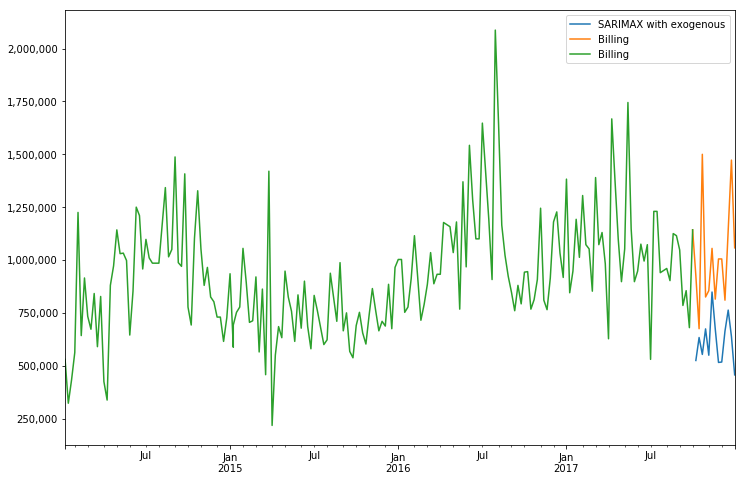

In [270]:
predictions = results.predict(start,end).rename('SARIMAX with exogenous')
ax = predictions.plot(figsize=(12,8),legend=True)
test67['Billing'].plot(legend=True)
train67['Billing'].plot(legend=True)

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
title = ''
ylabel=''
xlabel=''
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
ax.yaxis.set_major_formatter(formatter);

In [271]:
error = rmse(test67['Billing'],predictions)
error

479392.8118739426

##### ARIMA forecast into the future

In [414]:
model = ARIMA(df67['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  201
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2774.081
Method:                       css-mle   S.D. of innovations         237945.504
Date:                Sun, 29 May 2022   AIC                           5554.161
Time:                        15:27:08   BIC                           5564.071
Sample:                    12-24-2017   HQIC                          5558.171
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -2624.3779   3275.298     -0.801      0.424   -9043.844    3795.088
ma.L1.D.Billing    -0.8105      0.041    -19.833      0.000      -0.891      -0.730
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.2338           +0.0000j            1.2338            0.0000
-----------------------------------------------------------------------------
"""

In [415]:
fcast = results.predict(start='2018-01-01',end='2018-04-01').rename('ARIMA (0,1,1) FORECAST')

In [416]:
len(fcast)

13

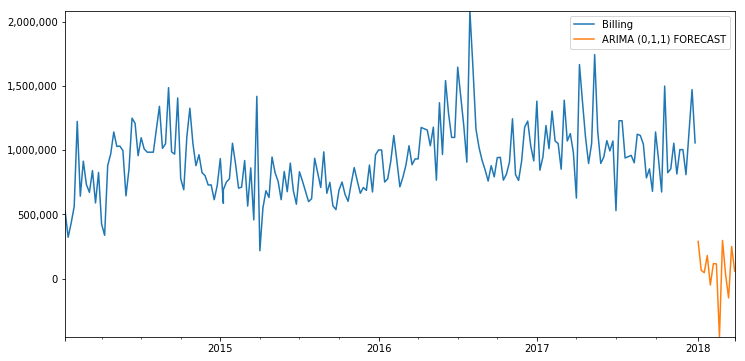

In [418]:
title = ''
ylabel = ''
xlabel = ''
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

##### SARIMA forecast into the future

In [436]:
model = SARIMAX(df67['Billing'],order=(4,0,0),seasonal_order=(2,1,0,52))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(4, 0, 0)x(2, 1, 0, 52)   Log Likelihood               -2087.181
Date:                            Sun, 29 May 2022   AIC                           4188.363
Time:                                    15:35:17   BIC                           4209.437
Sample:                                12-31-2017   HQIC                          4196.925
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3709      0.094      3.959      0.000       0.187       0.555
ar.L2          0.0953      0.140      0.682      0.495      -0.179       0.369
ar.L3          0.0914      0.149      0.612      0.541      -0.201       0.384
ar.L4          0.2055      0.143      1.442      0.149      -0.074       0.485
ar.S.L52      -0.6144      0.139     -4.432      0.000      -0.886      -0.343
ar.S.L104     -0.3614      0.105     -3.429      0.001      -0.568      -0.155
sigma2      9.674e+10   3.35e-13   2.89e+23      0.000    9.67e+10    9.67e+10
===================================================================================
Ljung-Box (Q):                       21.40   Jarque-Bera (JB):                11.60
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.64   Skew:                             0.47
Prob(H) (two-sided):                  0.12   Kurtosis:                         3.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.18e+39. Standard errors may be unstable.
"""

In [437]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels').rename('SARIMA Predictions')

In [438]:
len(fcast)

13

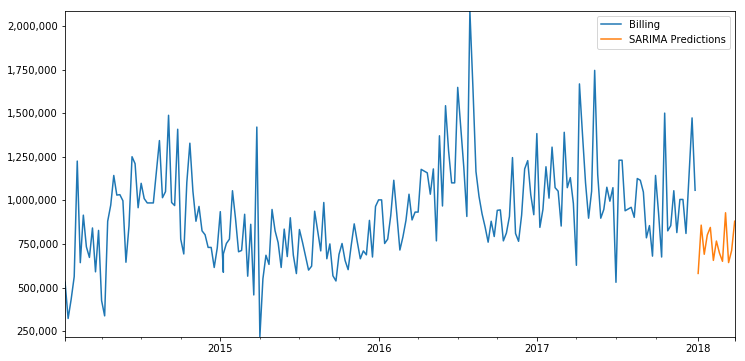

In [439]:
title = ''
ylabel = ''
xlabel = ''
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [440]:
len(df67.loc['2017-12-31':'2017-01-01'])

51

In [441]:
fcast.head()

2018-01-01/2018-01-07    580813.482311
2018-01-08/2018-01-14    857723.826429
2018-01-15/2018-01-21    690629.967773
2018-01-22/2018-01-28    801223.856696
2018-01-29/2018-02-04    844477.115200
Freq: W-SUN, Name: SARIMA Predictions, dtype: float64

##### SARIMAX forecast into the future

In [161]:
df67.tail()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2014-02-03/2014-02-09,Product_20,201405,1,201404,414438,414438.0,432000.0
2014-01-27/2014-02-02,Product_20,201404,1,201403,549350,549350.0,568000.0
2014-01-20/2014-01-26,Product_20,201403,1,201402,759243,759243.0,788000.0
2014-01-13/2014-01-19,Product_20,201402,1,201401,644972,644972.0,752000.0
2014-01-06/2014-01-12,Product_20,201401,1,201352,523579,523579.0,628000.0


In [214]:
model = SARIMAX(df67['Billing'],exog=df67['Forecast'],order=(4,0,0),seasonal_order=(2,1,0,52),enforce_stationarity=False,enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                            Billing   No. Observations:                  202
Model:             SARIMAX(4, 0, 0)x(2, 1, 0, 52)   Log Likelihood                -576.895
Date:                            Sun, 29 May 2022   AIC                           1169.789
Time:                                    19:57:49   BIC                           1183.691
Sample:                                12-31-2017   HQIC                          1174.885
                                     - 01-12-2014                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Forecast       0.5995      0.329      1.822      0.068      -0.045       1.244
ar.L1          0.2869      0.401      0.715      0.474      -0.499       1.073
ar.L2          0.2596      0.312      0.831      0.406      -0.352       0.872
ar.L3         -0.0941      0.414     -0.227      0.820      -0.906       0.718
ar.L4          0.2834      0.372      0.762      0.446      -0.445       1.012
ar.S.L52      -0.4808      0.277     -1.733      0.083      -1.025       0.063
ar.S.L104     -0.4080      0.245     -1.664      0.096      -0.888       0.072
sigma2      8.157e+10    1.6e-12   5.08e+22      0.000    8.16e+10    8.16e+10
===================================================================================
Ljung-Box (Q):                       40.01   Jarque-Bera (JB):                 0.49
Prob(Q):                              0.47   Prob(JB):                         0.78
Heteroskedasticity (H):               0.99   Skew:                            -0.05
Prob(H) (two-sided):                  0.99   Kurtosis:                         2.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.03e+38. Standard errors may be unstable.
"""

In [215]:
exog_forecast = df67exo[:'2018-01-01'][['Forecast']]

In [216]:
fcast = results.predict(start='2018-01-01',end='2018-04-01',typ='levels',exog=exog_forecast).rename('SARIMAX Predictions')

In [217]:
len(fcast)

13

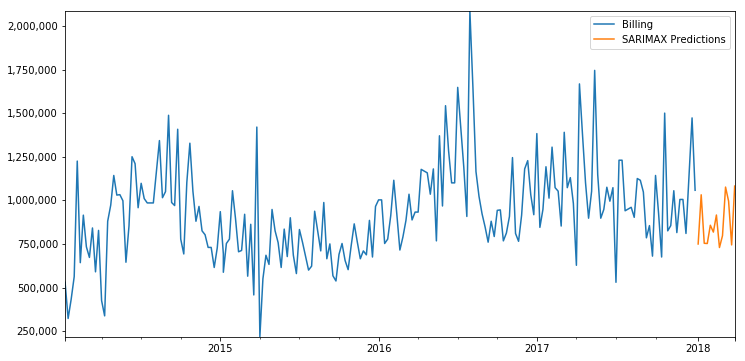

In [218]:
title = ''
ylabel = ''
xlabel = ''
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

# Q2/2018 FORECAST

# Standard imports 

In [36]:
import numpy as np
import pandas as pd
import datetime as dt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# Read dataset

In [219]:
cd C:\Users\tammo\OneDrive\Desktop\FC

C:\Users\tammo\OneDrive\Desktop\FC


In [220]:
pwd

'C:\\Users\\tammo\\OneDrive\\Desktop\\FC'

In [299]:
# WITHOUT INDEX COLUMN 
df = pd.read_excel('Daten_ForecastingChallenge - Q12018.xlsx').drop('Unnamed: 0',axis=1)

# Transform week number into an isodate, set column 'isodate' as index

In [300]:
df['isodate'] = df[['Due_date']].apply(lambda x: dt.datetime.strptime(str(x['Due_date'])+'-1', "%Y%W-%w"),axis=1)

In [301]:
df.set_index(['isodate'],inplace=True)

In [302]:
df.index = pd.DatetimeIndex(df.index).to_period('W')

# Prepare Data

## Only selected certain product and drop duplicates

In [226]:
len(df)

28764

In [303]:
df19 = df[df['Sp_number']=='Product_19']
df20 = df[df['Sp_number']=='Product_20']
df22 = df[df['Sp_number']=='Product_22']
df30 = df[df['Sp_number']=='Product_30']
df39 = df[df['Sp_number']=='Product_39']
df48 = df[df['Sp_number']=='Product_48']
df50 = df[df['Sp_number']=='Product_50']
df55 = df[df['Sp_number']=='Product_55']
df57 = df[df['Sp_number']=='Product_57']
df67 = df[df['Sp_number']=='Product_67']

In [281]:
len(df19)

2887

In [17]:
# df20 = df20.sort_index(ascending=True)

## Prepare exogenous data

In [250]:
def calculate_forecast(df):
    '''
    Returns youngest available forecasted values for next quartal in new column 'Forecast', especially for SARIMAX models.
    input: df with columns Fc_horizon, Fc_and_Order. Index format is ...
    output: df with an additional column 'Forecast'
    '''
    df_ = df[:'2018-04-02/2018-04-08'].copy()
    dates = df_.index.unique()
    # print(len(dates),dates)
    horizons = df_.Fc_horizon.unique()
    counter = 13
    data = {}
    
    for date in dates:
        forecast = df_.Fc_and_order.loc[(df_.Fc_horizon == counter) & (df_.index == date)].values.tolist()
        counter-=1
        data[date] = forecast[0]   
        
    df__ = pd.DataFrame.from_dict(data, orient='index', columns=['Forecast_NEW'])
    df["NEW"] = df__['Forecast_NEW']
    df1 = df.loc[df['Fc_horizon'] == 1]
    df_new = df[df['NEW'].notna()].drop_duplicates(subset=['Fc_horizon'])
    df_conc = pd.concat([df1,df_new])
    df_conc.sort_index(ascending=False, inplace=True)
    df_conc['Fc_and_order'][df_conc['NEW'].notna()] = 0
    df_conc['NEW'][df_conc['NEW'].isna()] = 0
    # df_conc[df_conc['Billing'].isna()] = 0
    df_conc['Forecast'] = df_conc["Fc_and_order"] + df_conc['NEW']
    return df_conc[['Sp_number', 'Due_date', 'Fc_horizon', 'Fc_date', 'Fc_and_order', 'Forecast', 'Billing']]

In [251]:
df19 = calculate_forecast(df19)
df20 = calculate_forecast(df20)
df22 = calculate_forecast(df22)
df30 = calculate_forecast(df30)
df39 = calculate_forecast(df39)
df48 = calculate_forecast(df48)
df50 = calculate_forecast(df50)
df55 = calculate_forecast(df55)
df57 = calculate_forecast(df57)
df67 = calculate_forecast(df67)

In [304]:
len(df19)

2887

In [305]:
df19 = df19[~((df19[['Fc_date','Billing']].duplicated(keep=False))&(df19[['Billing']].isnull().any(axis=1)))]
df20 = df20[~((df20[['Fc_date','Billing']].duplicated(keep=False))&(df20[['Billing']].isnull().any(axis=1)))]
df22 = df22[~((df22[['Fc_date','Billing']].duplicated(keep=False))&(df22[['Billing']].isnull().any(axis=1)))]
df30 = df30[~((df30[['Fc_date','Billing']].duplicated(keep=False))&(df30[['Billing']].isnull().any(axis=1)))]
df39 = df39[~((df39[['Fc_date','Billing']].duplicated(keep=False))&(df39[['Billing']].isnull().any(axis=1)))]
df48 = df48[~((df48[['Fc_date','Billing']].duplicated(keep=False))&(df48[['Billing']].isnull().any(axis=1)))]
df50 = df50[~((df50[['Fc_date','Billing']].duplicated(keep=False))&(df50[['Billing']].isnull().any(axis=1)))]
df55 = df55[~((df55[['Fc_date','Billing']].duplicated(keep=False))&(df55[['Billing']].isnull().any(axis=1)))]
df57 = df57[~((df57[['Fc_date','Billing']].duplicated(keep=False))&(df57[['Billing']].isnull().any(axis=1)))]
df67 = df67[~((df67[['Fc_date','Billing']].duplicated(keep=False))&(df67[['Billing']].isnull().any(axis=1)))]

In [306]:
df19 = df19.drop_duplicates(['Due_date'])
df20 = df20.drop_duplicates(['Due_date'])
df22 = df22.drop_duplicates(['Due_date'])
df30 = df30.drop_duplicates(['Due_date'])
df39 = df39.drop_duplicates(['Due_date'])
df48 = df48.drop_duplicates(['Due_date'])
df50 = df50.drop_duplicates(['Due_date'])
df55 = df55.drop_duplicates(['Due_date'])
df57 = df57.drop_duplicates(['Due_date'])
df67 = df67.drop_duplicates(['Due_date'])

In [307]:
df19

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,176316,197000.0
2018-03-19/2018-03-25,Product_19,201812,12,201752,337246,315000.0
2018-03-12/2018-03-18,Product_19,201811,12,201751,264364,369000.0
2018-03-05/2018-03-11,Product_19,201810,12,201750,292372,287000.0
2018-02-26/2018-03-04,Product_19,201809,11,201750,142284,231000.0
2018-02-19/2018-02-25,Product_19,201808,12,201748,255054,231000.0
2018-02-12/2018-02-18,Product_19,201807,12,201747,264644,300000.0
2018-02-05/2018-02-11,Product_19,201806,12,201746,258875,220000.0
2018-01-29/2018-02-04,Product_19,201805,12,201745,244088,181000.0


In [255]:
df19exo = df19
df20exo = df20
df22exo = df22
df30exo = df30
df39exo = df39
df48exo = df48
df50exo = df50
df55exo = df55
df57exo = df57
df67exo = df67

In [256]:
df19exo

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2018-06-25/2018-07-01,Product_19,201826,13,201813,0,137489.0,NaN
2018-06-18/2018-06-24,Product_19,201825,12,201813,0,310447.0,NaN
2018-06-11/2018-06-17,Product_19,201824,11,201813,0,362922.0,NaN
2018-06-04/2018-06-10,Product_19,201823,10,201813,0,269096.0,NaN
2018-05-28/2018-06-03,Product_19,201822,9,201813,0,270121.0,NaN
2018-05-21/2018-05-27,Product_19,201821,8,201813,0,308302.0,NaN
2018-05-14/2018-05-20,Product_19,201820,7,201813,0,300166.0,NaN
2018-05-07/2018-05-13,Product_19,201819,6,201813,0,269412.0,NaN
2018-04-30/2018-05-06,Product_19,201818,5,201813,0,295195.0,NaN


In [241]:
df19 = df19.dropna()
df20 = df20.dropna()
df22 = df22.dropna()
df30 = df30.dropna()
df39 = df39.dropna()
df48 = df48.dropna()
df50 = df50.dropna()
df55 = df55.dropna()
df57 = df57.dropna()
df67 = df67.dropna()

In [242]:
len(df19)

203

In [243]:
len(df19exo)

228

In [67]:
df19.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,176316,197000.0
2018-03-19/2018-03-25,Product_19,201812,12,201752,337246,315000.0
2018-03-19/2018-03-25,Product_19,201812,13,201751,345894,315000.0
2018-03-12/2018-03-18,Product_19,201811,12,201751,264364,369000.0
2018-03-12/2018-03-18,Product_19,201811,11,201752,266735,369000.0


[Text(0, 0.5, 'Volume'), Text(0.5, 0, 'Time')]

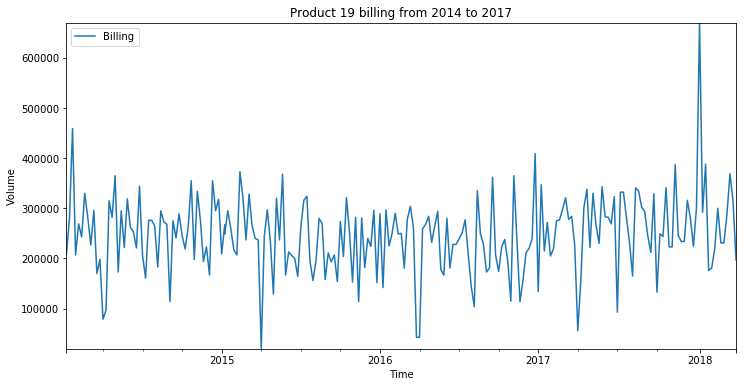

In [70]:
title = 'Product 19 billing from 2014 to 2017'
ylabel = 'Volume'
xlabel = 'Time'
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
ax.autoscale(axis='both',tight=True)
ax.set(xlabel=xlabel,ylabel=ylabel)

In [308]:
df19.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-03-26/2018-04-01,Product_19,201813,13,201752,176316,197000.0
2018-03-19/2018-03-25,Product_19,201812,12,201752,337246,315000.0
2018-03-12/2018-03-18,Product_19,201811,12,201751,264364,369000.0
2018-03-05/2018-03-11,Product_19,201810,12,201750,292372,287000.0
2018-02-26/2018-03-04,Product_19,201809,11,201750,142284,231000.0


## Save results Q2/2018

In [436]:
def _create_output(series, product:str):
    '''
    Input series format: index is equalt to dates (datetime format); one column with floats
    Output df format: product 19-, week 1-13, units (forecast)
    '''
    weeks = series.index.week
    product_ = pd.Series([product]*len(weeks))
    data = {'Product': product_, 'Week': weeks, 'Units': series.values}
    return pd.DataFrame(data, columns=data.keys())


def save_forecast(arr_of_dfs, filename='FORECAST_2018_Q2.xlsx'):
    # save in a directory 
    import os
    DIR = os.getcwd()
    if not os.path.exists(DIR):
        print("PROVIDE PATH TO FILE MANUALLY")
    FILE_NAME = filename
    PATH = os.path.join(DIR, FILE_NAME)
    
    # saving
    RES = pd.concat(arr_of_dfs, axis=0)
    RES.to_excel('FORECAST_2018_Q2.xlsx')
    print(f'SUCCESSFULLY SAVED IN {PATH}')

# Predictions vs actual billing

In [194]:
cd C:\Users\tammo\OneDrive\Desktop\FC

C:\Users\tammo\OneDrive\Desktop\FC


In [195]:
pwd

'C:\\Users\\tammo\\OneDrive\\Desktop\\FC'

In [196]:
# WITHOUT INDEX COLUMN
review = pd.read_excel('FORECAST_2018_Q1.xlsx')

In [197]:
review['isodate'] = review[['Week']].apply(lambda x: dt.datetime.strptime(str(x['Week'])+'-1'+'-2018',"%W-%w-%Y"),axis=1)

In [198]:
review.set_index(['isodate'],inplace=True)

In [199]:
review.head()

,Product,Week,Units,Actual Billing
isodate,,,,
2018-01-01,Product_19,1,243783.455446,670000
2018-01-08,Product_19,2,243783.455446,292000
2018-01-15,Product_19,3,243783.455446,388000
2018-01-22,Product_19,4,243783.455446,176000
2018-01-29,Product_19,5,243783.455446,181000


In [106]:
review19 = review[review['Product']=='Product_19']
review20 = review[review['Product']=='Product_20']
review22 = review[review['Product']=='Product_22']
review30 = review[review['Product']=='Product_30']
review39 = review[review['Product']=='Product_39']
review48 = review[review['Product']=='Product_48']
review50 = review[review['Product']=='Product_50']
review55 = review[review['Product']=='Product_55']
review57 = review[review['Product']=='Product_57']
review67 = review[review['Product']=='Product_67']

In [193]:
df19.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Forecast,Billing
isodate,,,,,,,
2018-01-01/2018-01-07,Product_19,201801,1,201752,380986,380986,670000.0
2017-12-25/2017-12-31,Product_19,201752,1,201751,182723,182723,301000.0
2017-12-18/2017-12-24,Product_19,201751,1,201750,194600,194600,224000.0
2017-12-04/2017-12-10,Product_19,201749,1,201748,328866,328866,316000.0
2017-11-27/2017-12-03,Product_19,201748,1,201747,183804,183804,234000.0


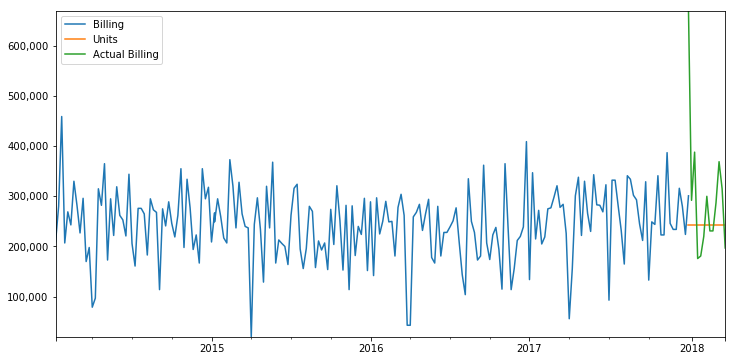

In [108]:
title = ''
ylabel = ''
xlabel = ''
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
review19['Units'].plot(figsize=(12,6),legend=True,title=title);
review19['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [143]:
MEAN = review19['Actual Billing'].mean()
RMSE = rmse(review19['Units'],review19['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 296692.308
Forecast RMSE: 136489.018
Error: 46%


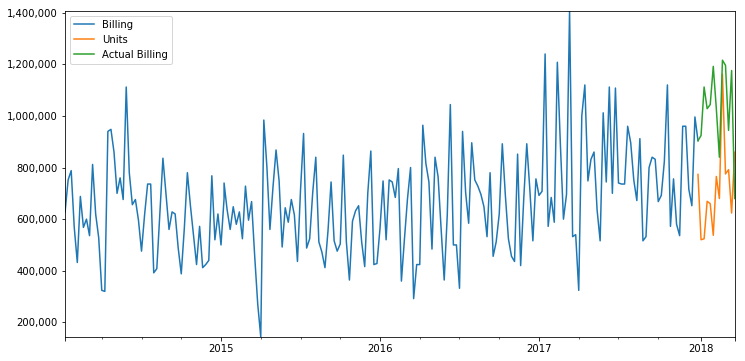

In [109]:
title = ''
ylabel = ''
xlabel = ''
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
review20['Units'].plot(figsize=(12,6),legend=True,title=title);
review20['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [142]:
MEAN = review20['Actual Billing'].mean()
RMSE = rmse(review20['Units'],review20['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 1021846.154
Forecast RMSE: 378865.834
Error: 37%


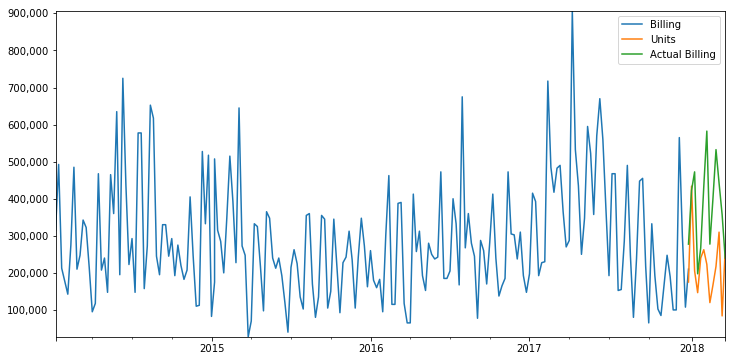

In [110]:
title = ''
ylabel = ''
xlabel = ''
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
review22['Units'].plot(figsize=(12,6),legend=True,title=title);
review22['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [141]:
MEAN = review22['Actual Billing'].mean()
RMSE = rmse(review22['Units'],review22['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 377115.385
Forecast RMSE: 198974.260
Error: 53%


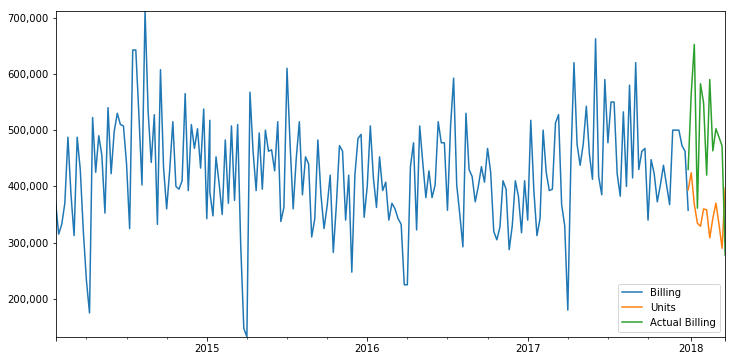

In [111]:
title = ''
ylabel = ''
xlabel = ''
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
review30['Units'].plot(figsize=(12,6),legend=True,title=title);
review30['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [140]:
MEAN = review30['Actual Billing'].mean()
RMSE = rmse(review30['Units'],review30['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 488606.462
Forecast RMSE: 172961.174
Error: 35%


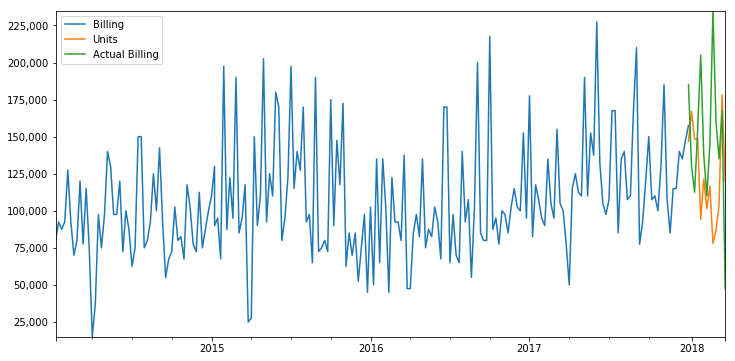

In [112]:
title = ''
ylabel = ''
xlabel = ''
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
review39['Units'].plot(figsize=(12,6),legend=True,title=title);
review39['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [139]:
MEAN = review39['Actual Billing'].mean()
RMSE = rmse(review39['Units'],review39['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 148076.923
Forecast RMSE: 64383.991
Error: 43%


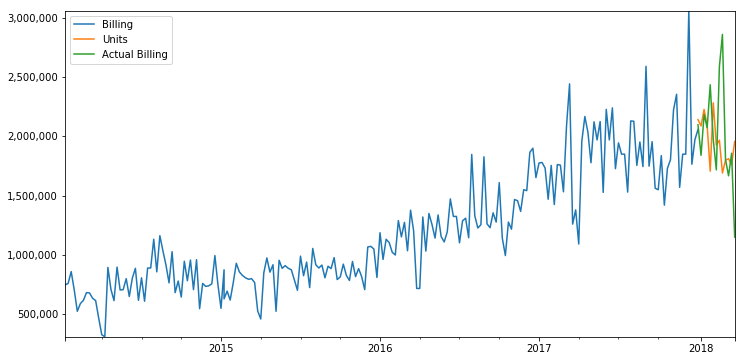

In [113]:
title = ''
ylabel = ''
xlabel = ''
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
review48['Units'].plot(figsize=(12,6),legend=True,title=title);
review48['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [144]:
MEAN = review48['Actual Billing'].mean()
RMSE = rmse(review48['Units'],review48['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 2019099.462
Forecast RMSE: 493624.476
Error: 24%


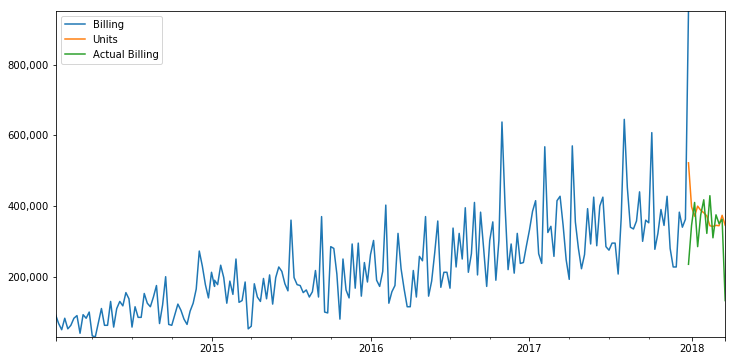

In [114]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
review50['Units'].plot(figsize=(12,6),legend=True,title=title);
review50['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [145]:
MEAN = review50['Actual Billing'].mean()
RMSE = rmse(review50['Units'],review50['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 334545.538
Forecast RMSE: 110414.056
Error: 33%


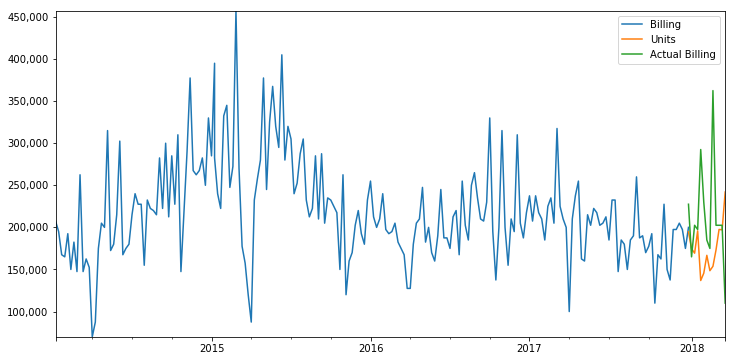

In [115]:
title = ''
ylabel = ''
xlabel = ''
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
review55['Units'].plot(figsize=(12,6),legend=True,title=title);
review55['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [146]:
MEAN = review55['Actual Billing'].mean()
RMSE = rmse(review55['Units'],review55['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 211923.077
Forecast RMSE: 86185.632
Error: 41%


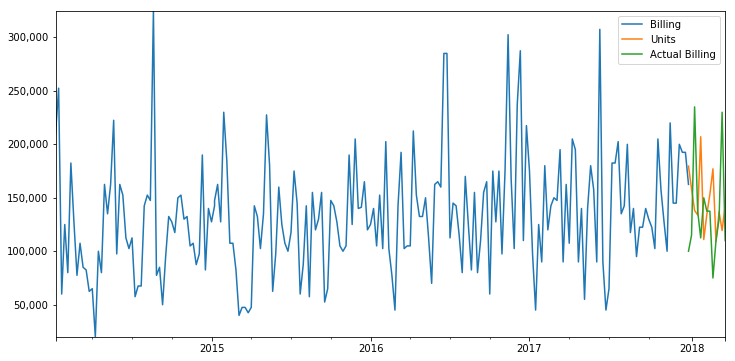

In [116]:
title = ''
ylabel = ''
xlabel = ''
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
review57['Units'].plot(figsize=(12,6),legend=True,title=title);
review57['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [147]:
MEAN = review57['Actual Billing'].mean()
RMSE = rmse(review57['Units'],review57['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 136923.077
Forecast RMSE: 63357.216
Error: 46%


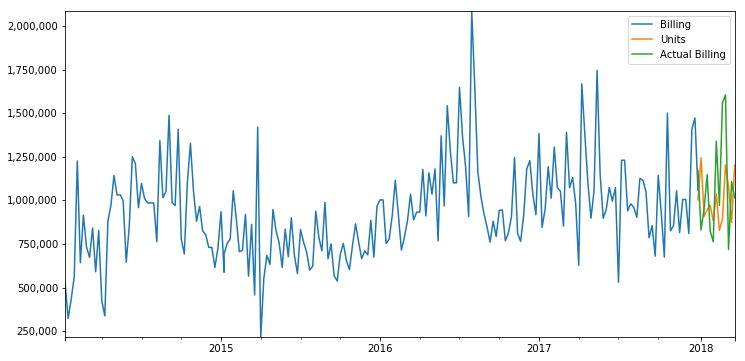

In [117]:
title = ''
ylabel = ''
xlabel = ''
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
review67['Units'].plot(figsize=(12,6),legend=True,title=title);
review67['Actual Billing'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

In [148]:
MEAN = review67['Actual Billing'].mean()
RMSE = rmse(review67['Units'],review67['Actual Billing'])
ERR = 100 * RMSE/MEAN

print(f'Mean: {MEAN:.3f}')
print(f'Forecast RMSE: {RMSE:.3f}')
print(f'Error: {ERR:.0f}%')

Mean: 1076730.769
Forecast RMSE: 305940.539
Error: 28%


## Forecasts

### Prepare nonstationary data frames

In [341]:
df_nonstationary = df.loc[df["Fc_date"]==201813].sort_values('Fc_horizon',ascending=True)

In [343]:
df_nonstationary.head()

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_67,201814,1,201813,1016633,NaN
2018-04-02/2018-04-08,Product_19,201814,1,201813,131779,NaN
2018-04-02/2018-04-08,Product_20,201814,1,201813,738275,NaN
2018-04-02/2018-04-08,Product_22,201814,1,201813,492120,NaN
2018-04-02/2018-04-08,Product_30,201814,1,201813,373530,NaN


In [344]:
df_nonstationary19 = df_nonstationary[df_nonstationary['Sp_number']=='Product_19']
df_nonstationary20 = df_nonstationary[df_nonstationary['Sp_number']=='Product_20']
df_nonstationary22 = df_nonstationary[df_nonstationary['Sp_number']=='Product_22']
df_nonstationary30 = df_nonstationary[df_nonstationary['Sp_number']=='Product_30']
df_nonstationary39 = df_nonstationary[df_nonstationary['Sp_number']=='Product_39']
df_nonstationary48 = df_nonstationary[df_nonstationary['Sp_number']=='Product_48']
df_nonstationary50 = df_nonstationary[df_nonstationary['Sp_number']=='Product_50']
df_nonstationary55 = df_nonstationary[df_nonstationary['Sp_number']=='Product_55']
df_nonstationary57 = df_nonstationary[df_nonstationary['Sp_number']=='Product_57']
df_nonstationary67 = df_nonstationary[df_nonstationary['Sp_number']=='Product_67']

In [165]:
df19 = df19.dropna()
df20 = df20.dropna()
df22 = df22.dropna()
df30 = df30.dropna()
df39 = df39.dropna()
df48 = df48.dropna()
df50 = df50.dropna()
df55 = df55.dropna()
df57 = df57.dropna()
df67 = df67.dropna()

### Product_19

In [437]:
df_nonstationary19

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_19,201814,1,201813,131779,NaN
2018-04-09/2018-04-15,Product_19,201815,2,201813,254130,NaN
2018-04-16/2018-04-22,Product_19,201816,3,201813,439991,NaN
2018-04-23/2018-04-29,Product_19,201817,4,201813,265512,NaN
2018-04-30/2018-05-06,Product_19,201818,5,201813,295195,NaN
2018-05-07/2018-05-13,Product_19,201819,6,201813,269412,NaN
2018-05-14/2018-05-20,Product_19,201820,7,201813,300166,NaN
2018-05-21/2018-05-27,Product_19,201821,8,201813,308302,NaN
2018-05-28/2018-06-03,Product_19,201822,9,201813,270121,NaN


In [438]:
df_nonstationary19['Fc_and_order'].mean()

276594.78571428574

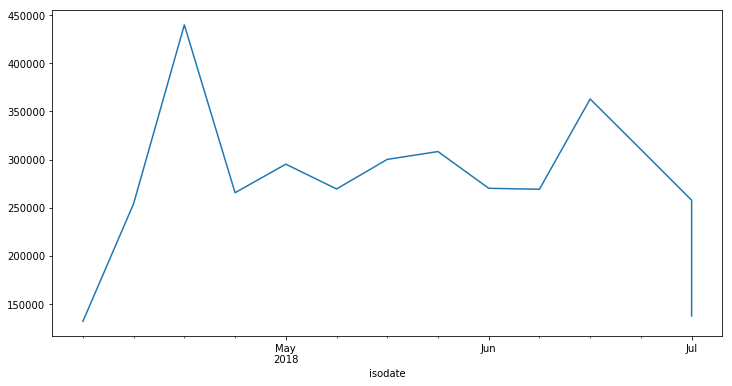

In [439]:
df_nonstationary19['Fc_and_order'].plot(figsize=(12,6))

In [449]:
fcast19 = _create_output(df_nonstationary19['Fc_and_order'],'Product_19')

##### ARIMA forecast into the future

In [309]:
auto_arima(df19['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  222
Model:                     ARMA(0, 0)   Log Likelihood               -2809.575
Method:                           css   S.D. of innovations          75872.243
Date:                Sat, 11 Jun 2022   AIC                           5623.151
Time:                        13:06:46   BIC                           5629.956
Sample:                             0   HQIC                          5625.898
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.474e+05   5092.212     48.581      0.000    2.37e+05    2.57e+05
==============================================================================
"""

In [442]:
model = ARMA(df19['Billing'],order=(0,0))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  222
Model:                     ARMA(0, 0)   Log Likelihood               -2809.575
Method:                           css   S.D. of innovations          75872.243
Date:                Sun, 12 Jun 2022   AIC                           5623.151
Time:                        12:04:23   BIC                           5629.956
Sample:                    04-01-2018   HQIC                          5625.898
                         - 01-12-2014                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.474e+05   5092.212     48.581      0.000    2.37e+05    2.57e+05
==============================================================================
"""

In [443]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARMA (0,0) FORECAST')

In [444]:
len(fcast)

13

In [446]:
fcast.head()

2018-04-02/2018-04-08    247384.045045
2018-04-09/2018-04-15    247384.045045
2018-04-16/2018-04-22    247384.045045
2018-04-23/2018-04-29    247384.045045
2018-04-30/2018-05-06    247384.045045
Freq: W-SUN, Name: ARMA (0,0) FORECAST, dtype: float64

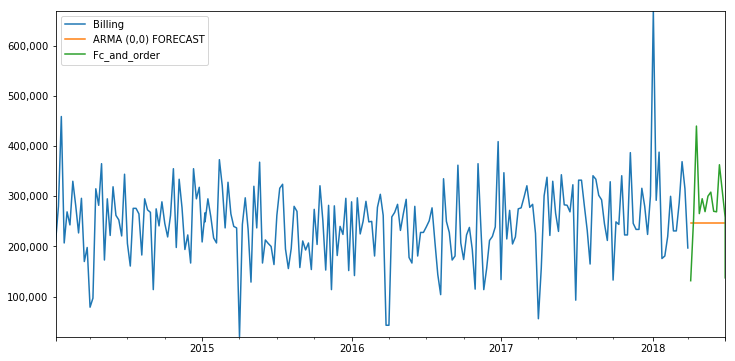

In [445]:
title = ''
ylabel = ''
xlabel = ''
ax = df19['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary19['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_20

In [351]:
df_nonstationary20

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_20,201814,1,201813,738275,NaN
2018-04-09/2018-04-15,Product_20,201815,2,201813,970139,NaN
2018-04-16/2018-04-22,Product_20,201816,3,201813,1046513,NaN
2018-04-23/2018-04-29,Product_20,201817,4,201813,721687,NaN
2018-04-30/2018-05-06,Product_20,201818,5,201813,613586,NaN
2018-05-07/2018-05-13,Product_20,201819,6,201813,900102,NaN
2018-05-14/2018-05-20,Product_20,201820,7,201813,1027790,NaN
2018-05-21/2018-05-27,Product_20,201821,8,201813,698407,NaN
2018-05-28/2018-06-03,Product_20,201822,9,201813,608595,NaN


In [350]:
df_nonstationary20['Fc_and_order'].mean()

815031.4285714285

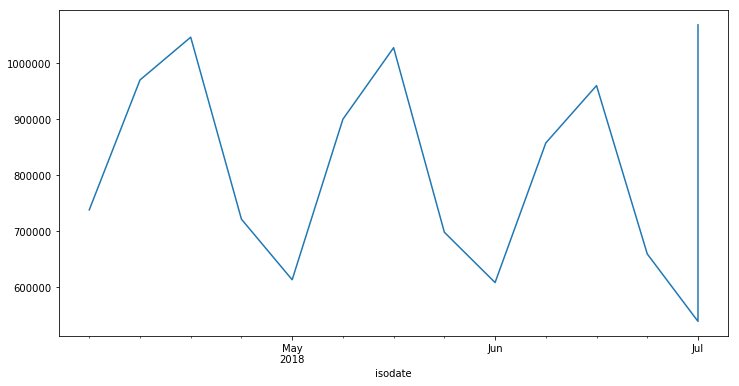

In [352]:
df_nonstationary20['Fc_and_order'].plot(figsize=(12,6))

In [450]:
fcast20 = _create_output(df_nonstationary20['Fc_and_order'],'Product_20')

##### ARIMA forecast into the future

In [365]:
auto_arima(df20['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(2, 1, 3)   Log Likelihood               -2985.035
Method:                       css-mle   S.D. of innovations         176407.410
Date:                Sun, 12 Jun 2022   AIC                           5984.069
Time:                        11:03:43   BIC                           6007.857
Sample:                             1   HQIC                          5993.674
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1270.6576   1056.502     -1.203      0.230   -3341.363     800.047
ar.L1.D.y      0.2392      0.023     10.325      0.000       0.194       0.285
ar.L2.D.y     -0.9875      0.016    -61.533      0.000      -1.019      -0.956
ma.L1.D.y     -1.1203      0.055    -20.497      0.000      -1.227      -1.013
ma.L2.D.y      1.1259      0.043     26.249      0.000       1.042       1.210
ma.L3.D.y     -0.8583      0.077    -11.098      0.000      -1.010      -0.707
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.1211           -0.9990j            1.0063           -0.2308
AR.2            0.1211           +0.9990j            1.0063            0.2308
MA.1            1.0929           -0.0000j            1.0929           -0.0000
MA.2            0.1095           -1.0267j            1.0325           -0.2331
MA.3            0.1095           +1.0267j            1.0325            0.2331
-----------------------------------------------------------------------------
"""

In [366]:
model = ARIMA(df20['Billing'],order=(2,1,3))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(2, 1, 3)   Log Likelihood               -2985.035
Method:                       css-mle   S.D. of innovations         176407.410
Date:                Sun, 12 Jun 2022   AIC                           5984.069
Time:                        11:03:52   BIC                           6007.857
Sample:                    03-25-2018   HQIC                          5993.674
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1270.6576   1056.502     -1.203      0.230   -3341.363     800.047
ar.L1.D.Billing     0.2392      0.023     10.325      0.000       0.194       0.285
ar.L2.D.Billing    -0.9875      0.016    -61.533      0.000      -1.019      -0.956
ma.L1.D.Billing    -1.1203      0.055    -20.497      0.000      -1.227      -1.013
ma.L2.D.Billing     1.1259      0.043     26.249      0.000       1.042       1.210
ma.L3.D.Billing    -0.8583      0.077    -11.098      0.000      -1.010      -0.707
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.1211           -0.9990j            1.0063           -0.2308
AR.2            0.1211           +0.9990j            1.0063            0.2308
MA.1            1.0929           -0.0000j            1.0929           -0.0000
MA.2            0.1095           -1.0267j            1.0325           -0.2331
MA.3            0.1095           +1.0267j            1.0325            0.2331
-----------------------------------------------------------------------------
"""

In [367]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARMA (0,0) FORECAST')

In [368]:
len(fcast)

13

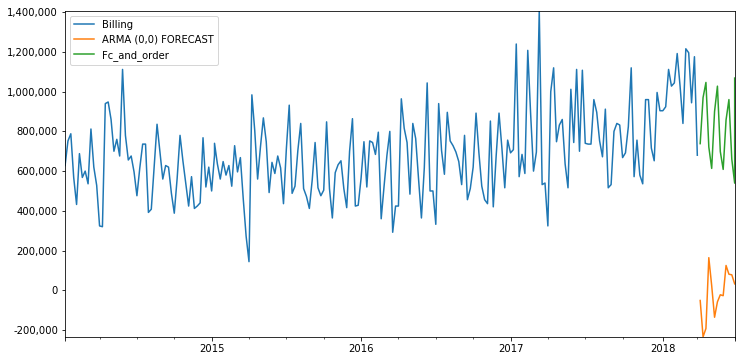

In [369]:
title = ''
ylabel = ''
xlabel = ''
ax = df20['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary20['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_22

In [353]:
df_nonstationary22

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_22,201814,1,201813,492120,NaN
2018-04-09/2018-04-15,Product_22,201815,2,201813,407660,NaN
2018-04-16/2018-04-22,Product_22,201816,3,201813,423140,NaN
2018-04-23/2018-04-29,Product_22,201817,4,201813,207340,NaN
2018-04-30/2018-05-06,Product_22,201818,5,201813,204820,NaN
2018-05-07/2018-05-13,Product_22,201819,6,201813,452860,NaN
2018-05-14/2018-05-20,Product_22,201820,7,201813,342960,NaN
2018-05-21/2018-05-27,Product_22,201821,8,201813,326730,NaN
2018-05-28/2018-06-03,Product_22,201822,9,201813,213840,NaN


In [355]:
df_nonstationary22['Fc_and_order'].mean()

347496.21428571426

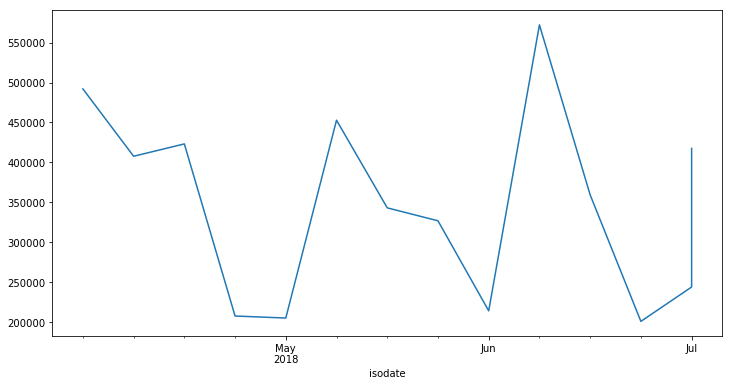

In [370]:
df_nonstationary22['Fc_and_order'].plot(figsize=(12,6))

In [451]:
fcast22 = _create_output(df_nonstationary22['Fc_and_order'],'Product_22')

##### ARIMA forecast into the future

In [371]:
auto_arima(df22['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  222
Model:                     ARMA(2, 2)   Log Likelihood               -2934.066
Method:                       css-mle   S.D. of innovations         132282.892
Date:                Sun, 12 Jun 2022   AIC                           5880.132
Time:                        11:05:02   BIC                           5900.548
Sample:                             0   HQIC                          5888.375
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.923e+05   9648.319     30.299      0.000    2.73e+05    3.11e+05
ar.L1.y        0.2125      0.032      6.743      0.000       0.151       0.274
ar.L2.y       -0.9483      0.027    -34.673      0.000      -1.002      -0.895
ma.L1.y       -0.0331      0.056     -0.594      0.553      -0.142       0.076
ma.L2.y        0.9193      0.031     29.472      0.000       0.858       0.980
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.1120           -1.0208j            1.0269           -0.2326
AR.2            0.1120           +1.0208j            1.0269            0.2326
MA.1            0.0180           -1.0428j            1.0430           -0.2473
MA.2            0.0180           +1.0428j            1.0430            0.2473
-----------------------------------------------------------------------------
"""

In [358]:
model = ARMA(df22['Billing'],order=(2,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  222
Model:                     ARMA(2, 2)   Log Likelihood               -2934.066
Method:                       css-mle   S.D. of innovations         132282.892
Date:                Sun, 12 Jun 2022   AIC                           5880.132
Time:                        10:47:35   BIC                           5900.548
Sample:                    04-01-2018   HQIC                          5888.375
                         - 01-12-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          2.923e+05   9648.319     30.299      0.000    2.73e+05    3.11e+05
ar.L1.Billing     0.2125      0.032      6.743      0.000       0.151       0.274
ar.L2.Billing    -0.9483      0.027    -34.673      0.000      -1.002      -0.895
ma.L1.Billing    -0.0331      0.056     -0.594      0.553      -0.142       0.076
ma.L2.Billing     0.9193      0.031     29.472      0.000       0.858       0.980
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.1120           -1.0208j            1.0269           -0.2326
AR.2            0.1120           +1.0208j            1.0269            0.2326
MA.1            0.0180           -1.0428j            1.0430           -0.2473
MA.2            0.0180           +1.0428j            1.0430            0.2473
-----------------------------------------------------------------------------
"""

In [359]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARMA (2,2) FORECAST')

In [360]:
len(fcast)

13

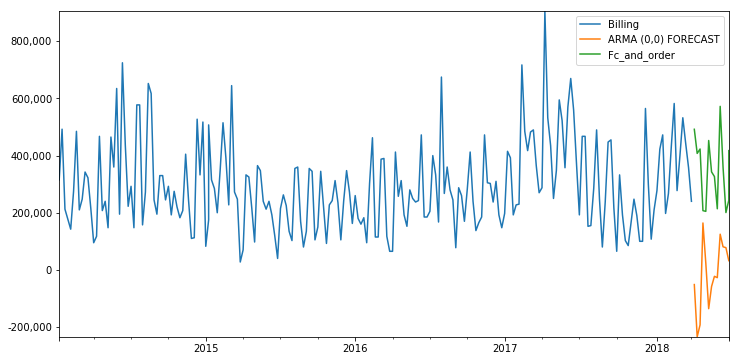

In [372]:
title = ''
ylabel = ''
xlabel = ''
ax = df22['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary22['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_30

In [373]:
df_nonstationary30

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_30,201814,1,201813,373530,NaN
2018-04-09/2018-04-15,Product_30,201815,2,201813,594241,NaN
2018-04-16/2018-04-22,Product_30,201816,3,201813,549671,NaN
2018-04-23/2018-04-29,Product_30,201817,4,201813,512215,NaN
2018-04-30/2018-05-06,Product_30,201818,5,201813,481004,NaN
2018-05-07/2018-05-13,Product_30,201819,6,201813,653953,NaN
2018-05-14/2018-05-20,Product_30,201820,7,201813,519195,NaN
2018-05-21/2018-05-27,Product_30,201821,8,201813,551723,NaN
2018-05-28/2018-06-03,Product_30,201822,9,201813,422534,NaN


In [374]:
df_nonstationary30['Fc_and_order'].mean()

518593.78571428574

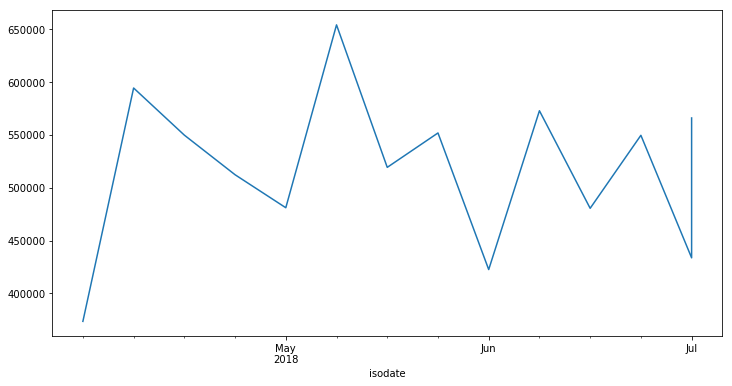

In [375]:
df_nonstationary30['Fc_and_order'].plot(figsize=(12,6))

In [453]:
fcast30 = _create_output(df_nonstationary30['Fc_and_order'],'Product_30')

##### ARIMA forecast into the future

In [376]:
auto_arima(df30['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                  220
Model:                     ARMA(2, 2)   Log Likelihood               -2818.956
Method:                       css-mle   S.D. of innovations          87811.427
Date:                Sun, 12 Jun 2022   AIC                           5649.912
Time:                        11:07:40   BIC                           5670.274
Sample:                             0   HQIC                          5658.135
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.289e+05   8690.833     49.352      0.000    4.12e+05    4.46e+05
ar.L1.y        1.8895      0.024     79.962      0.000       1.843       1.936
ar.L2.y       -0.9479      0.023    -40.929      0.000      -0.993      -0.903
ma.L1.y       -1.9127      0.033    -58.189      0.000      -1.977      -1.848
ma.L2.y        0.9988      0.034     29.228      0.000       0.932       1.066
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9966           -0.2482j            1.0271           -0.0388
AR.2            0.9966           +0.2482j            1.0271            0.0388
MA.1            0.9575           -0.2904j            1.0006           -0.0469
MA.2            0.9575           +0.2904j            1.0006            0.0469
-----------------------------------------------------------------------------
"""

In [377]:
model = ARMA(df30['Billing'],order=(2,2))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                Billing   No. Observations:                  220
Model:                     ARMA(2, 2)   Log Likelihood               -2818.956
Method:                       css-mle   S.D. of innovations          87811.427
Date:                Sun, 12 Jun 2022   AIC                           5649.912
Time:                        11:07:48   BIC                           5670.274
Sample:                    04-01-2018   HQIC                          5658.135
                         - 01-26-2014                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          4.289e+05   8690.833     49.352      0.000    4.12e+05    4.46e+05
ar.L1.Billing     1.8895      0.024     79.962      0.000       1.843       1.936
ar.L2.Billing    -0.9479      0.023    -40.929      0.000      -0.993      -0.903
ma.L1.Billing    -1.9127      0.033    -58.189      0.000      -1.977      -1.848
ma.L2.Billing     0.9988      0.034     29.228      0.000       0.932       1.066
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            0.9966           -0.2482j            1.0271           -0.0388
AR.2            0.9966           +0.2482j            1.0271            0.0388
MA.1            0.9575           -0.2904j            1.0006           -0.0469
MA.2            0.9575           +0.2904j            1.0006            0.0469
-----------------------------------------------------------------------------
"""

In [378]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARMA (2,2) FORECAST')

In [379]:
len(fcast)

13

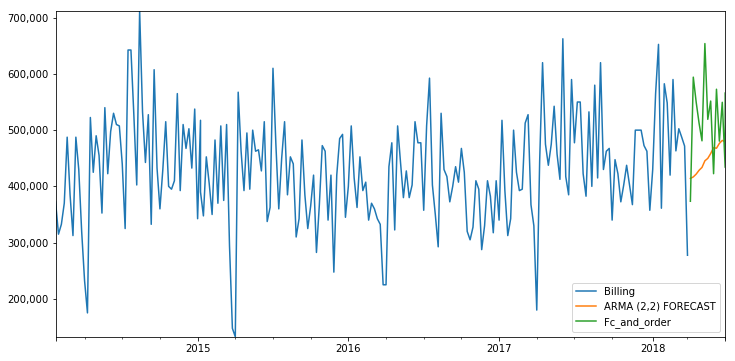

In [380]:
title = ''
ylabel = ''
xlabel = ''
ax = df30['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary30['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_39

In [381]:
df_nonstationary39

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_39,201814,1,201813,154579,NaN
2018-04-09/2018-04-15,Product_39,201815,2,201813,193912,NaN
2018-04-16/2018-04-22,Product_39,201816,3,201813,180161,NaN
2018-04-23/2018-04-29,Product_39,201817,4,201813,194755,NaN
2018-04-30/2018-05-06,Product_39,201818,5,201813,214519,NaN
2018-05-07/2018-05-13,Product_39,201819,6,201813,231185,NaN
2018-05-14/2018-05-20,Product_39,201820,7,201813,171568,NaN
2018-05-21/2018-05-27,Product_39,201821,8,201813,209185,NaN
2018-05-28/2018-06-03,Product_39,201822,9,201813,204345,NaN


In [382]:
df_nonstationary39['Fc_and_order'].mean()

200324.7142857143

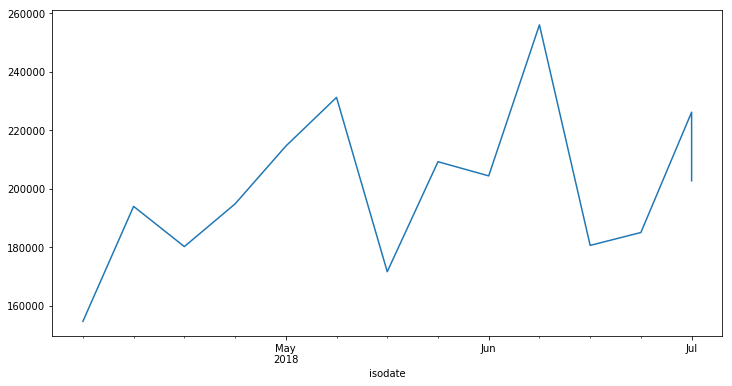

In [383]:
df_nonstationary39['Fc_and_order'].plot(figsize=(12,6))

In [454]:
fcast39 = _create_output(df_nonstationary39['Fc_and_order'],'Product_39')

##### ARIMA forecast into the future

In [384]:
auto_arima(df39['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2643.148
Method:                       css-mle   S.D. of innovations          37643.214
Date:                Sun, 12 Jun 2022   AIC                           5292.296
Time:                        11:08:58   BIC                           5302.490
Sample:                             1   HQIC                          5296.412
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -237.5750    149.465     -1.590      0.113    -530.521      55.371
ma.L1.D.y     -0.9460      0.026    -36.232      0.000      -0.997      -0.895
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0571           +0.0000j            1.0571            0.0000
-----------------------------------------------------------------------------
"""

In [385]:
model = ARIMA(df39['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2643.148
Method:                       css-mle   S.D. of innovations          37643.214
Date:                Sun, 12 Jun 2022   AIC                           5292.296
Time:                        11:09:40   BIC                           5302.490
Sample:                    03-25-2018   HQIC                          5296.412
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -237.5750    149.465     -1.590      0.113    -530.521      55.371
ma.L1.D.Billing    -0.9460      0.026    -36.232      0.000      -0.997      -0.895
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0571           +0.0000j            1.0571            0.0000
-----------------------------------------------------------------------------
"""

In [386]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (0,1,1) FORECAST')

In [387]:
len(fcast)

13

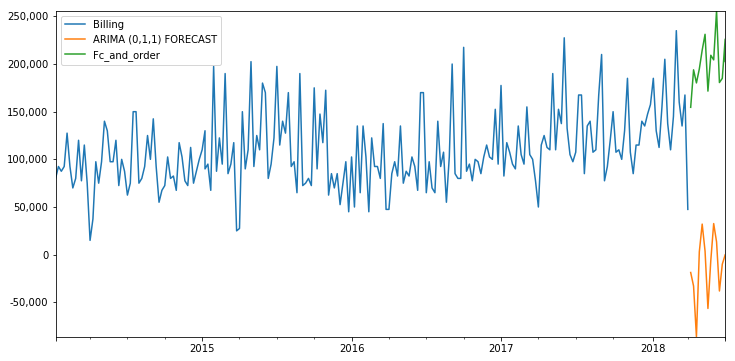

In [388]:
title = ''
ylabel = ''
xlabel = ''
ax = df39['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary39['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_48

In [389]:
df_nonstationary48

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_48,201814,1,201813,1624988,NaN
2018-04-09/2018-04-15,Product_48,201815,2,201813,1923863,NaN
2018-04-16/2018-04-22,Product_48,201816,3,201813,1893402,NaN
2018-04-23/2018-04-29,Product_48,201817,4,201813,1402202,NaN
2018-04-30/2018-05-06,Product_48,201818,5,201813,1625057,NaN
2018-05-07/2018-05-13,Product_48,201819,6,201813,2058319,NaN
2018-05-14/2018-05-20,Product_48,201820,7,201813,2136213,NaN
2018-05-21/2018-05-27,Product_48,201821,8,201813,2234104,NaN
2018-05-28/2018-06-03,Product_48,201822,9,201813,1913123,NaN


In [390]:
df_nonstationary48['Fc_and_order'].mean()

1940065.4285714286

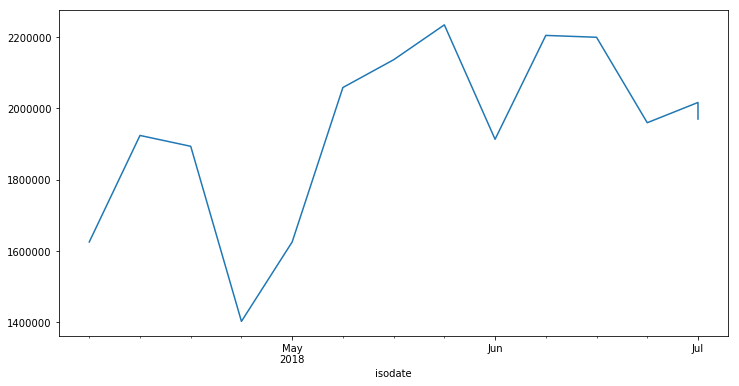

In [391]:
df_nonstationary48['Fc_and_order'].plot(figsize=(12,6))

In [457]:
fcast48 = _create_output(df_nonstationary48['Fc_and_order'],'Product_48')

##### ARIMA forecast into the future

In [392]:
auto_arima(df48['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -3058.174
Method:                       css-mle   S.D. of innovations         246586.850
Date:                Sun, 12 Jun 2022   AIC                           6122.348
Time:                        11:11:08   BIC                           6132.542
Sample:                             1   HQIC                          6126.464
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6098.4358   1979.203     -3.081      0.002   -9977.603   -2219.269
ma.L1.D.y     -0.8863      0.035    -25.228      0.000      -0.955      -0.817
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.1283           +0.0000j            1.1283            0.0000
-----------------------------------------------------------------------------
"""

In [396]:
model = ARIMA(df48['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -3058.174
Method:                       css-mle   S.D. of innovations         246586.850
Date:                Sun, 12 Jun 2022   AIC                           6122.348
Time:                        11:11:38   BIC                           6132.542
Sample:                    03-25-2018   HQIC                          6126.464
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -6098.4358   1979.203     -3.081      0.002   -9977.603   -2219.269
ma.L1.D.Billing    -0.8863      0.035    -25.228      0.000      -0.955      -0.817
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.1283           +0.0000j            1.1283            0.0000
-----------------------------------------------------------------------------
"""

In [397]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (0,1,1) FORECAST')

In [398]:
len(fcast)

13

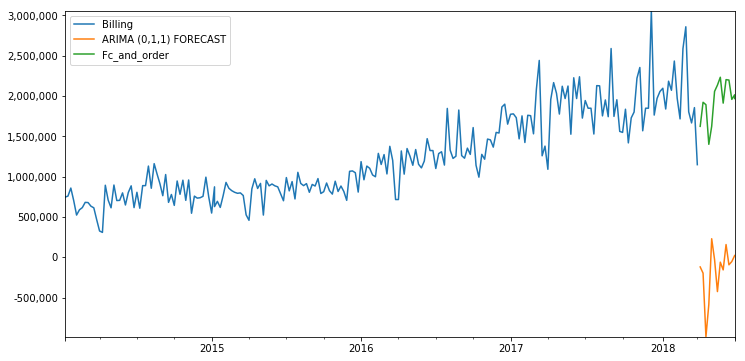

In [399]:
title = ''
ylabel = ''
xlabel = ''
ax = df48['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary48['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_50

In [400]:
df_nonstationary50

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_50,201814,1,201813,583608,NaN
2018-04-09/2018-04-15,Product_50,201815,2,201813,514446,NaN
2018-04-16/2018-04-22,Product_50,201816,3,201813,407514,NaN
2018-04-23/2018-04-29,Product_50,201817,4,201813,290258,NaN
2018-04-30/2018-05-06,Product_50,201818,5,201813,485031,NaN
2018-05-07/2018-05-13,Product_50,201819,6,201813,515170,NaN
2018-05-14/2018-05-20,Product_50,201820,7,201813,405338,NaN
2018-05-21/2018-05-27,Product_50,201821,8,201813,387993,NaN
2018-05-28/2018-06-03,Product_50,201822,9,201813,438728,NaN


In [401]:
df_nonstationary50['Fc_and_order'].mean()

449552.28571428574

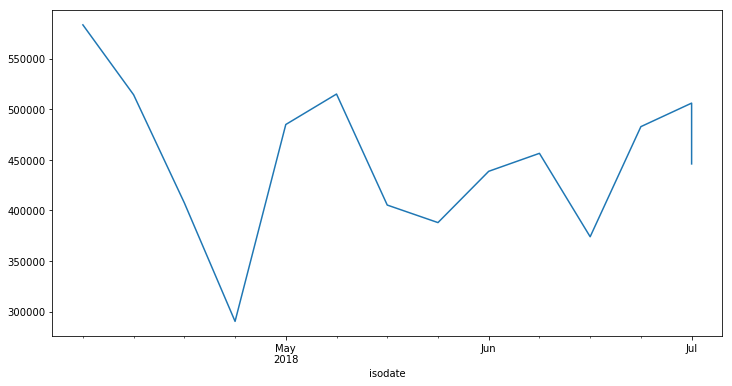

In [402]:
df_nonstationary50['Fc_and_order'].plot(figsize=(12,6))

In [458]:
fcast50 = _create_output(df_nonstationary50['Fc_and_order'],'Product_50')

##### ARIMA forecast into the future

In [403]:
auto_arima(df50['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2831.293
Method:                       css-mle   S.D. of innovations          87565.780
Date:                Sun, 12 Jun 2022   AIC                           5668.586
Time:                        11:13:09   BIC                           5678.780
Sample:                             1   HQIC                          5672.702
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1497.0465     91.705    -16.325      0.000   -1676.784   -1317.309
ma.L1.D.y     -0.9999      0.013    -75.265      0.000      -1.026      -0.974
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [404]:
model = ARIMA(df50['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -2831.293
Method:                       css-mle   S.D. of innovations          87565.780
Date:                Sun, 12 Jun 2022   AIC                           5668.586
Time:                        11:13:36   BIC                           5678.780
Sample:                    03-25-2018   HQIC                          5672.702
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -1497.0465     91.705    -16.325      0.000   -1676.784   -1317.309
ma.L1.D.Billing    -0.9999      0.013    -75.265      0.000      -1.026      -0.974
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [405]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (0,1,1) FORECAST')

In [406]:
len(fcast)

13

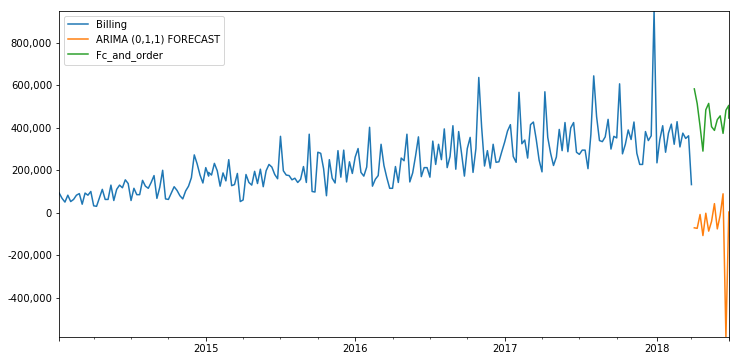

In [407]:
title = ''
ylabel = ''
xlabel = ''
ax = df50['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary50['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_55

In [408]:
df_nonstationary55

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_55,201814,1,201813,201842,NaN
2018-04-09/2018-04-15,Product_55,201815,2,201813,197714,NaN
2018-04-16/2018-04-22,Product_55,201816,3,201813,209930,NaN
2018-04-23/2018-04-29,Product_55,201817,4,201813,233423,NaN
2018-04-30/2018-05-06,Product_55,201818,5,201813,195318,NaN
2018-05-07/2018-05-13,Product_55,201819,6,201813,217878,NaN
2018-05-14/2018-05-20,Product_55,201820,7,201813,232548,NaN
2018-05-21/2018-05-27,Product_55,201821,8,201813,262943,NaN
2018-05-28/2018-06-03,Product_55,201822,9,201813,228955,NaN


In [409]:
df_nonstationary55['Fc_and_order'].mean()

229939.7857142857

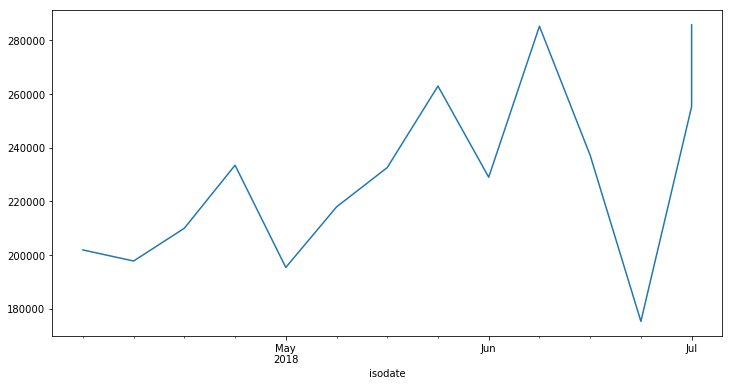

In [410]:
df_nonstationary55['Fc_and_order'].plot(figsize=(12,6))

In [459]:
fcast55 = _create_output(df_nonstationary55['Fc_and_order'],'Product_55')

##### ARIMA forecast into the future

In [411]:
auto_arima(df55['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2711.870
Method:                       css-mle   S.D. of innovations          51504.876
Date:                Sun, 12 Jun 2022   AIC                           5431.740
Time:                        11:15:46   BIC                           5445.332
Sample:                             1   HQIC                          5437.228
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -79.3173    554.173     -0.143      0.886   -1165.476    1006.841
ar.L1.D.y      0.1904      0.082      2.331      0.021       0.030       0.350
ma.L1.D.y     -0.8745      0.041    -21.343      0.000      -0.955      -0.794
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            5.2522           +0.0000j            5.2522            0.0000
MA.1            1.1435           +0.0000j            1.1435            0.0000
-----------------------------------------------------------------------------
"""

In [412]:
model = ARIMA(df55['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2711.870
Method:                       css-mle   S.D. of innovations          51504.876
Date:                Sun, 12 Jun 2022   AIC                           5431.740
Time:                        11:16:04   BIC                           5445.332
Sample:                    03-25-2018   HQIC                          5437.228
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -79.3173    554.173     -0.143      0.886   -1165.476    1006.841
ar.L1.D.Billing     0.1904      0.082      2.331      0.021       0.030       0.350
ma.L1.D.Billing    -0.8745      0.041    -21.343      0.000      -0.955      -0.794
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            5.2522           +0.0000j            5.2522            0.0000
MA.1            1.1435           +0.0000j            1.1435            0.0000
-----------------------------------------------------------------------------
"""

In [413]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (1,1,1) FORECAST')

In [414]:
len(fcast)

13

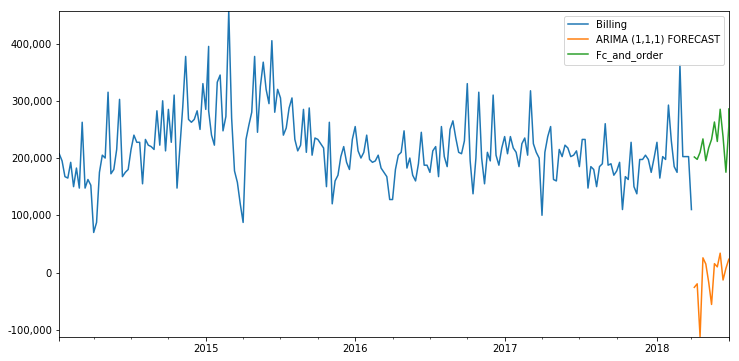

In [415]:
title = ''
ylabel = ''
xlabel = ''
ax = df55['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary55['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_57

In [416]:
df_nonstationary57

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_57,201814,1,201813,160000,NaN
2018-04-09/2018-04-15,Product_57,201815,2,201813,217500,NaN
2018-04-16/2018-04-22,Product_57,201816,3,201813,175000,NaN
2018-04-23/2018-04-29,Product_57,201817,4,201813,142500,NaN
2018-04-30/2018-05-06,Product_57,201818,5,201813,162500,NaN
2018-05-07/2018-05-13,Product_57,201819,6,201813,127500,NaN
2018-05-14/2018-05-20,Product_57,201820,7,201813,205000,NaN
2018-05-21/2018-05-27,Product_57,201821,8,201813,140000,NaN
2018-05-28/2018-06-03,Product_57,201822,9,201813,112500,NaN


In [417]:
df_nonstationary57['Fc_and_order'].mean()

169821.42857142858

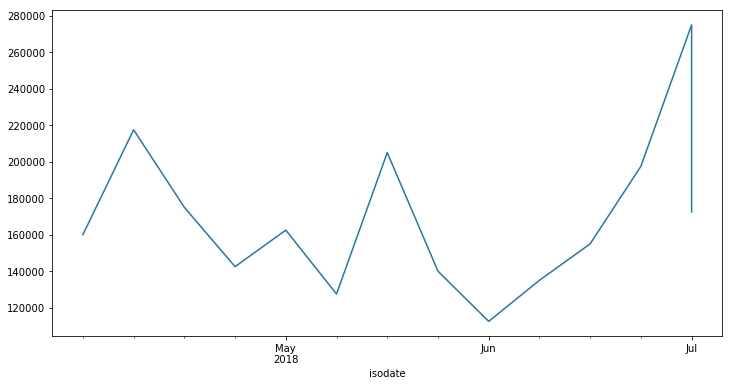

In [418]:
df_nonstationary57['Fc_and_order'].plot(figsize=(12,6))

In [460]:
fcast57 = _create_output(df_nonstationary57['Fc_and_order'],'Product_57')

##### ARIMA forecast into the future

In [419]:
auto_arima(df57['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2712.577
Method:                       css-mle   S.D. of innovations          51209.310
Date:                Sun, 12 Jun 2022   AIC                           5433.153
Time:                        11:16:57   BIC                           5446.746
Sample:                             1   HQIC                          5438.642
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -162.6567     63.388     -2.566      0.011    -286.896     -38.418
ar.L1.D.y      0.1558      0.067      2.319      0.021       0.024       0.287
ma.L1.D.y     -0.9999      0.012    -80.018      0.000      -1.024      -0.975
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            6.4183           +0.0000j            6.4183            0.0000
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [420]:
model = ARIMA(df57['Billing'],order=(1,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2712.577
Method:                       css-mle   S.D. of innovations          51209.310
Date:                Sun, 12 Jun 2022   AIC                           5433.153
Time:                        11:17:10   BIC                           5446.746
Sample:                    03-25-2018   HQIC                          5438.642
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -162.6567     63.388     -2.566      0.011    -286.896     -38.418
ar.L1.D.Billing     0.1558      0.067      2.319      0.021       0.024       0.287
ma.L1.D.Billing    -0.9999      0.012    -80.018      0.000      -1.024      -0.975
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            6.4183           +0.0000j            6.4183            0.0000
MA.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

In [421]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (1,1,1) FORECAST')

In [422]:
len(fcast)

13

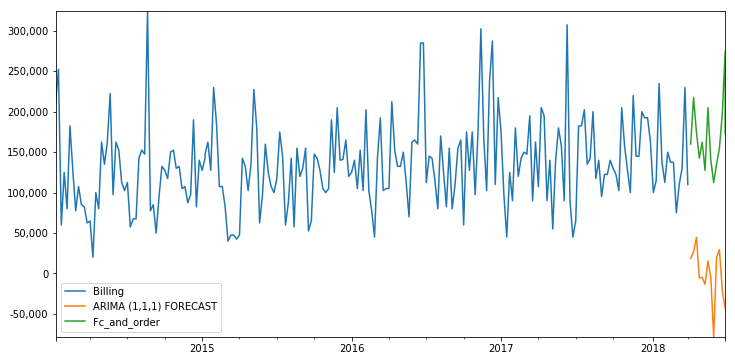

In [423]:
title = ''
ylabel = ''
xlabel = ''
ax = df57['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary57['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

### Product_67

In [424]:
df_nonstationary67

,Sp_number,Due_date,Fc_horizon,Fc_date,Fc_and_order,Billing
isodate,,,,,,
2018-04-02/2018-04-08,Product_67,201814,1,201813,1016633,NaN
2018-04-09/2018-04-15,Product_67,201815,2,201813,1101631,NaN
2018-04-16/2018-04-22,Product_67,201816,3,201813,1283328,NaN
2018-04-23/2018-04-29,Product_67,201817,4,201813,789859,NaN
2018-04-30/2018-05-06,Product_67,201818,5,201813,892273,NaN
2018-05-07/2018-05-13,Product_67,201819,6,201813,905390,NaN
2018-05-14/2018-05-20,Product_67,201820,7,201813,916698,NaN
2018-05-21/2018-05-27,Product_67,201821,8,201813,917479,NaN
2018-05-28/2018-06-03,Product_67,201822,9,201813,793915,NaN


In [425]:
df_nonstationary67['Fc_and_order'].mean()

945697.0714285715

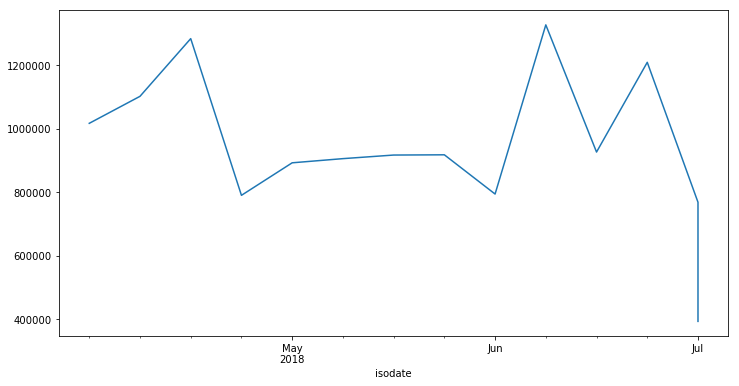

In [426]:
df_nonstationary67['Fc_and_order'].plot(figsize=(12,6))

In [461]:
fcast67 = _create_output(df_nonstationary67['Fc_and_order'],'Product_67')

##### ARIMA forecast into the future

In [427]:
auto_arima(df67['Billing'],seasonal=False).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                    D.y   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -3052.411
Method:                       css-mle   S.D. of innovations         240458.296
Date:                Sun, 12 Jun 2022   AIC                           6110.822
Time:                        11:18:19   BIC                           6121.016
Sample:                             1   HQIC                          6114.938
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2194.5701   2907.779     -0.755      0.451   -7893.712    3504.572
ma.L1.D.y     -0.8243      0.038    -21.438      0.000      -0.900      -0.749
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.2132           +0.0000j            1.2132            0.0000
-----------------------------------------------------------------------------
"""

In [428]:
model = ARIMA(df67['Billing'],order=(0,1,1))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:              D.Billing   No. Observations:                  221
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -3052.411
Method:                       css-mle   S.D. of innovations         240458.296
Date:                Sun, 12 Jun 2022   AIC                           6110.822
Time:                        11:18:31   BIC                           6121.016
Sample:                    03-25-2018   HQIC                          6114.938
                         - 01-12-2014                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -2194.5701   2907.779     -0.755      0.451   -7893.712    3504.572
ma.L1.D.Billing    -0.8243      0.038    -21.438      0.000      -0.900      -0.749
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1            1.2132           +0.0000j            1.2132            0.0000
-----------------------------------------------------------------------------
"""

In [429]:
fcast = results.predict(start='2018-04-02',end='2018-07-01').rename('ARIMA (0,1,1) FORECAST')

In [430]:
len(fcast)

13

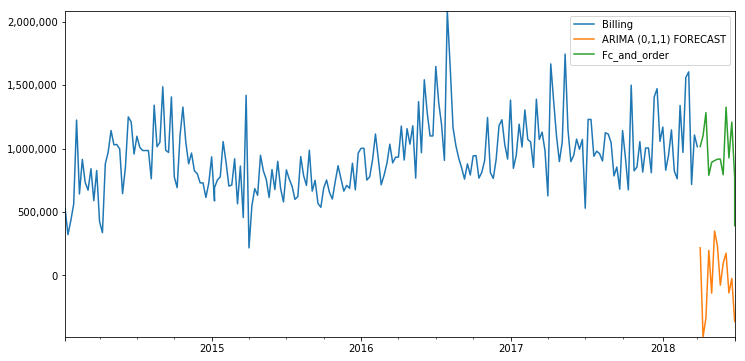

In [431]:
title = ''
ylabel = ''
xlabel = ''
ax = df67['Billing'].plot(figsize=(12,6),legend=True,title=title);
fcast.plot(legend=True)
df_nonstationary67['Fc_and_order'].plot(legend=True)
ax.autoscale(axis='both',tight=True);
ax.set(xlabel=xlabel,ylabel=ylabel);

import matplotlib.ticker as ticker
formatter = ticker.StrMethodFormatter('{x:,.0f}')
ax.yaxis.set_major_formatter(formatter);

## Export values for Q2/2018

In [462]:
save_forecast ([fcast19,fcast20,fcast22,fcast30,fcast39,fcast48,fcast50,fcast55,fcast57,fcast67])

SUCCESSFULLY SAVED IN C:\Users\tammo\OneDrive\Desktop\FC\FORECAST_2018_Q2.xlsx


# Test: Use Fc_and_order as auto_arima() input